<a href="https://colab.research.google.com/github/Samy-Annasri/backcasting-for-adversarial-attacks-on-time-series/blob/main/BATS_Sunspots.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import torch
from torchvision import datasets, transforms
from torch.utils.data import DataLoader, Dataset,TensorDataset
import torch.nn as nn
import torch.optim as optim
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
import pandas as pd
import numpy as np
import random
from datetime import datetime
import os
from sklearn.metrics import mean_absolute_error, mean_squared_error

In [ ]:
import sys
import os

def in_colab():
    return 'google.colab' in sys.modules

if in_colab():
    repo_name = "ReverseForecastAttack"
    ipynb_name = "ReverseForecastAttack.ipynb"
    cwd = os.getcwd()
    basename = os.path.basename(cwd)

    if basename != repo_name:
        if not os.path.exists(repo_name):
            !git clone https://github.com/Samy-Annasri/ReverseForecastAttack.git
        %cd {repo_name}
        %rm {ipynb_name}

In [ ]:
seed = 888
def set_seed(seed):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
    os.environ['PYTHONHASHSEED'] = str(seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

set_seed(seed)

In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

Using device: cuda


In [ ]:
from utils.solar.load_tsf import load_solar_tsf_flat
df = load_solar_tsf_flat("data/sunspot_dataset_without_missing_values.tsf")
print(df)

            date  sunspot
0     1818-01-08     65.0
1     1818-01-09     65.0
2     1818-01-10     65.0
3     1818-01-11     65.0
4     1818-01-12     65.0
...          ...      ...
73919 2020-05-27      0.0
73920 2020-05-28      0.0
73921 2020-05-29      0.0
73922 2020-05-30      0.0
73923 2020-05-31      2.0

[73924 rows x 2 columns]


count    73924.000000
mean        83.647773
std         77.873408
min          0.000000
25%         22.000000
50%         63.000000
75%        128.000000
max        528.000000
Name: sunspot, dtype: float64


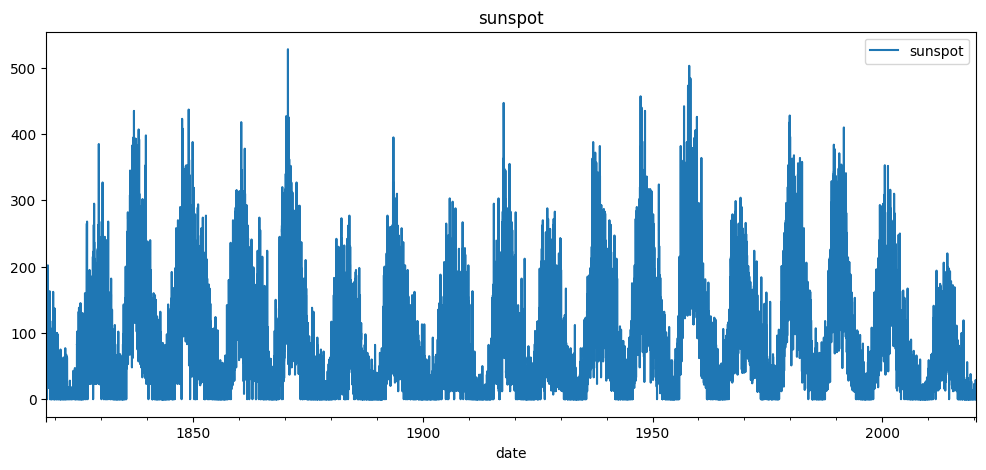

In [ ]:
print(df["sunspot"].describe())

import matplotlib.pyplot as plt
df.plot(x="date", y="sunspot", figsize=(12,5), title="sunspot")
plt.show()


In [ ]:
import numpy as np
import torch
from torch.utils.data import DataLoader, TensorDataset

def prepare_solar_dataset(
    df,
    sequence_length=30,
    batch_size=64,
    split_ratio=0.8,
    reverse=False
):
    # Extraction de la série (numpy array)
    serie = df["sunspot"].values.astype(float)

    # Normalisation min-max
    serie_min = np.min(serie)
    serie_max = np.max(serie)
    serie_norm = (serie - serie_min) / (serie_max - serie_min + 1e-8)  # pour éviter /0

    X, Y, used_dates = [], [], []

    if not reverse:
        for i in range(len(serie_norm) - sequence_length):
            X.append(serie_norm[i:i + sequence_length])
            Y.append(serie_norm[i + sequence_length])
            used_dates.append(df["date"].iloc[i + sequence_length])
    else:
        for i in range(sequence_length, len(serie_norm)):
            seq = serie_norm[i-sequence_length:i][::-1]
            target_idx = i - sequence_length
            X.append(seq)
            Y.append(serie_norm[target_idx])
            used_dates.append(df["date"].iloc[target_idx])

    X = np.array(X)
    Y = np.array(Y)

    split = int(len(X) * split_ratio)
    X_train, X_test = X[:split], X[split:]
    Y_train, Y_test = Y[:split], Y[split:]

    dates_train = used_dates[:split]
    dates_test = used_dates[split:]

    X_train = torch.tensor(X_train, dtype=torch.float32).unsqueeze(-1)
    Y_train = torch.tensor(Y_train, dtype=torch.float32).unsqueeze(-1)
    X_test = torch.tensor(X_test, dtype=torch.float32).unsqueeze(-1)
    Y_test = torch.tensor(Y_test, dtype=torch.float32).unsqueeze(-1)

    train_loader = DataLoader(TensorDataset(X_train, Y_train), batch_size=batch_size, shuffle=True, drop_last=True)
    test_loader = DataLoader(TensorDataset(X_test, Y_test), batch_size=batch_size, drop_last=True)

    return {
        'train_loader': train_loader,
        'test_loader': test_loader,
        'train_size': len(X_train),
        'test_size': len(X_test),
        'min_max': (serie_min, serie_max),
        'dates_train': dates_train,
        'dates_test': dates_test,
        'X_all': torch.tensor(X, dtype=torch.float32).unsqueeze(-1),
        'Y_all': torch.tensor(Y, dtype=torch.float32).unsqueeze(-1)
    }


In [ ]:
sequence_length = 30
result = prepare_solar_dataset(df, sequence_length)

train_loader = result['train_loader']
test_loader = result['test_loader']
train_size = result['train_size']
serie_min, serie_max = result['min_max']
dates = result['dates_train']
dates_test = result['dates_test']
print(dates)

[Timestamp('1818-02-07 00:00:00'), Timestamp('1818-02-08 00:00:00'), Timestamp('1818-02-09 00:00:00'), Timestamp('1818-02-10 00:00:00'), Timestamp('1818-02-11 00:00:00'), Timestamp('1818-02-12 00:00:00'), Timestamp('1818-02-13 00:00:00'), Timestamp('1818-02-14 00:00:00'), Timestamp('1818-02-15 00:00:00'), Timestamp('1818-02-16 00:00:00'), Timestamp('1818-02-17 00:00:00'), Timestamp('1818-02-18 00:00:00'), Timestamp('1818-02-19 00:00:00'), Timestamp('1818-02-20 00:00:00'), Timestamp('1818-02-21 00:00:00'), Timestamp('1818-02-22 00:00:00'), Timestamp('1818-02-23 00:00:00'), Timestamp('1818-02-24 00:00:00'), Timestamp('1818-02-25 00:00:00'), Timestamp('1818-02-26 00:00:00'), Timestamp('1818-02-27 00:00:00'), Timestamp('1818-02-28 00:00:00'), Timestamp('1818-03-01 00:00:00'), Timestamp('1818-03-02 00:00:00'), Timestamp('1818-03-03 00:00:00'), Timestamp('1818-03-04 00:00:00'), Timestamp('1818-03-05 00:00:00'), Timestamp('1818-03-06 00:00:00'), Timestamp('1818-03-07 00:00:00'), Timestamp('18

In [ ]:
#name model_elec but work also with solar/birth btw
from utils.elec.train_model_elec import train_models_elec

In [ ]:
from models.lstm import SimpleLSTM
model = SimpleLSTM(input_size=1, hidden_size=64, output_size=1, num_layers=2)
model.to(device)
loss_fn = nn.MSELoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)
num_epochs = 10

train_models_elec(model, loss_fn, optimizer, num_epochs, train_loader,device)

Epoch [1/10], Train Loss: 0.0037
Epoch [2/10], Train Loss: 0.0021
Epoch [3/10], Train Loss: 0.0020
Epoch [4/10], Train Loss: 0.0020
Epoch [5/10], Train Loss: 0.0020
Epoch [6/10], Train Loss: 0.0020
Epoch [7/10], Train Loss: 0.0020
Epoch [8/10], Train Loss: 0.0020
Epoch [9/10], Train Loss: 0.0020
Epoch [10/10], Train Loss: 0.0020


In [ ]:
from utils.birth.evaluate_model_births import evaluate_model_births

In [ ]:
results = evaluate_model_births(model, test_loader, dates_test, train_size)

real_values = results['real_values']
predicted_values = results['predicted_values']
test_dates = results['test_dates']

In [ ]:
# Computes scalar similarity (cosine similarity) between true and predicted values.
# Higher values indicate that adversarial predictions remain directionally aligned
# with the true values, suggesting stealthy and rational attacks!
def scalar_similarity(y_true, y_pred):
    numerator = np.dot(y_true, y_pred)
    denominator = np.linalg.norm(y_true) * np.linalg.norm(y_pred)
    if denominator == 0:
        return 0.0
    return numerator / denominator

In [ ]:
# Creation of the tab result for plotting adversial attack result
models = ['LSTM','RNN','GRU']
metrics = ['MAE', "RMSE", 'SIM']

row_index = pd.MultiIndex.from_product([models, metrics], names=['Model', 'Metric'])

attacks = ['NA','PAST','REV']
epsilons = {
    'NA': [0],
    'PAST':[0],
    'REV':[0.01, 0.02, 0.03, 0.04, 0.05, 0.075, 0.1, 0.2],
}

col_tuples = []
for atk, eps_list in epsilons.items():
    for eps in eps_list:
        col_tuples.append((atk, f"{eps:.2f}"))

col_index = pd.MultiIndex.from_tuples(col_tuples, names=['Attack', 'ε'])

res_tab = pd.DataFrame(index=row_index, columns=col_index, dtype=float)

print(res_tab)

Attack         NA PAST  REV                                   
ε            0.00 0.00 0.01 0.02 0.03 0.04 0.05 0.07 0.10 0.20
Model Metric                                                  
LSTM  MAE     NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN
      RMSE    NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN
      SIM     NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN
RNN   MAE     NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN
      RMSE    NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN
      SIM     NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN
GRU   MAE     NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN
      RMSE    NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN
      SIM     NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN


In [ ]:
from utils.solar.log_and_plot_solar import log_and_plot_solar

LSTM | NA – Epsilon 0.00 – MAE: 3.6150 | SIM: 0.7476 | RMSE: 4.3037


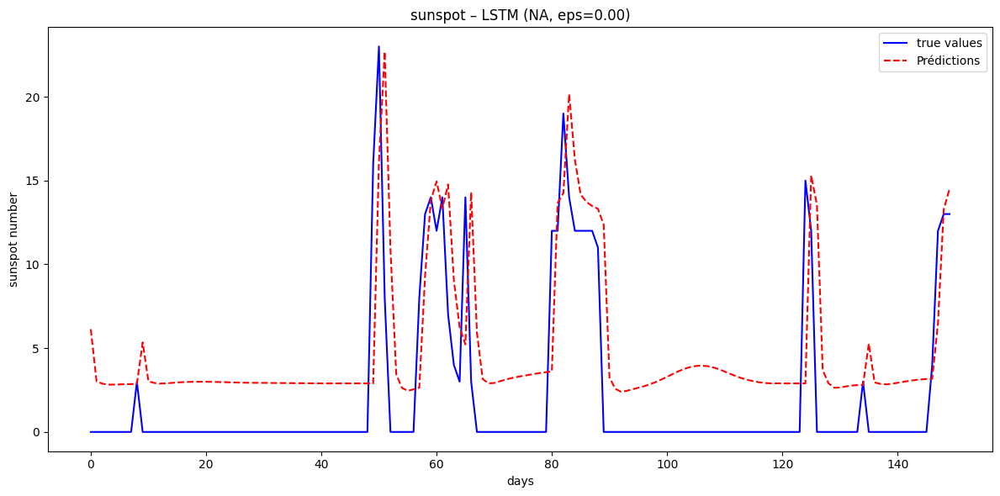

In [ ]:
# Dénormalisation
real_values_denorm = results['real_values'] * (serie_max - serie_min) + serie_min
predicted_values_denorm = results['predicted_values'] * (serie_max - serie_min) + serie_min

days_plot = 150

log_and_plot_solar(
    true_values=real_values_denorm[-days_plot:],
    predictions=predicted_values_denorm[-days_plot:],
    model_name='LSTM',
    attack_name='NA',
    epsilon=0.0,
    res_tab=res_tab,
    similarity_fn=scalar_similarity,
    save_path=f"results/solar/SEED_{seed}/plots/NA/0",
    save_png=True
)


In [ ]:
result_rev = prepare_solar_dataset(df, sequence_length,reverse=True)

train_loader_rev = result_rev['train_loader']
test_loader_rev = result_rev['test_loader']
train_size_rev = result_rev['train_size']
serie_min_rev, serie_max_rev = result_rev['min_max']
dates_rev = result_rev['dates_test']

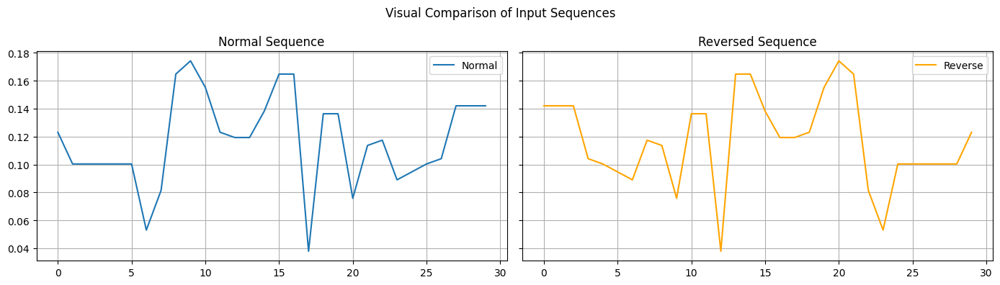

In [ ]:
fig, axs = plt.subplots(1, 2, figsize=(14, 4), sharey=True)

axs[0].plot(result['X_all'][100].squeeze(), label='Normal')
axs[0].set_title("Normal Sequence")
axs[0].legend()
axs[0].grid(True)

axs[1].plot(result_rev['X_all'][100].squeeze(), label='Reverse', color='orange')
axs[1].set_title("Reversed Sequence")
axs[1].legend()
axs[1].grid(True)

plt.suptitle("Visual Comparison of Input Sequences")
plt.tight_layout()
plt.show()

In [ ]:
model_rev = SimpleLSTM(input_size=1, hidden_size=64, output_size=1, num_layers=2)
optimizer_rev = torch.optim.Adam(model_rev.parameters(), lr=0.001)
model_rev.to(device)
train_models_elec(model_rev, loss_fn, optimizer_rev, num_epochs, train_loader_rev,device)

Epoch [1/10], Train Loss: 0.0017
Epoch [2/10], Train Loss: 0.0001
Epoch [3/10], Train Loss: 0.0001
Epoch [4/10], Train Loss: 0.0001
Epoch [5/10], Train Loss: 0.0001
Epoch [6/10], Train Loss: 0.0001
Epoch [7/10], Train Loss: 0.0000
Epoch [8/10], Train Loss: 0.0000
Epoch [9/10], Train Loss: 0.0000
Epoch [10/10], Train Loss: 0.0000


In [ ]:
results_rev = evaluate_model_births(model_rev, test_loader_rev, dates_rev, train_size_rev)

real_values_rev = results_rev['real_values']
predicted_values_rev = results_rev['predicted_values']
test_dates_rev = results_rev['test_dates']

LSTM | PAST – Epsilon 0.00 – MAE: 0.7638 | SIM: 0.9887 | RMSE: 0.7747


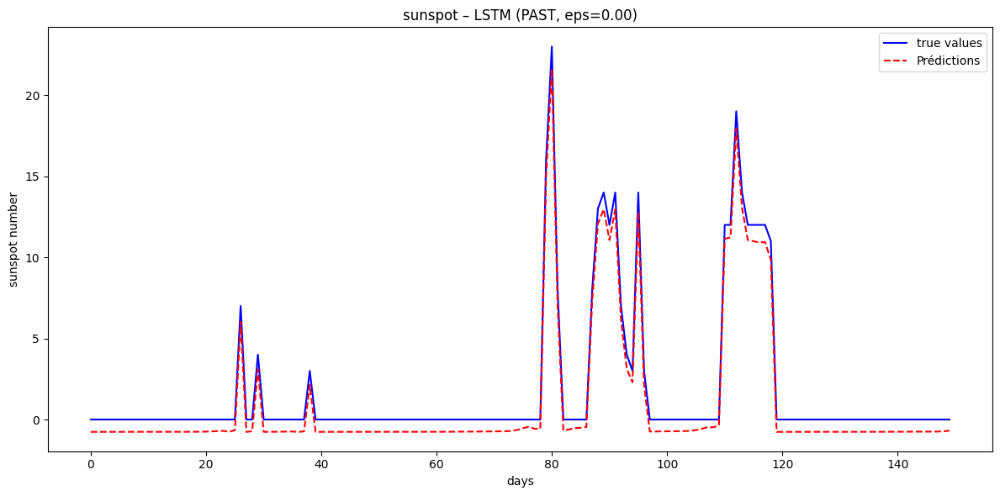

In [ ]:
# Denormalize
true_values_denorm_rev = real_values_rev * (serie_max_rev - serie_min_rev) + serie_min_rev
predictions_denorm_rev = predicted_values_rev * (serie_max_rev - serie_min_rev) + serie_min_rev

log_and_plot_solar(
    true_values=true_values_denorm_rev[-days_plot:],
    predictions=predictions_denorm_rev[-days_plot:],
    model_name='LSTM',
    attack_name='PAST',
    epsilon=0.00,
    res_tab=res_tab,
    similarity_fn=scalar_similarity,
    save_path=f"results/solar/SEED_{seed}/plots/PAST/0",
    save_png=True
)

LSTM | REV – Epsilon 0.01 – MAE: 5.5607 | SIM: 0.5698 | RMSE: 6.4019


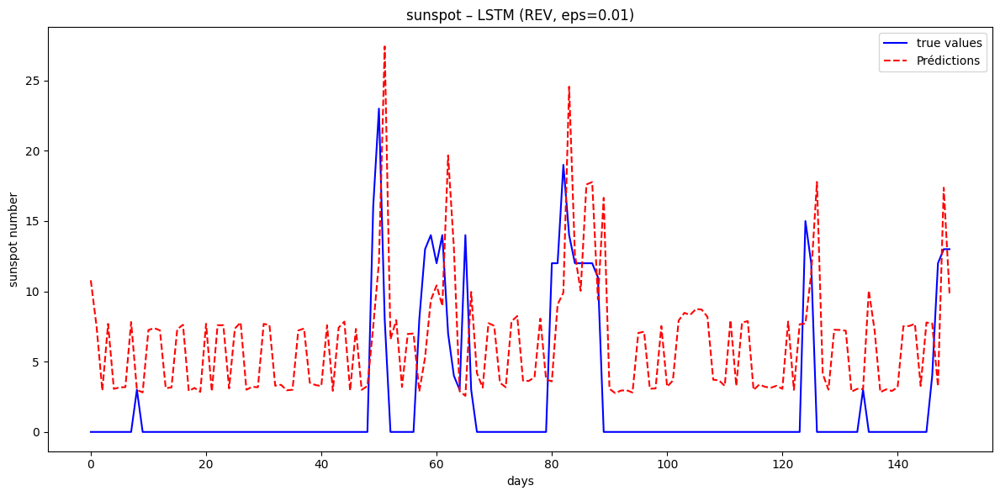

LSTM | REV – Epsilon 0.02 – MAE: 6.7748 | SIM: 0.4288 | RMSE: 8.0571


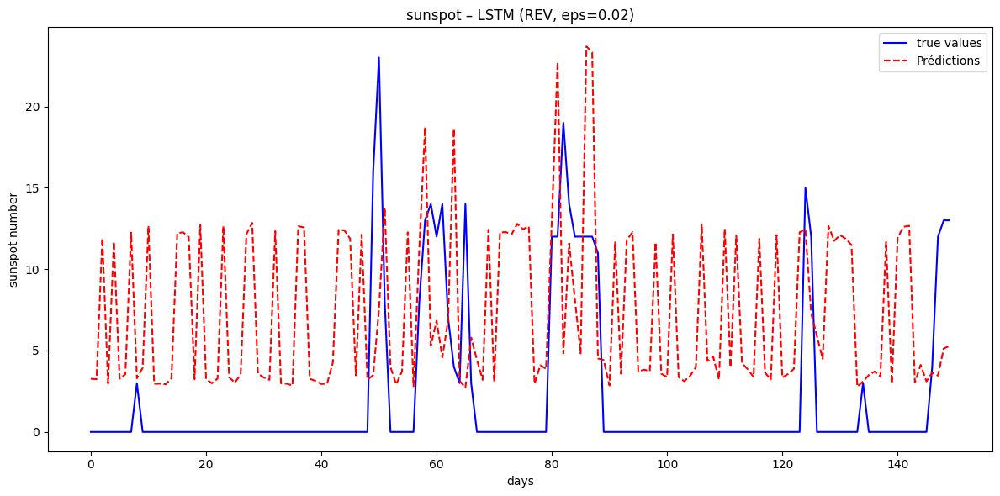

LSTM | REV – Epsilon 0.03 – MAE: 10.0762 | SIM: 0.4943 | RMSE: 12.1577


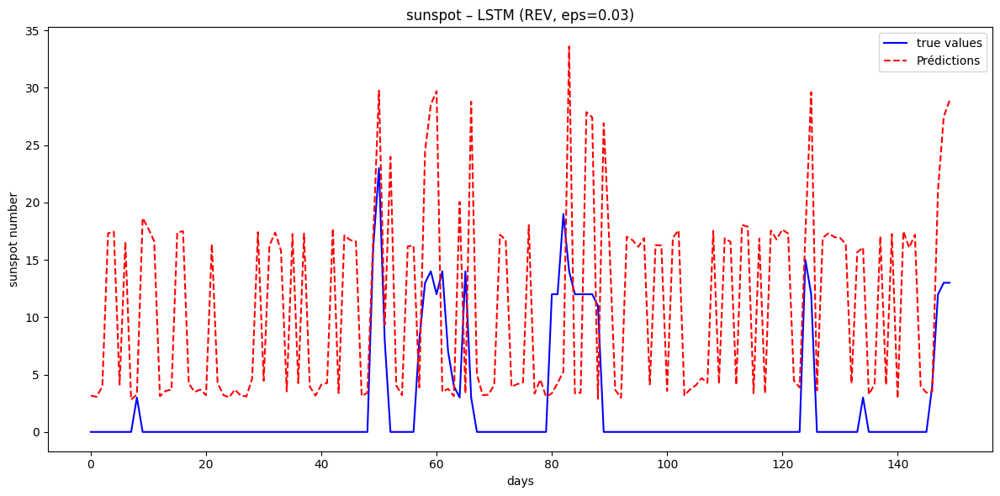

LSTM | REV – Epsilon 0.04 – MAE: 11.0397 | SIM: 0.3983 | RMSE: 13.8427


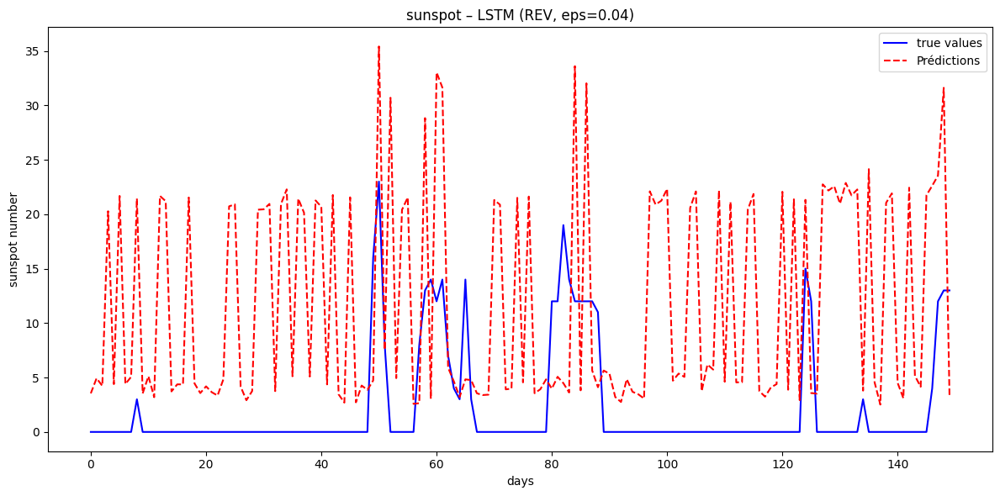

LSTM | REV – Epsilon 0.05 – MAE: 15.0690 | SIM: 0.3911 | RMSE: 18.6750


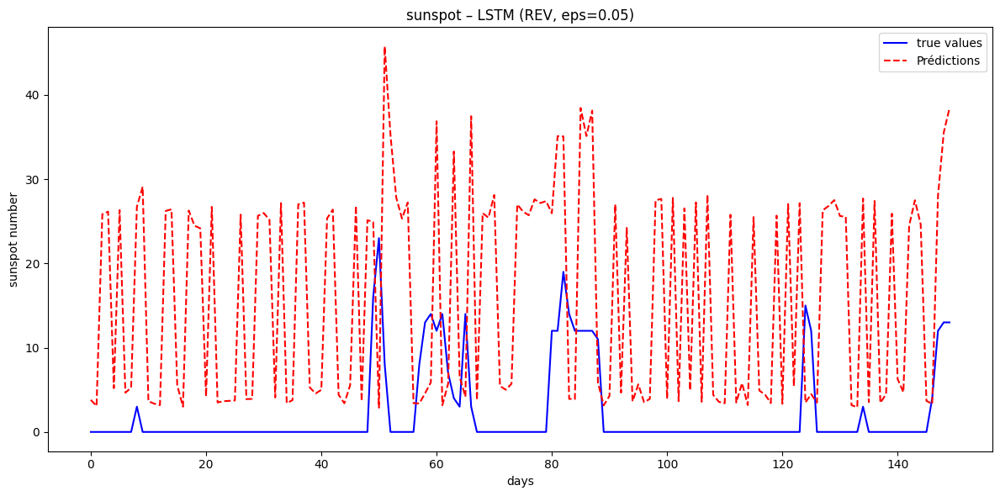

LSTM | REV – Epsilon 0.07 – MAE: 17.5903 | SIM: 0.3831 | RMSE: 23.9264


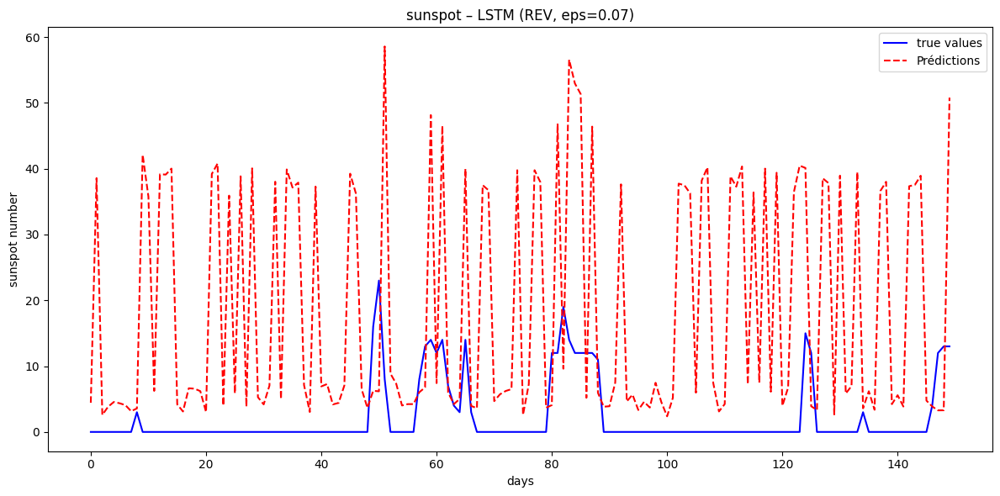

LSTM | REV – Epsilon 0.10 – MAE: 21.1747 | SIM: 0.3081 | RMSE: 30.1235


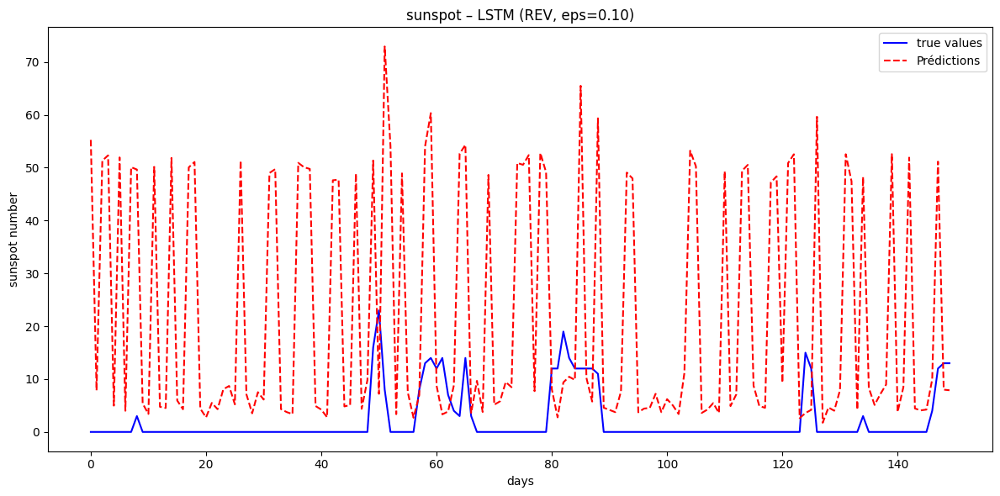

LSTM | REV – Epsilon 0.20 – MAE: 45.8536 | SIM: 0.2611 | RMSE: 63.5137


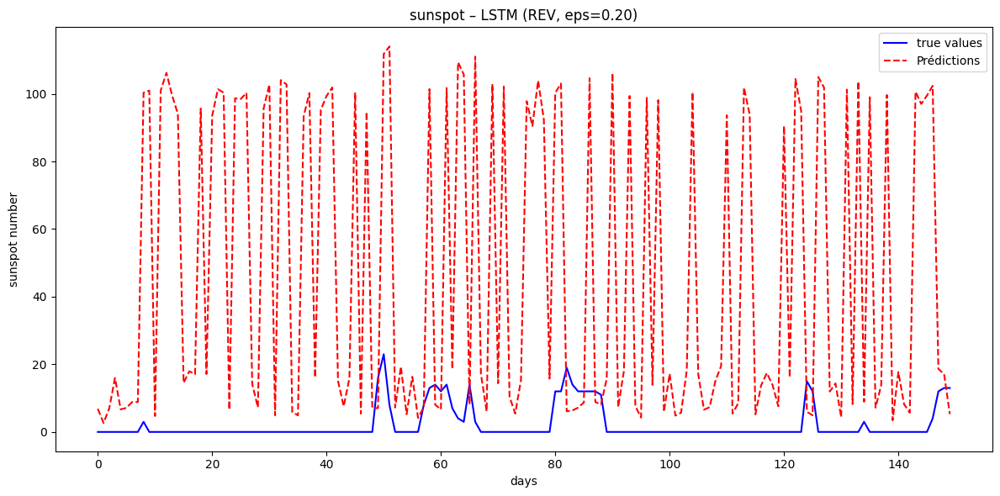

In [ ]:
from attack.rev import reverse_forecast_attack

epsilons = [0.01, 0.02, 0.03, 0.04, 0.05, 0.075, 0.1, 0.2]
results = reverse_forecast_attack(
    model_rev, model,
    test_loader_rev, test_loader,
    epsilons,
    serie_min_rev, serie_max_rev
)

for esp, (true_vals, preds) in results.items():
  log_and_plot_solar(
      true_values=true_vals[-days_plot:],
      predictions=preds[-days_plot:],
      model_name='LSTM',
      attack_name='REV',
      epsilon=esp,
      res_tab=res_tab,
      similarity_fn=scalar_similarity,
      save_path=f"results/solar/SEED_{seed}/plots/REV/{esp}",
      save_png=True
  )

In [ ]:
display(res_tab)

Attack              NA      PAST       REV                                  \
ε                 0.00      0.00      0.01      0.02       0.03       0.04   
Model Metric                                                                 
LSTM  MAE     3.615005  0.763786  5.560682  6.774807  10.076182  11.039740   
      RMSE    4.303700  0.774650  6.401887  8.057109  12.157676  13.842708   
      SIM     0.747615  0.988682  0.569753  0.428765   0.494338   0.398318   
RNN   MAE          NaN       NaN       NaN       NaN        NaN        NaN   
      RMSE         NaN       NaN       NaN       NaN        NaN        NaN   
      SIM          NaN       NaN       NaN       NaN        NaN        NaN   
GRU   MAE          NaN       NaN       NaN       NaN        NaN        NaN   
      RMSE         NaN       NaN       NaN       NaN        NaN        NaN   
      SIM          NaN       NaN       NaN       NaN        NaN        NaN   

Attack                                                    
ε                  0.05       0.07       0.10       0.20  
Model Metric                                              
LSTM  MAE     15.068969  17.590271  21.174702  45.853580  
      RMSE    18.674997  23.926355  30.123519  63.513677  
      SIM      0.391148   0.383101   0.308120   0.261099  
RNN   MAE           NaN        NaN        NaN        NaN  
      RMSE          NaN        NaN        NaN        NaN  
      SIM           NaN        NaN        NaN        NaN  
GRU   MAE           NaN        NaN        NaN        NaN  
      RMSE          NaN        NaN        NaN        NaN  
      SIM           NaN        NaN        NaN        NaN

In [ ]:
from models.rnn import SimpleRNN
model_rnn = SimpleRNN(input_size=1, hidden_size=64, output_size=1, num_layers=2)
model_rnn.to(device)
optimizer = torch.optim.Adam(model_rnn.parameters(), lr=0.001)
train_models_elec(model_rnn, loss_fn, optimizer, num_epochs, train_loader,device)

Epoch [1/10], Train Loss: 0.0025
Epoch [2/10], Train Loss: 0.0020
Epoch [3/10], Train Loss: 0.0020
Epoch [4/10], Train Loss: 0.0020
Epoch [5/10], Train Loss: 0.0020
Epoch [6/10], Train Loss: 0.0020
Epoch [7/10], Train Loss: 0.0020
Epoch [8/10], Train Loss: 0.0020
Epoch [9/10], Train Loss: 0.0020
Epoch [10/10], Train Loss: 0.0020


RNN | NA – Epsilon 0.00 – MAE: 4.5575 | SIM: 0.4583 | RMSE: 5.3595


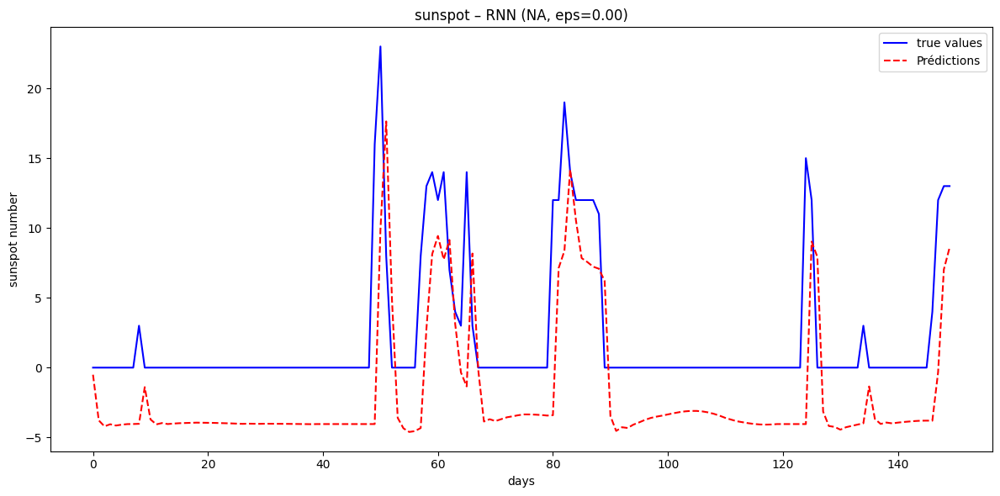

In [ ]:
results_rnn = evaluate_model_births(model_rnn, test_loader, dates, train_size)

real_values_rnn = results_rnn['real_values']
predicted_values_rnn = results_rnn['predicted_values']
test_dates_rnn = results_rnn['test_dates']

true_values_denorm_rnn = real_values_rnn * (serie_max - serie_min) + serie_min
predictions_denorm_rnn = predicted_values_rnn * (serie_max - serie_min) + serie_min

log_and_plot_solar(
    true_values=true_values_denorm_rnn[-days_plot:],
    predictions=predictions_denorm_rnn[-days_plot:],
    model_name='RNN',
    attack_name='NA',
    epsilon=0.00,
    res_tab=res_tab,
    similarity_fn=scalar_similarity,
    save_path=f"results/solar/SEED_{seed}/plots/PAST/0",
    save_png=True
)

In [ ]:
model_rnn_rev = SimpleRNN(input_size=1, hidden_size=64, output_size=1, num_layers=2)
model_rnn_rev.to(device)
optimizer = torch.optim.Adam(model_rnn_rev.parameters(), lr=0.001)
train_models_elec(model_rnn_rev, loss_fn, optimizer, num_epochs, train_loader_rev,device)

Epoch [1/10], Train Loss: 0.0004
Epoch [2/10], Train Loss: 0.0000
Epoch [3/10], Train Loss: 0.0000
Epoch [4/10], Train Loss: 0.0000
Epoch [5/10], Train Loss: 0.0000
Epoch [6/10], Train Loss: 0.0000
Epoch [7/10], Train Loss: 0.0000
Epoch [8/10], Train Loss: 0.0000
Epoch [9/10], Train Loss: 0.0000
Epoch [10/10], Train Loss: 0.0000


RNN | PAST – Epsilon 0.00 – MAE: 0.0201 | SIM: 1.0000 | RMSE: 0.0320


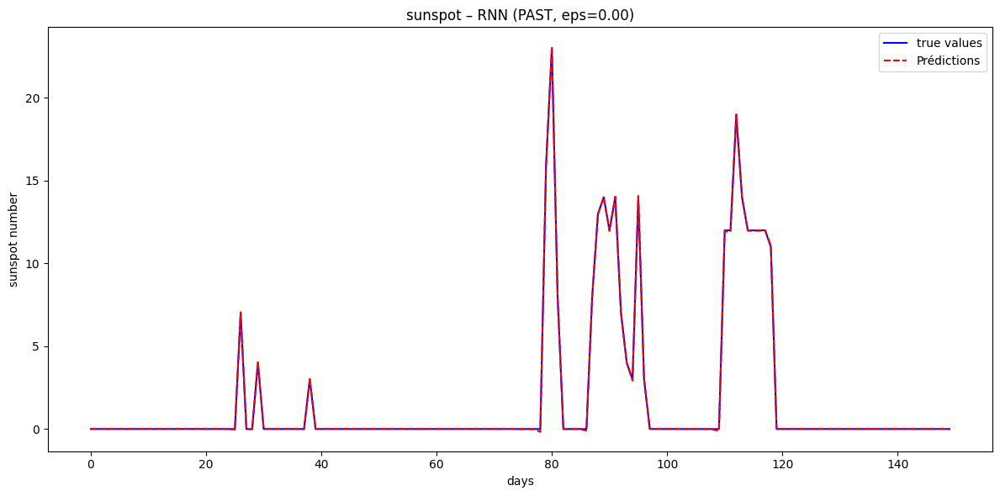

In [ ]:
results_rev_rnn = evaluate_model_births(model_rnn_rev, test_loader_rev, dates_rev, train_size_rev)

real_values_rev_rnn = results_rev_rnn['real_values']
predicted_values_rev_rnn = results_rev_rnn['predicted_values']
test_dates_rev_rnn = results_rev_rnn['test_dates']

true_values_denorm_rev_rnn = real_values_rev_rnn * (serie_max_rev - serie_min_rev) + serie_min_rev
predictions_denorm_rev_rnn = predicted_values_rev_rnn * (serie_max_rev - serie_min_rev) + serie_min_rev

log_and_plot_solar(
    true_values=true_values_denorm_rev_rnn[-days_plot:],
    predictions=predictions_denorm_rev_rnn[-days_plot:],
    model_name='RNN',
    attack_name='PAST',
    epsilon=0.00,
    res_tab=res_tab,
    similarity_fn=scalar_similarity,
    save_path=f"results/solar/SEED_{seed}/plots/PAST/0",
    save_png=True
)

RNN | REV – Epsilon 0.01 – MAE: 4.5709 | SIM: 0.3386 | RMSE: 5.8334


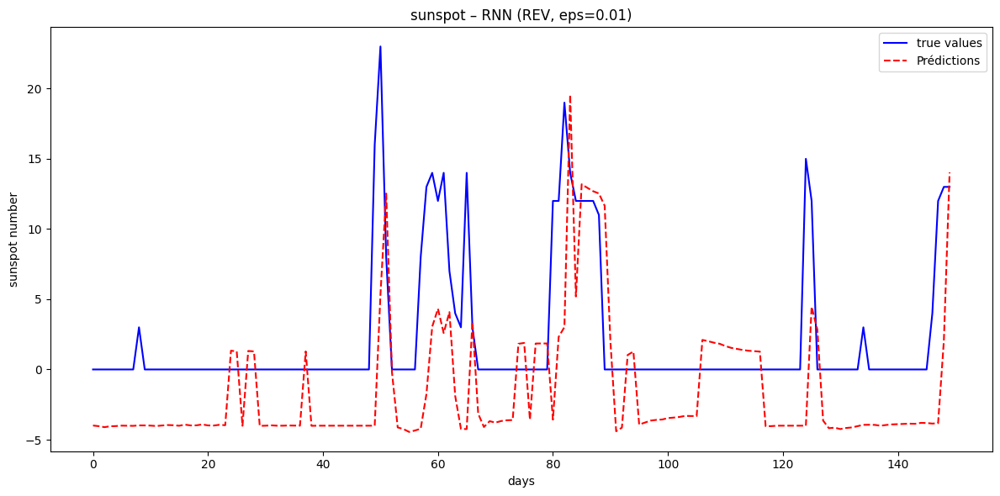

RNN | REV – Epsilon 0.02 – MAE: 6.0394 | SIM: 0.1908 | RMSE: 7.2868


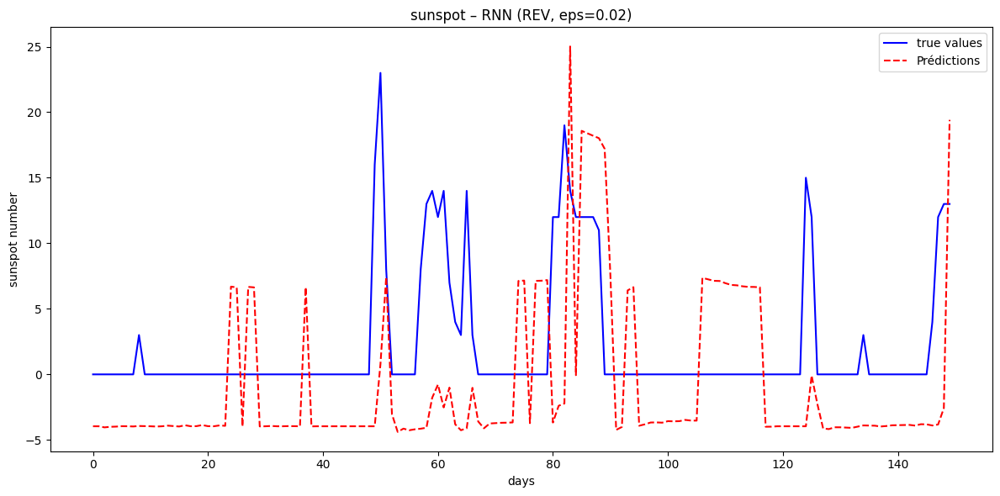

RNN | REV – Epsilon 0.03 – MAE: 7.3675 | SIM: 0.1428 | RMSE: 9.0162


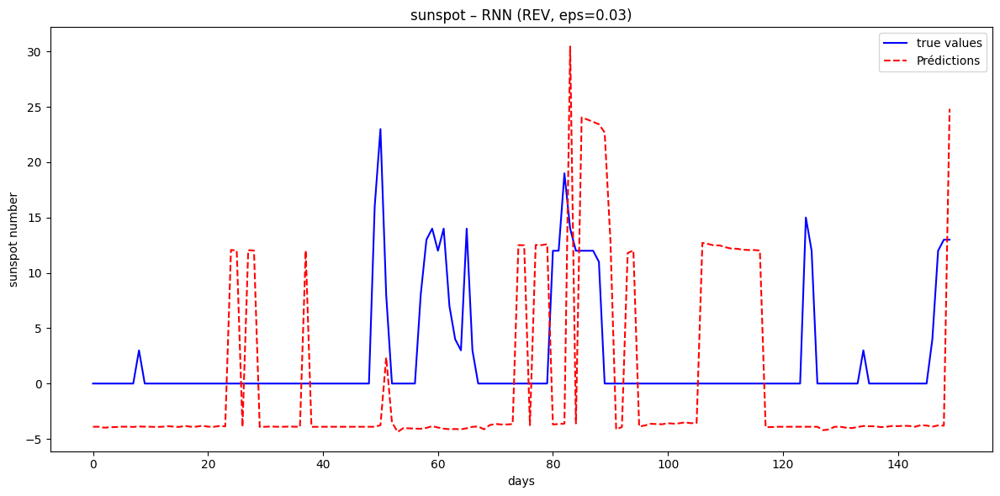

RNN | REV – Epsilon 0.04 – MAE: 8.4785 | SIM: 0.1581 | RMSE: 10.7666


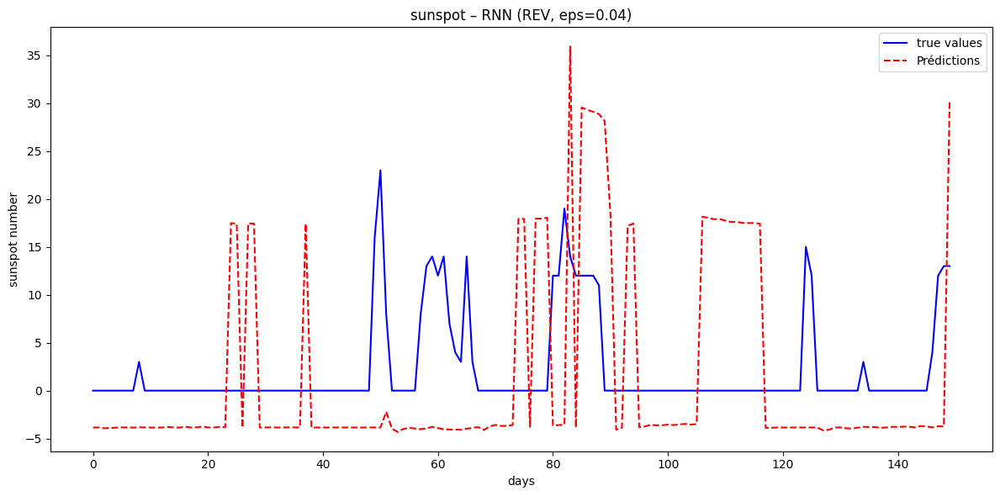

RNN | REV – Epsilon 0.05 – MAE: 9.5612 | SIM: 0.1698 | RMSE: 12.7461


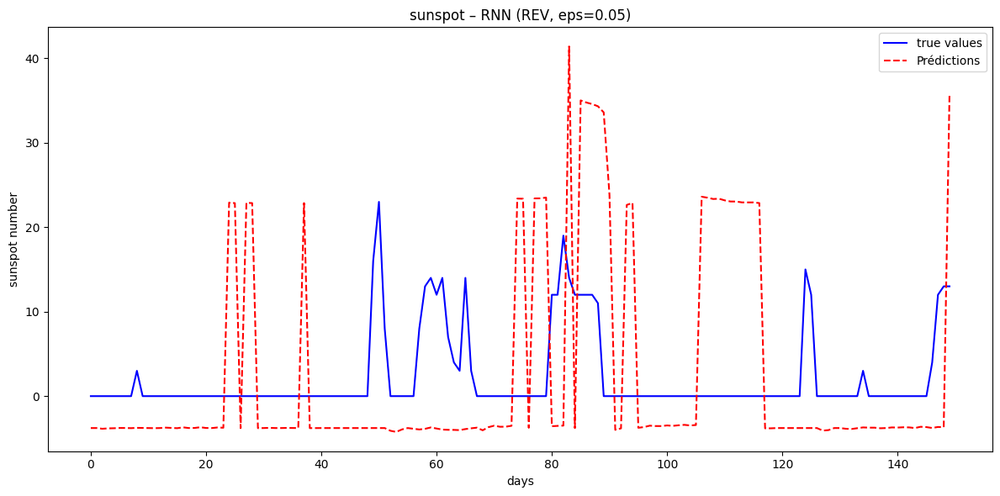

RNN | REV – Epsilon 0.07 – MAE: 12.2319 | SIM: 0.1871 | RMSE: 18.2550


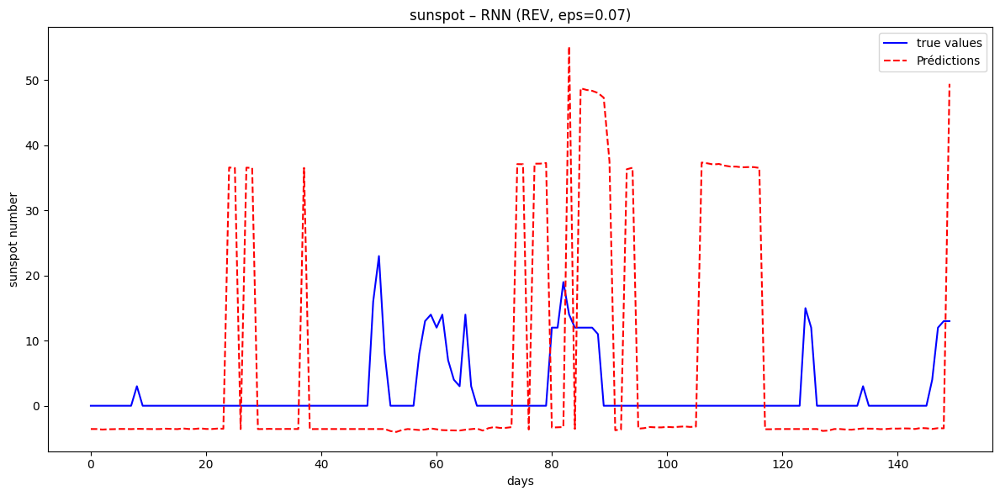

RNN | REV – Epsilon 0.10 – MAE: 14.8952 | SIM: 0.1955 | RMSE: 24.1816


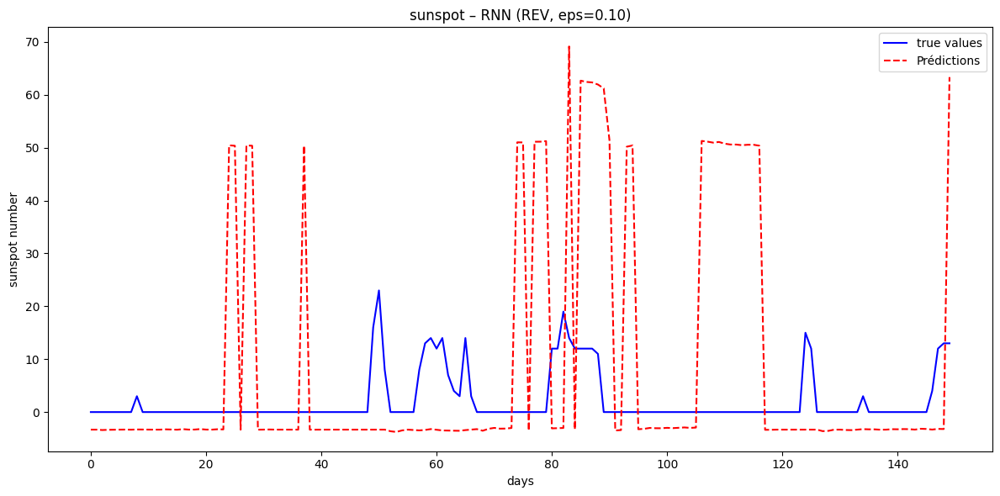

RNN | REV – Epsilon 0.20 – MAE: 25.4393 | SIM: 0.2095 | RMSE: 49.4253


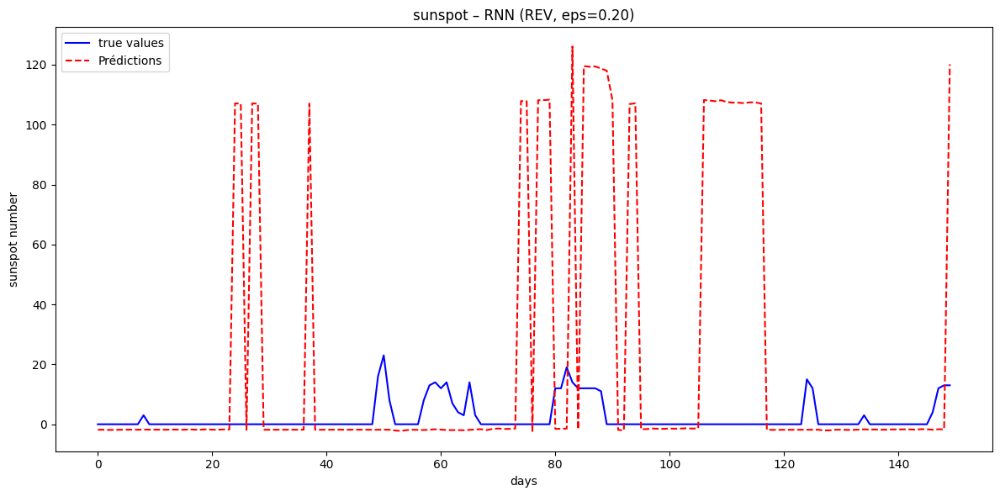

In [ ]:
results = reverse_forecast_attack(
    model_rnn_rev, model_rnn,
    test_loader_rev, test_loader,
    epsilons,
    serie_min_rev, serie_max_rev
)

for esp, (true_vals, preds) in results.items():
  log_and_plot_solar(
      true_values=true_vals[-days_plot:],
      predictions=preds[-days_plot:],
      model_name='RNN',
      attack_name='REV',
      epsilon=esp,
      res_tab=res_tab,
      similarity_fn=scalar_similarity,
      save_path=f"results/solar/SEED_{seed}/plots/REV/{esp}",
      save_png=True
  )

In [ ]:
from models.gru import SimpleGRU
model_gru = SimpleGRU(input_size=1, hidden_size=64, output_size=1, num_layers=2)
model_gru.to(device)
optimizer = torch.optim.Adam(model_gru.parameters(), lr=0.001)
train_models_elec(model_gru, loss_fn, optimizer, num_epochs, train_loader,device)

Epoch [1/10], Train Loss: 0.0028
Epoch [2/10], Train Loss: 0.0020
Epoch [3/10], Train Loss: 0.0020
Epoch [4/10], Train Loss: 0.0020
Epoch [5/10], Train Loss: 0.0019
Epoch [6/10], Train Loss: 0.0019
Epoch [7/10], Train Loss: 0.0019
Epoch [8/10], Train Loss: 0.0019
Epoch [9/10], Train Loss: 0.0019
Epoch [10/10], Train Loss: 0.0019


GRU | NA – Epsilon 0.00 – MAE: 5.9985 | SIM: 0.2613 | RMSE: 6.6445


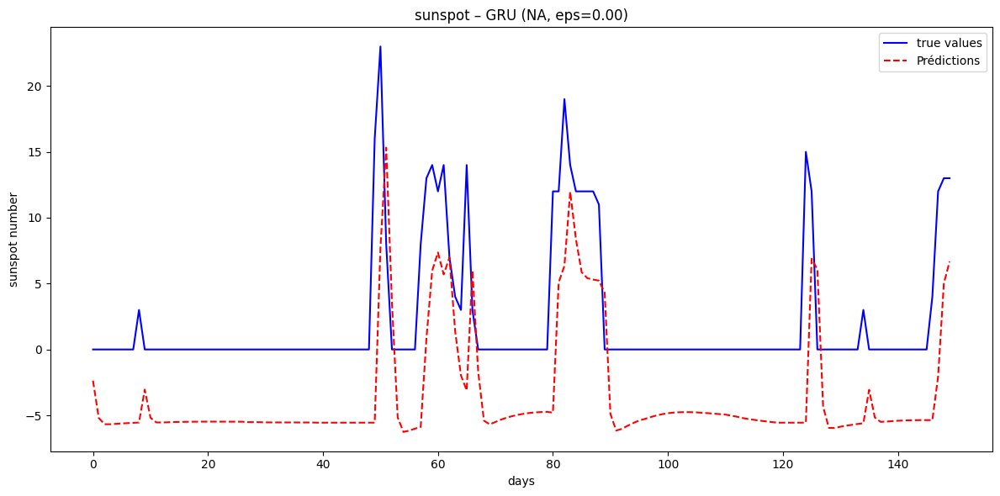

In [ ]:
results_gru = evaluate_model_births(model_gru, test_loader, dates, train_size)

real_values_gru = results_gru['real_values']
predicted_values_gru = results_gru['predicted_values']
test_dates_gru = results_gru['test_dates']

true_values_denorm_gru = real_values_gru * (serie_max - serie_min) + serie_min
predictions_denorm_gru = predicted_values_gru * (serie_max - serie_min) + serie_min

log_and_plot_solar(
    true_values=true_values_denorm_gru[-days_plot:],
    predictions=predictions_denorm_gru[-days_plot:],
    model_name='GRU',
    attack_name='NA',
    epsilon=0.00,
    res_tab=res_tab,
    similarity_fn=scalar_similarity,
    save_path=f"results/solar/SEED_{seed}/plots/PAST/0",
    save_png=True
)

In [ ]:
model_gru_rev = SimpleGRU(input_size=1, hidden_size=64, output_size=1, num_layers=2)
model_gru_rev.to(device)
optimizer = torch.optim.Adam(model_gru_rev.parameters(), lr=0.001)
train_models_elec(model_gru_rev, loss_fn, optimizer, num_epochs, train_loader_rev,device)

Epoch [1/10], Train Loss: 0.0012
Epoch [2/10], Train Loss: 0.0000
Epoch [3/10], Train Loss: 0.0000
Epoch [4/10], Train Loss: 0.0000
Epoch [5/10], Train Loss: 0.0000
Epoch [6/10], Train Loss: 0.0000
Epoch [7/10], Train Loss: 0.0000
Epoch [8/10], Train Loss: 0.0000
Epoch [9/10], Train Loss: 0.0000
Epoch [10/10], Train Loss: 0.0000


GRU | PAST – Epsilon 0.00 – MAE: 0.6476 | SIM: 0.9929 | RMSE: 0.6479


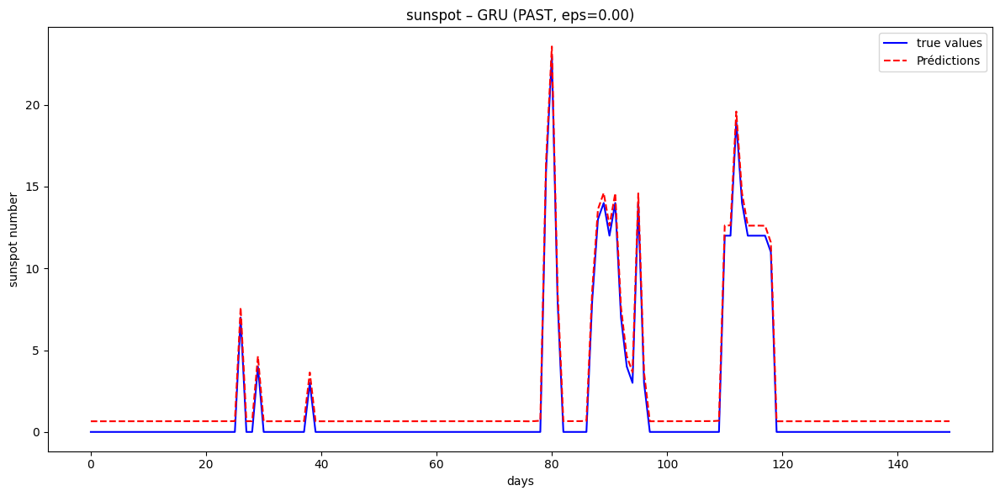

In [ ]:
results_rev_gru = evaluate_model_births(model_gru_rev, test_loader_rev, dates_rev, train_size_rev)

real_values_rev_gru = results_rev_gru['real_values']
predicted_values_rev_gru = results_rev_gru['predicted_values']
test_dates_rev_gru = results_rev_gru['test_dates']

true_values_denorm_rev_gru = real_values_rev_gru * (serie_max_rev - serie_min_rev) + serie_min_rev
predictions_denorm_rev_gru = predicted_values_rev_gru * (serie_max_rev - serie_min_rev) + serie_min_rev

log_and_plot_solar(
    true_values=true_values_denorm_rev_gru[-days_plot:],
    predictions=predictions_denorm_rev_gru[-days_plot:],
    model_name='GRU',
    attack_name='PAST',
    epsilon=0.00,
    res_tab=res_tab,
    similarity_fn=scalar_similarity,
    save_path=f"results/solar/SEED_{seed}/plots/PAST/0",
    save_png=True
)

GRU | REV – Epsilon 0.01 – MAE: 2.4569 | SIM: 0.7776 | RMSE: 3.7140


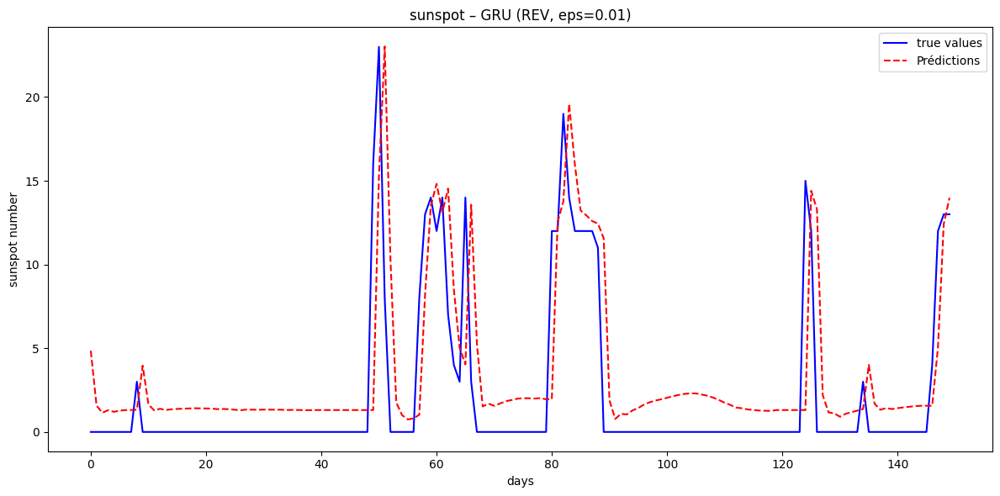

GRU | REV – Epsilon 0.02 – MAE: 7.1228 | SIM: 0.6679 | RMSE: 7.5476


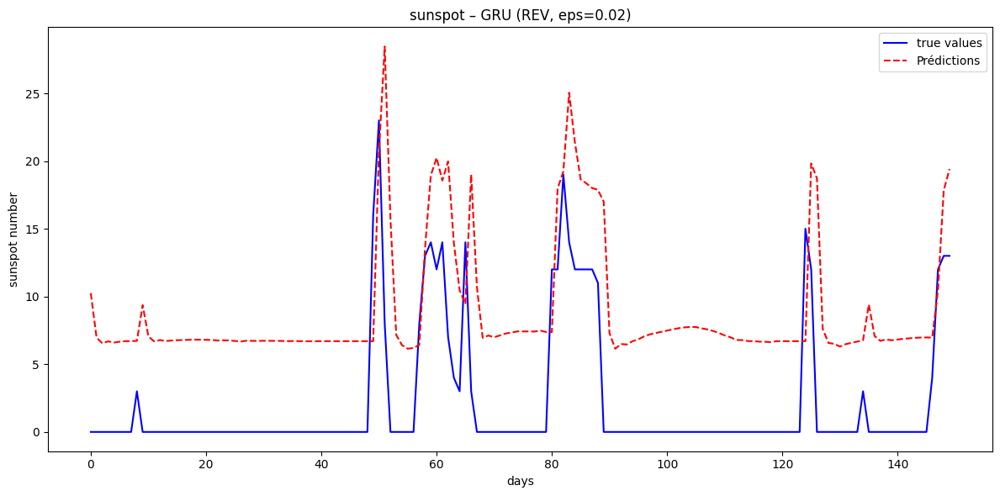

GRU | REV – Epsilon 0.03 – MAE: 12.2368 | SIM: 0.5921 | RMSE: 12.6389


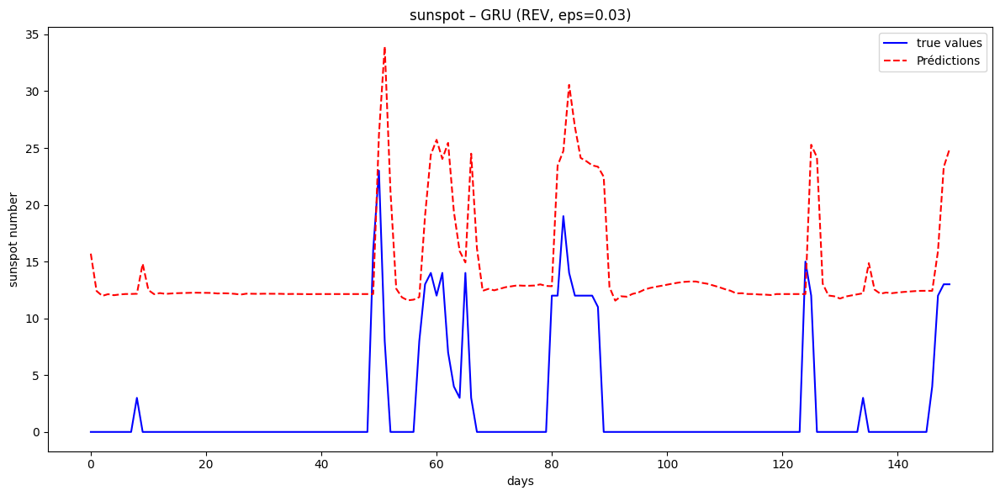

GRU | REV – Epsilon 0.04 – MAE: 17.6471 | SIM: 0.5486 | RMSE: 17.9899


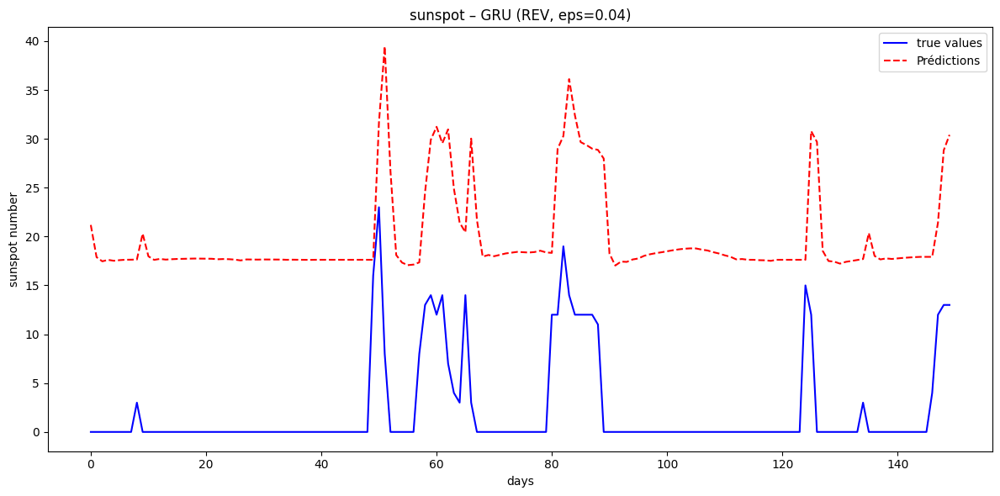

GRU | REV – Epsilon 0.05 – MAE: 23.1925 | SIM: 0.5214 | RMSE: 23.4550


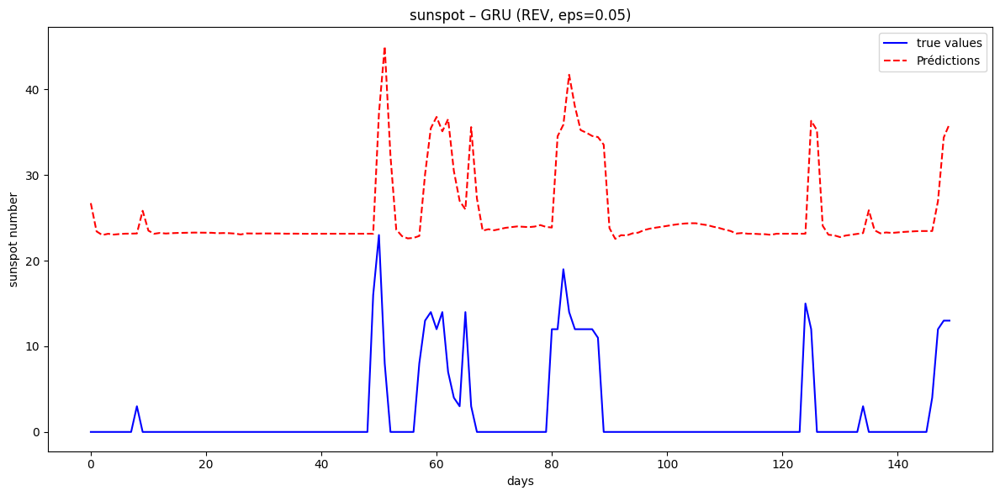

GRU | REV – Epsilon 0.07 – MAE: 37.2536 | SIM: 0.4841 | RMSE: 37.4185


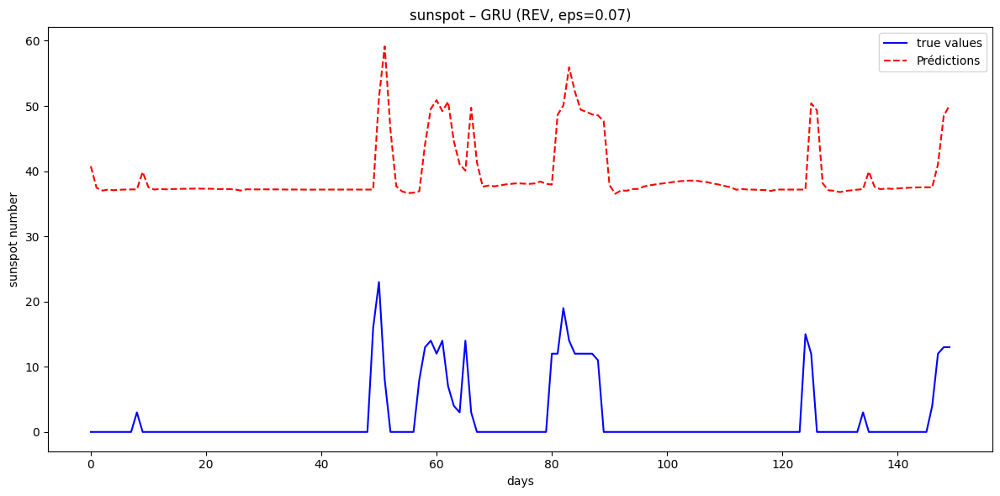

GRU | REV – Epsilon 0.10 – MAE: 51.5923 | SIM: 0.4652 | RMSE: 51.7123


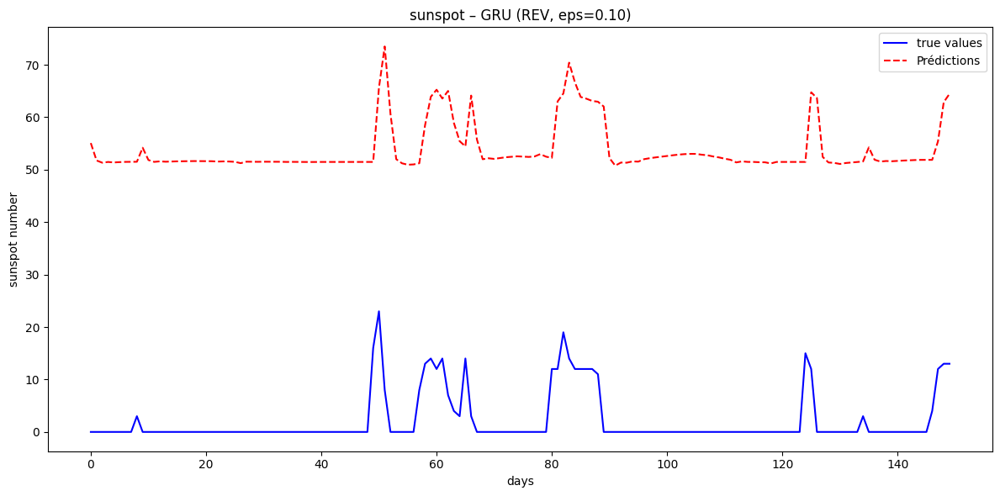

GRU | REV – Epsilon 0.20 – MAE: 111.2736 | SIM: 0.4367 | RMSE: 111.3305


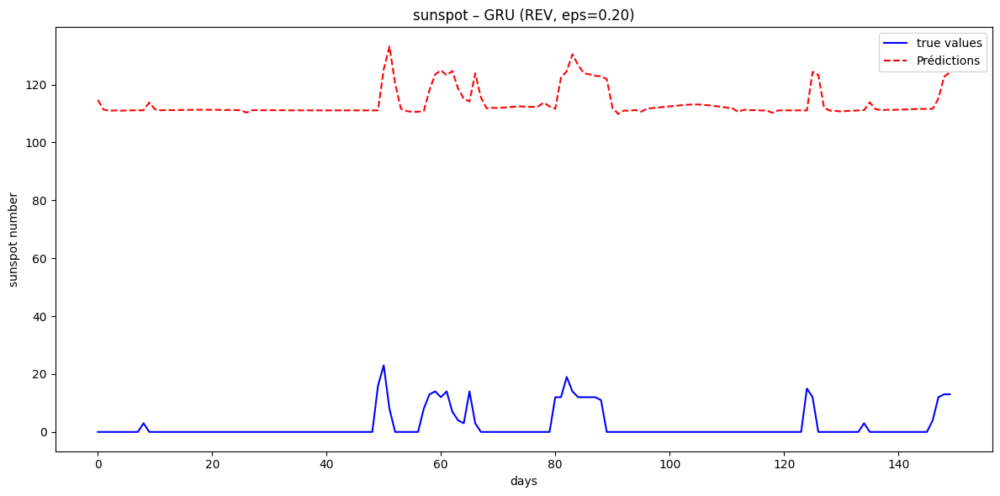

In [ ]:
results = reverse_forecast_attack(
    model_gru_rev, model_rnn,
    test_loader_rev, test_loader,
    epsilons,
    serie_min_rev, serie_max_rev
)

for esp, (true_vals, preds) in results.items():
  log_and_plot_solar(
      true_values=true_vals[-days_plot:],
      predictions=preds[-days_plot:],
      model_name='GRU',
      attack_name='REV',
      epsilon=esp,
      res_tab=res_tab,
      similarity_fn=scalar_similarity,
      save_path=f"results/solar/SEED_{seed}/plots/REV/{esp}",
      save_png=True
  )

In [ ]:
display(res_tab)

Attack              NA      PAST       REV                                  \
ε                 0.00      0.00      0.01      0.02       0.03       0.04   
Model Metric                                                                 
LSTM  MAE     3.615005  0.763786  5.560682  6.774807  10.076182  11.039740   
      RMSE    4.303700  0.774650  6.401887  8.057109  12.157676  13.842708   
      SIM     0.747615  0.988682  0.569753  0.428765   0.494338   0.398318   
RNN   MAE     4.557478  0.020054  4.570867  6.039419   7.367487   8.478526   
      RMSE    5.359532  0.032018  5.833380  7.286775   9.016231  10.766578   
      SIM     0.458301  0.999978  0.338617  0.190838   0.142830   0.158117   
GRU   MAE     5.998473  0.647635  2.456927  7.122786  12.236771  17.647084   
      RMSE    6.644481  0.647856  3.713959  7.547613  12.638946  17.989903   
      SIM     0.261308  0.992886  0.777565  0.667910   0.592081   0.548637   

Attack                                                     
ε                  0.05       0.07       0.10        0.20  
Model Metric                                               
LSTM  MAE     15.068969  17.590271  21.174702   45.853580  
      RMSE    18.674997  23.926355  30.123519   63.513677  
      SIM      0.391148   0.383101   0.308120    0.261099  
RNN   MAE      9.561211  12.231944  14.895236   25.439305  
      RMSE    12.746113  18.255038  24.181568   49.425286  
      SIM      0.169842   0.187062   0.195473    0.209498  
GRU   MAE     23.192464  37.253569  51.592346  111.273579  
      RMSE    23.454976  37.418536  51.712313  111.330496  
      SIM      0.521373   0.484109   0.465228    0.436694

In [ ]:
from attack.fgsm import fgsm_attack

In [ ]:
# Creation of the tab result for plotting adversial attack result
models = ['LSTM','RNN','GRU']
metrics = ['MAE', "RMSE", 'SIM']

row_index = pd.MultiIndex.from_product([models, metrics], names=['Model', 'Metric'])

attacks = ['FGSM']
epsilons_attack = {
    'FGSM':[0.01, 0.02, 0.03, 0.04, 0.05, 0.075, 0.1, 0.2],
}

col_tuples = []
for atk, eps_list in epsilons_attack.items():
    for eps in eps_list:
        col_tuples.append((atk, f"{eps:.2f}"))

col_index = pd.MultiIndex.from_tuples(col_tuples, names=['Attack', 'ε'])

res_tab_fgsm = pd.DataFrame(index=row_index, columns=col_index, dtype=float)

print(res_tab_fgsm)

Attack       FGSM                                   
ε            0.01 0.02 0.03 0.04 0.05 0.07 0.10 0.20
Model Metric                                        
LSTM  MAE     NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN
      RMSE    NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN
      SIM     NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN
RNN   MAE     NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN
      RMSE    NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN
      SIM     NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN
GRU   MAE     NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN
      RMSE    NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN
      SIM     NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN


GRU | FGSM – Epsilon 0.01 – MAE: 7.3753 | SIM: -0.0241 | RMSE: 8.1484


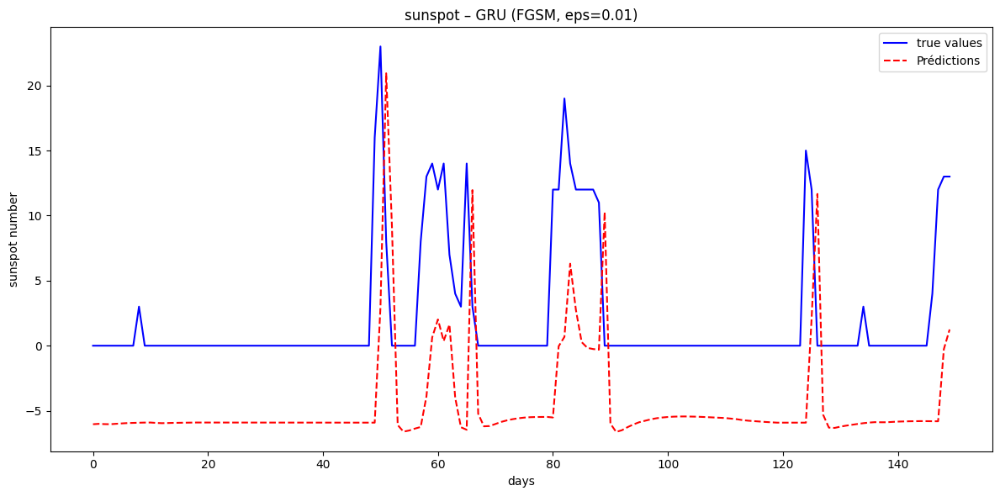

LSTM | FGSM – Epsilon 0.01 – MAE: 7.5569 | SIM: 0.5125 | RMSE: 8.2248


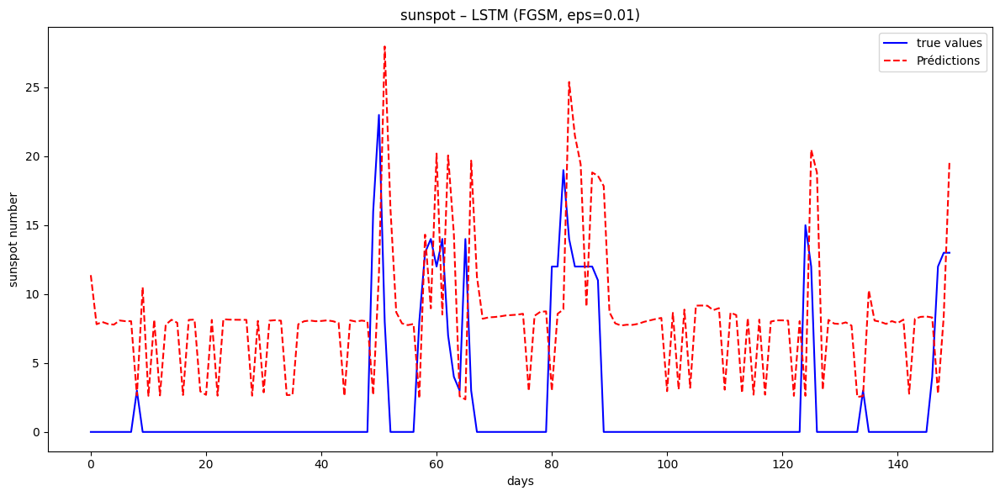

RNN | FGSM – Epsilon 0.01 – MAE: 5.9614 | SIM: 0.1661 | RMSE: 6.9553


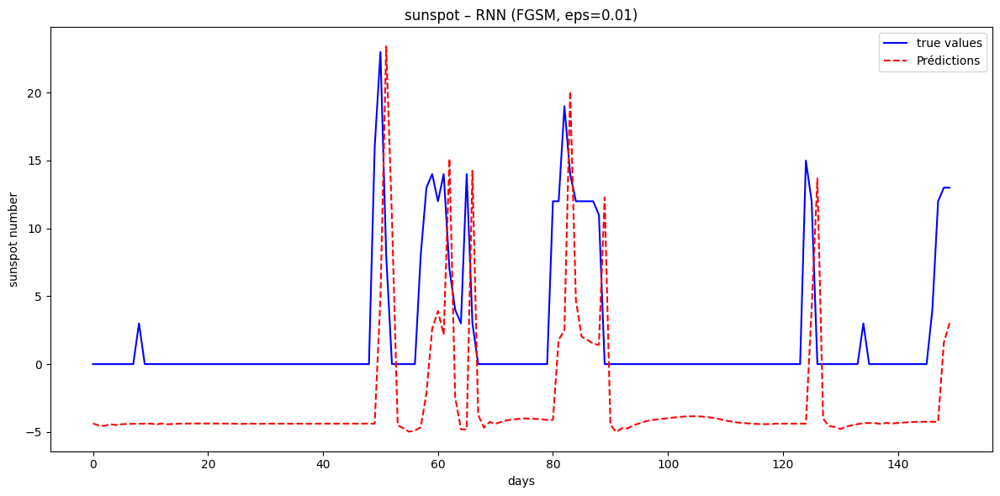

GRU | FGSM – Epsilon 0.02 – MAE: 8.5327 | SIM: -0.2210 | RMSE: 9.6839


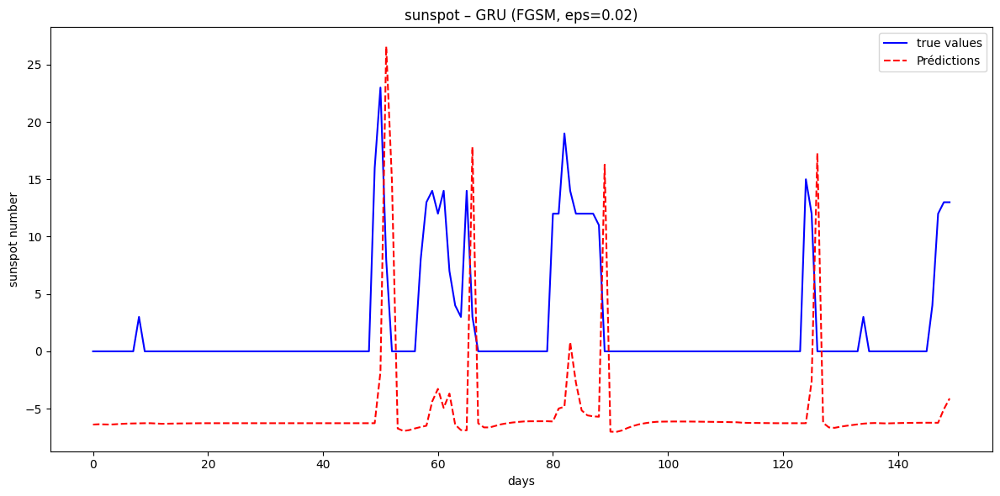

LSTM | FGSM – Epsilon 0.02 – MAE: 11.9582 | SIM: 0.4005 | RMSE: 12.7901


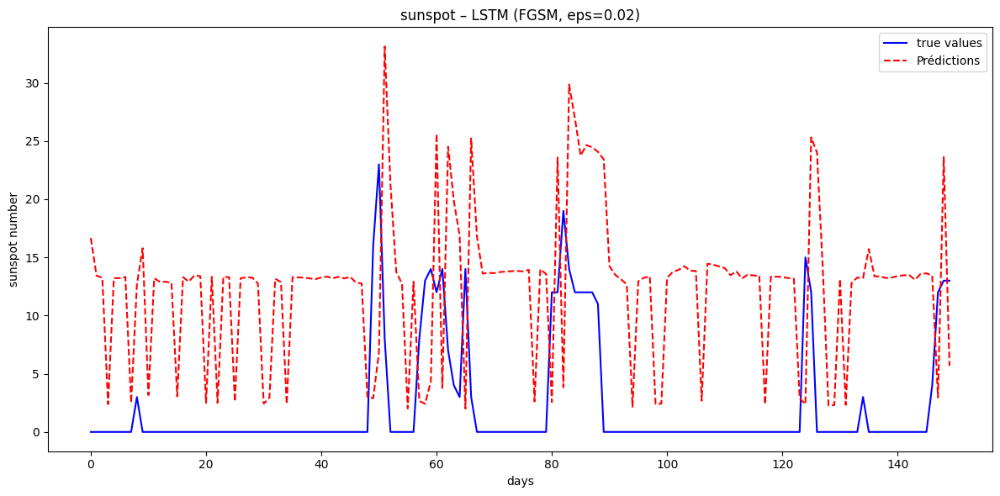

RNN | FGSM – Epsilon 0.02 – MAE: 7.1410 | SIM: -0.0377 | RMSE: 8.6346


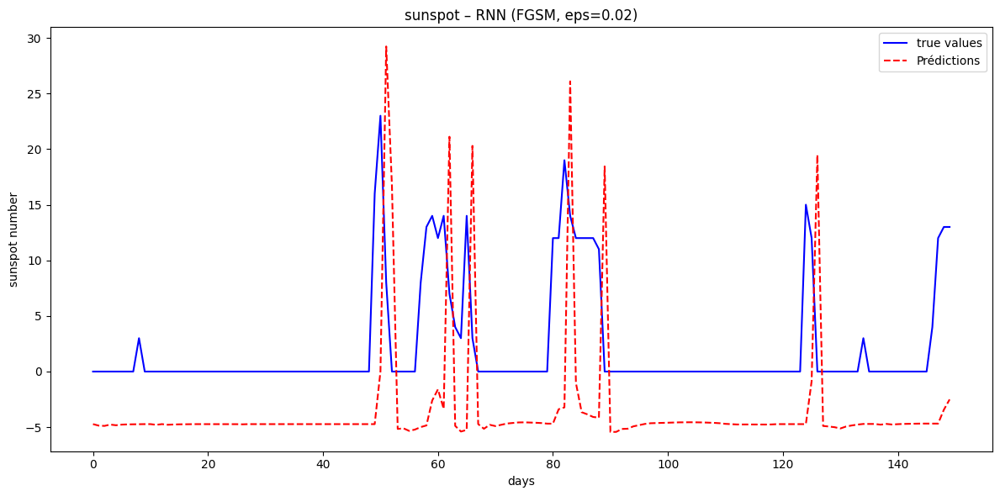

GRU | FGSM – Epsilon 0.03 – MAE: 9.3418 | SIM: -0.2806 | RMSE: 10.7977


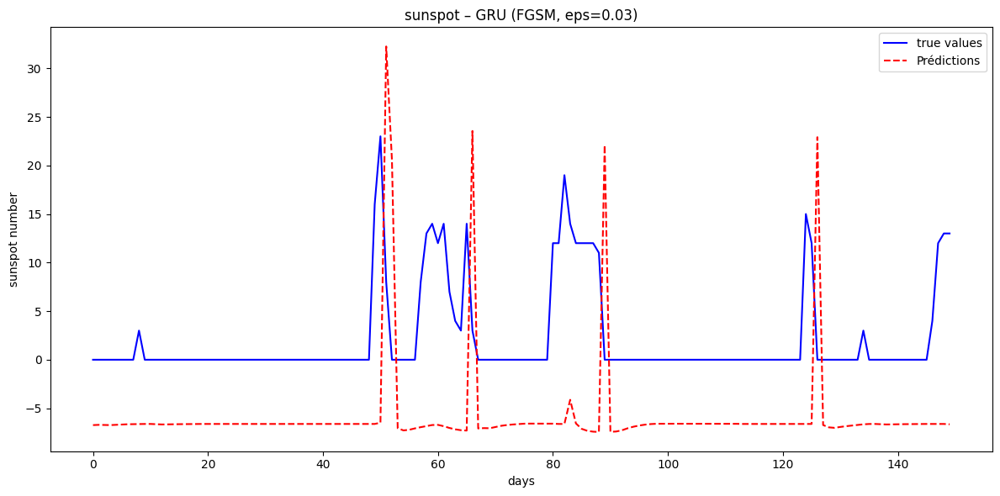

LSTM | FGSM – Epsilon 0.03 – MAE: 15.8493 | SIM: 0.3444 | RMSE: 17.1968


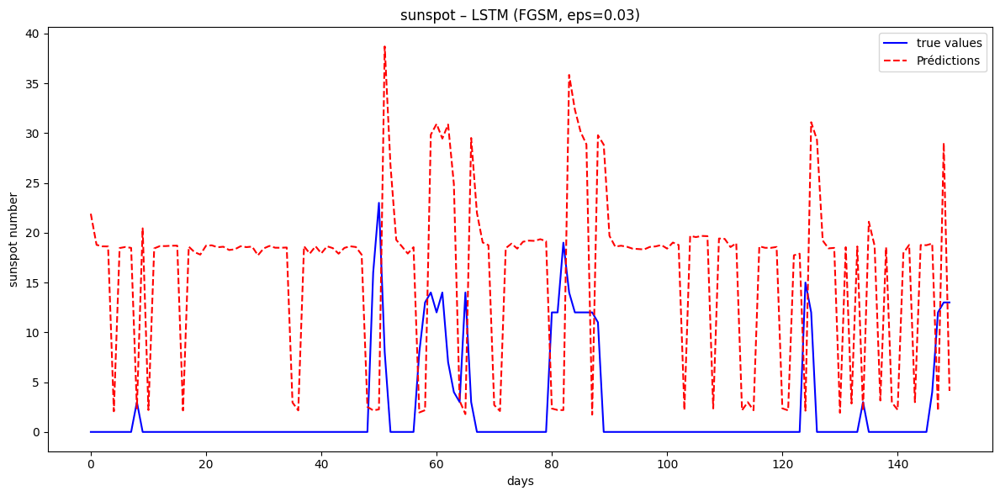

RNN | FGSM – Epsilon 0.03 – MAE: 7.9794 | SIM: -0.0892 | RMSE: 9.8994


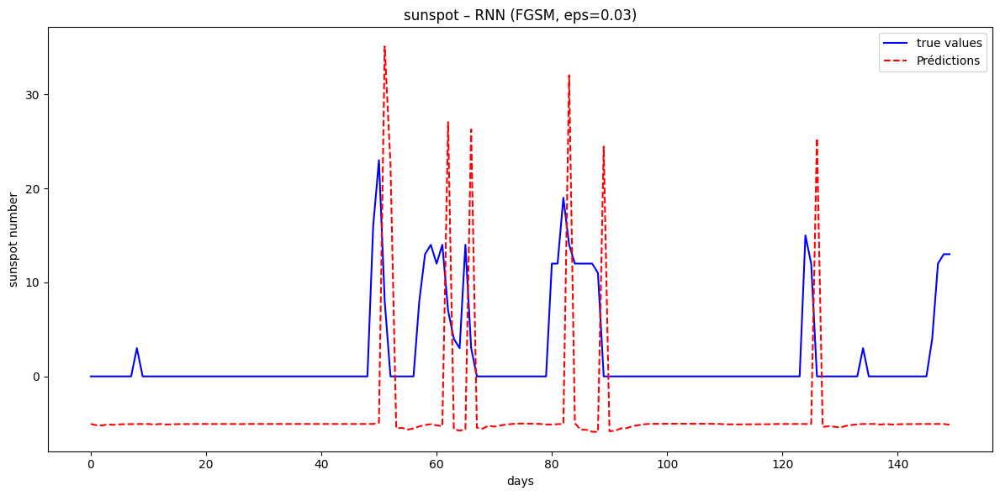

GRU | FGSM – Epsilon 0.04 – MAE: 9.8818 | SIM: -0.2646 | RMSE: 11.5240


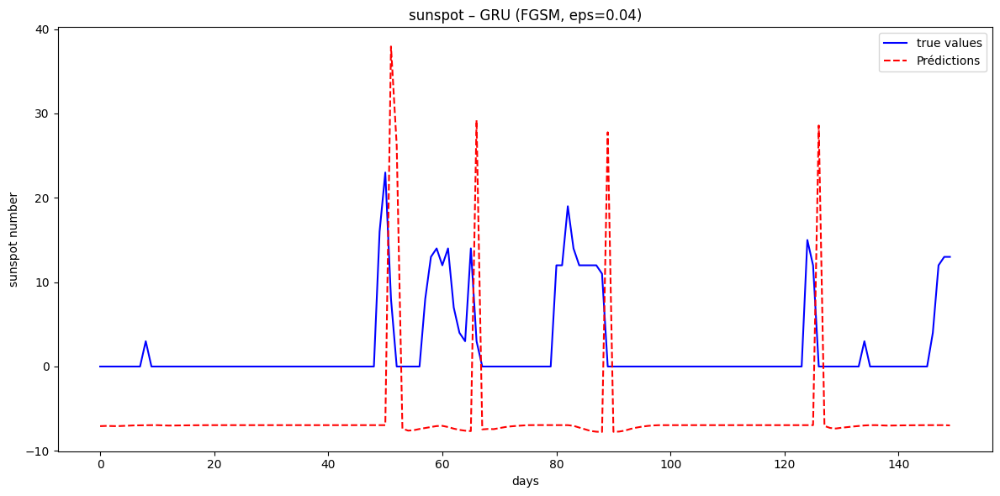

LSTM | FGSM – Epsilon 0.04 – MAE: 21.2356 | SIM: 0.2907 | RMSE: 22.5025


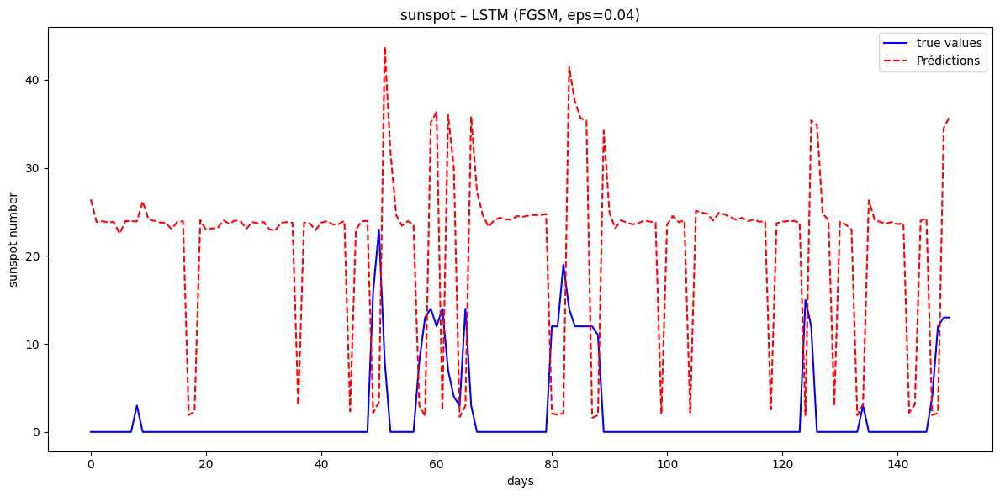

RNN | FGSM – Epsilon 0.04 – MAE: 8.5753 | SIM: -0.0657 | RMSE: 10.8229


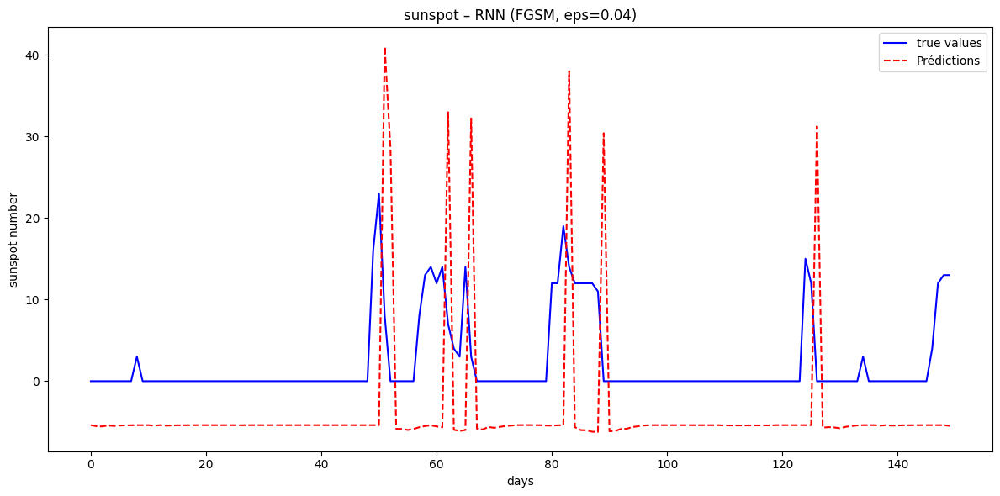

GRU | FGSM – Epsilon 0.05 – MAE: 10.3893 | SIM: -0.2451 | RMSE: 12.2633


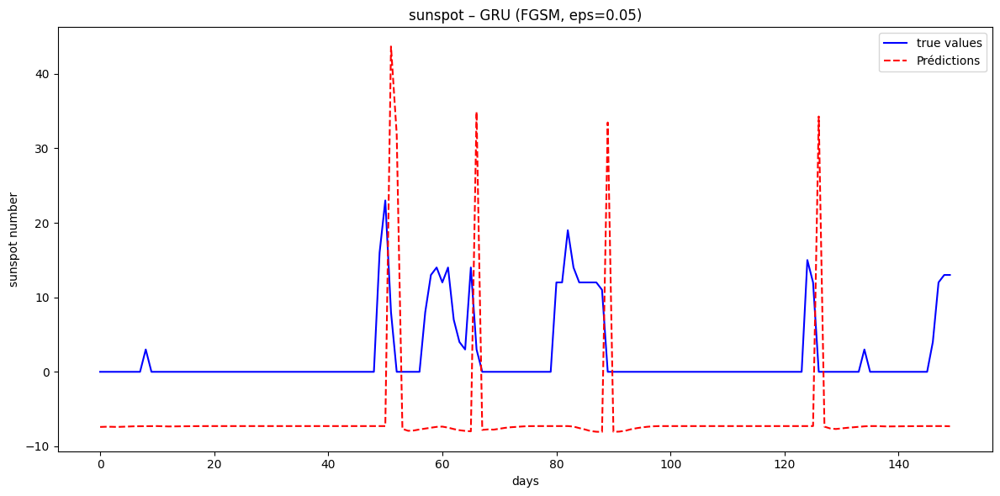

LSTM | FGSM – Epsilon 0.05 – MAE: 24.6685 | SIM: 0.2787 | RMSE: 26.6925


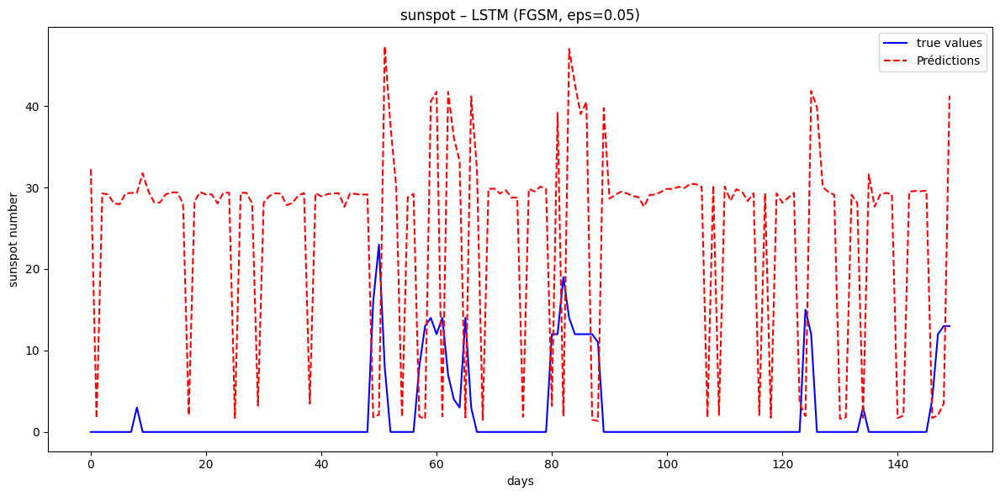

RNN | FGSM – Epsilon 0.05 – MAE: 9.1598 | SIM: -0.0462 | RMSE: 11.8161


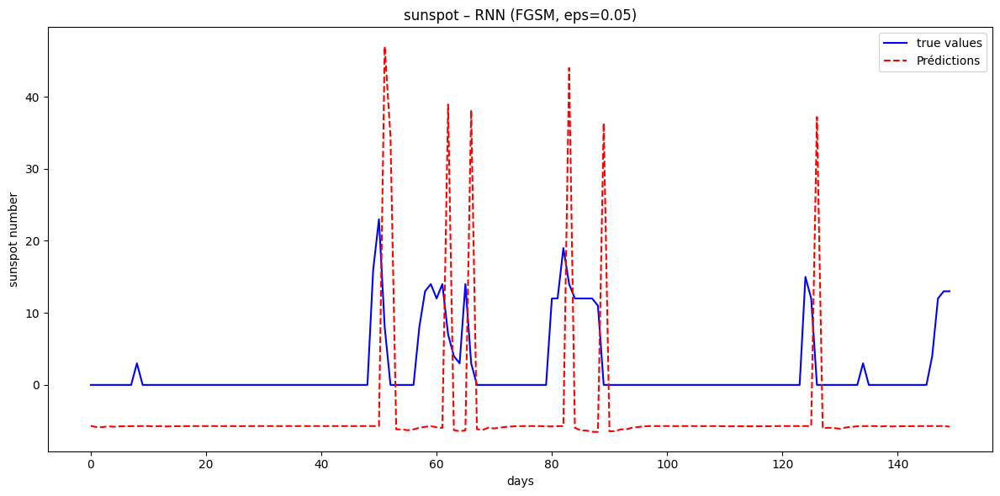

GRU | FGSM – Epsilon 0.07 – MAE: 11.6220 | SIM: -0.2058 | RMSE: 14.2907


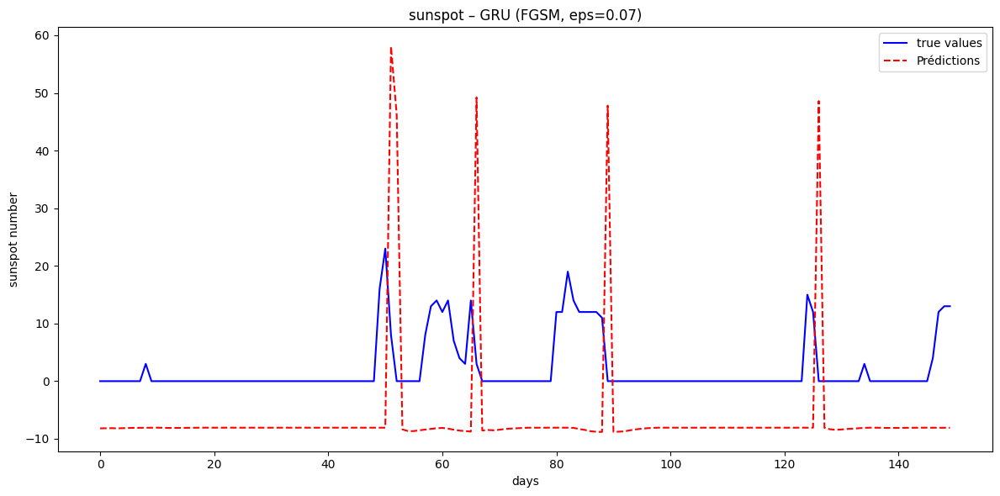

LSTM | FGSM – Epsilon 0.07 – MAE: 35.3758 | SIM: 0.2723 | RMSE: 38.5509


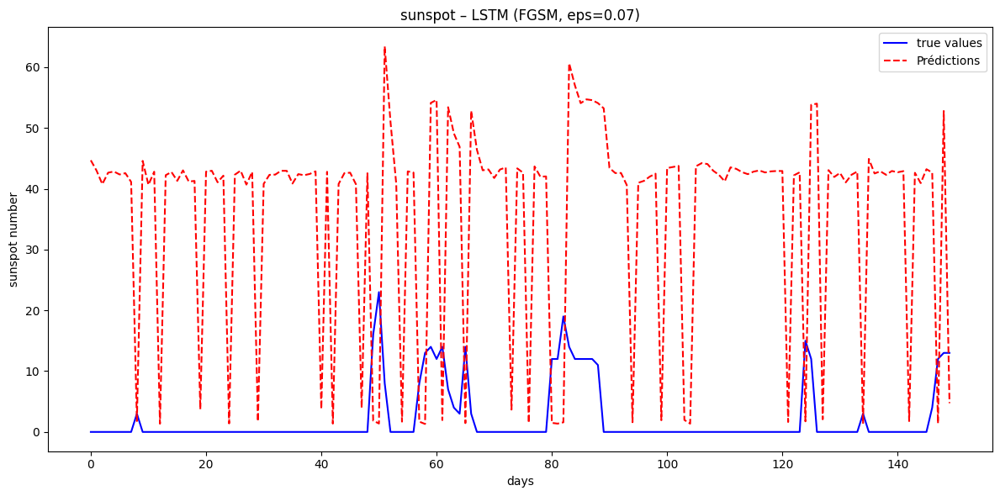

RNN | FGSM – Epsilon 0.07 – MAE: 10.6026 | SIM: -0.0117 | RMSE: 14.5504


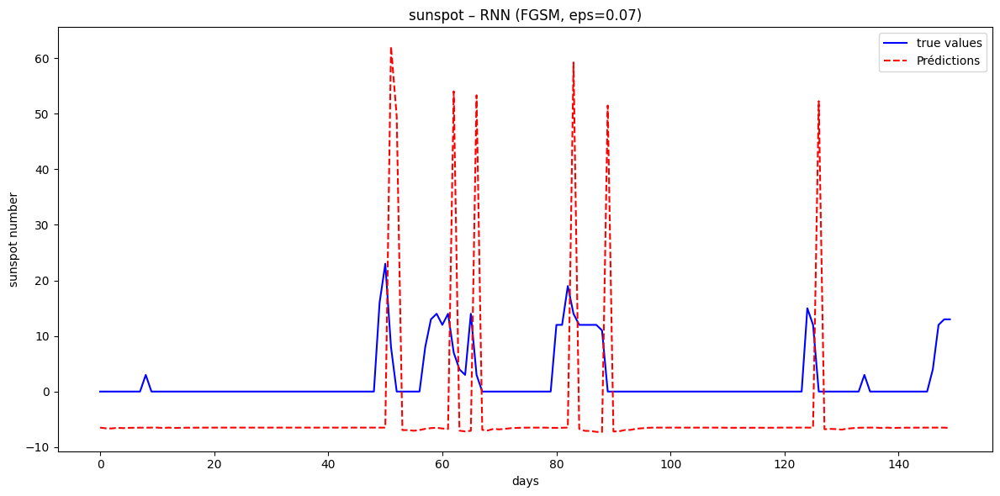

GRU | FGSM – Epsilon 0.10 – MAE: 12.8030 | SIM: -0.1764 | RMSE: 16.5003


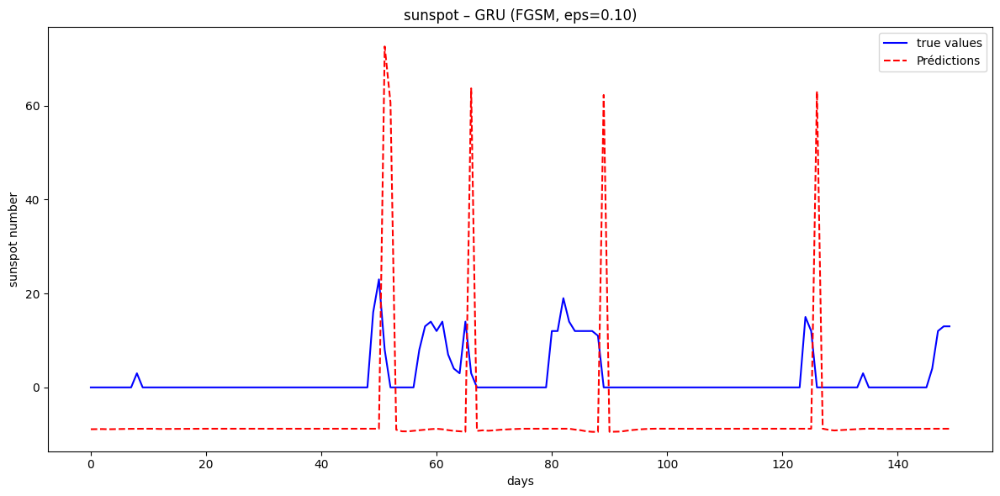

LSTM | FGSM – Epsilon 0.10 – MAE: 45.1955 | SIM: 0.2675 | RMSE: 50.0522


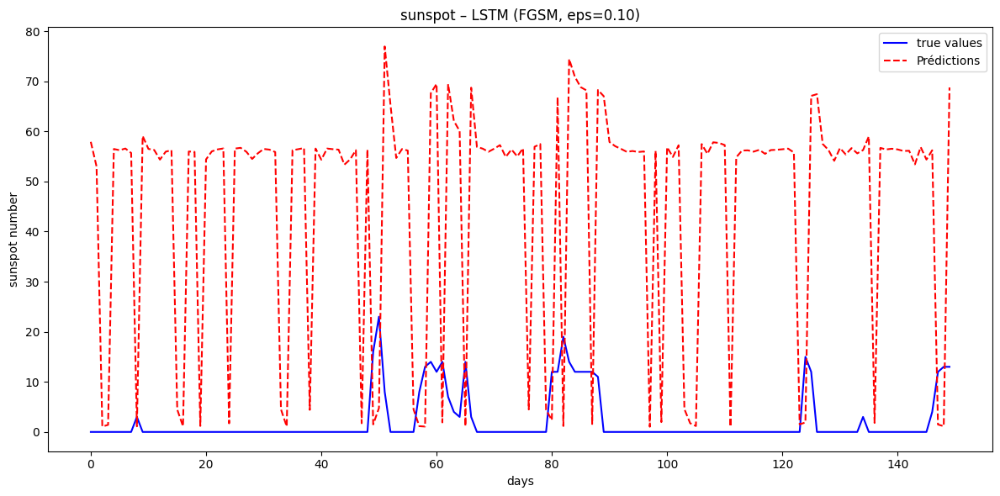

RNN | FGSM – Epsilon 0.10 – MAE: 12.0221 | SIM: 0.0111 | RMSE: 17.5308


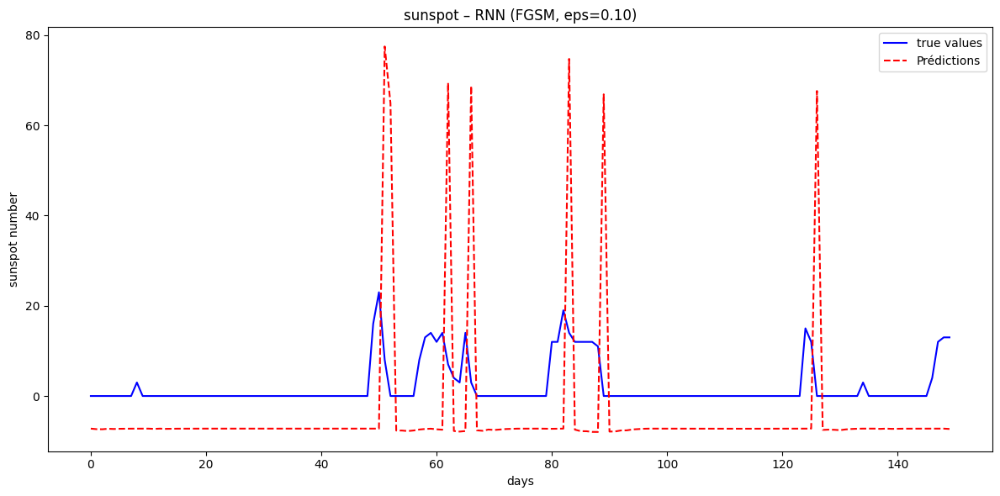

GRU | FGSM – Epsilon 0.20 – MAE: 16.8971 | SIM: -0.1052 | RMSE: 26.1654


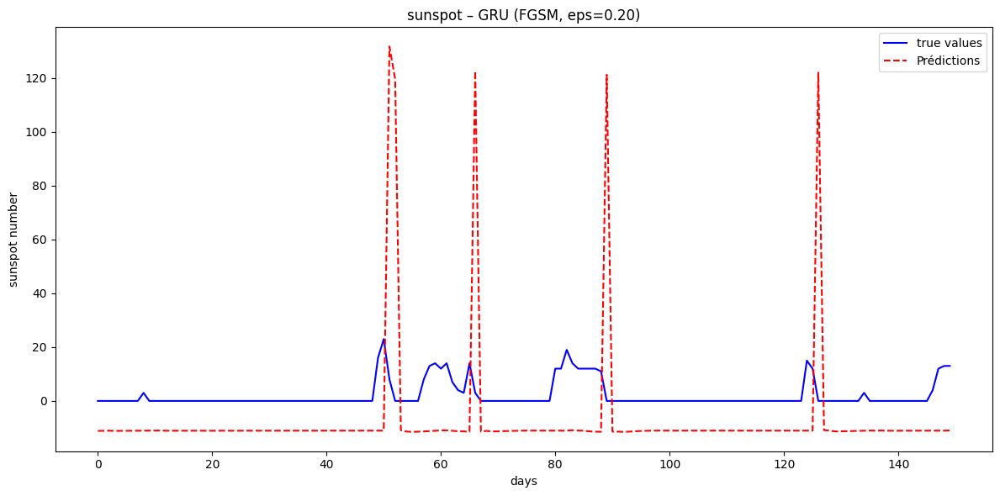

LSTM | FGSM – Epsilon 0.20 – MAE: 87.2974 | SIM: 0.2307 | RMSE: 98.0998


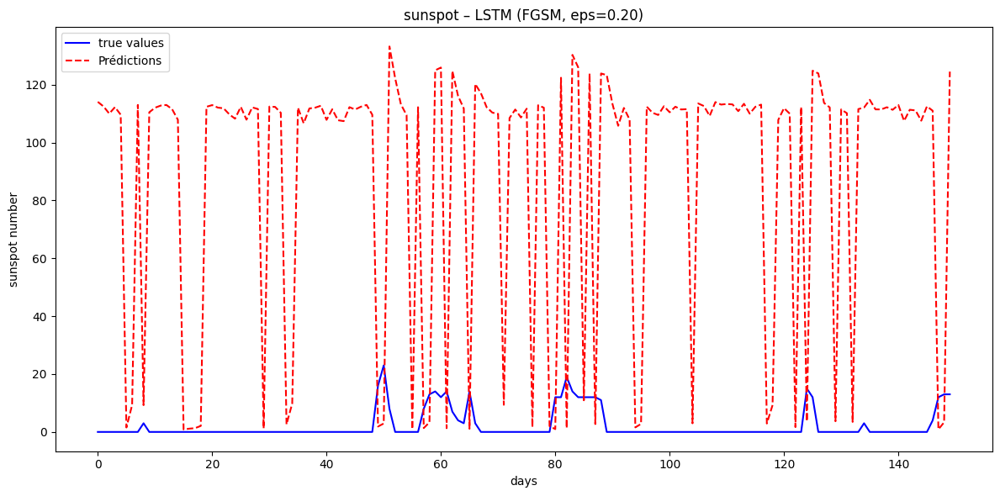

RNN | FGSM – Epsilon 0.20 – MAE: 17.4191 | SIM: 0.0581 | RMSE: 30.5665


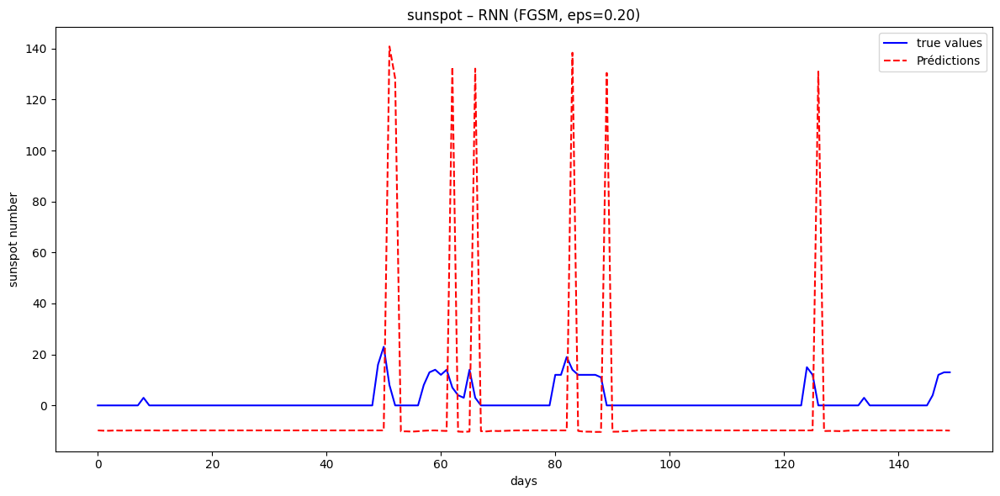

In [ ]:
epsilons_fgsm = [0.01, 0.02, 0.03, 0.04, 0.05, 0.075, 0.1, 0.2]

for eps in epsilons_fgsm:
    true_vals_fgsm, preds_fgsm = fgsm_attack(
        model_gru, test_loader, loss_fn, eps, serie_min_rev, serie_max_rev
    )

    log_and_plot_solar(
        true_values=true_vals_fgsm[-days_plot:],
        predictions=preds_fgsm[-days_plot:],
        model_name='GRU',
        attack_name='FGSM',
        epsilon=eps,
        res_tab=res_tab_fgsm,
        similarity_fn=scalar_similarity,
        save_path=f"results/solar/SEED_{seed}/plots/FGSM/{eps}",
        save_png=True
    )

    true_vals_fgsm, preds_fgsm = fgsm_attack(
        model, test_loader, loss_fn, eps, serie_min_rev, serie_max_rev
    )

    log_and_plot_solar(
        true_values=true_vals_fgsm[-days_plot:],
        predictions=preds_fgsm[-days_plot:],
        model_name='LSTM',
        attack_name='FGSM',
        epsilon=eps,
        res_tab=res_tab_fgsm,
        similarity_fn=scalar_similarity,
        save_path=f"results/solar/SEED_{seed}/plots/FGSM/{eps}",
        save_png=True
    )

    true_vals_fgsm, preds_fgsm = fgsm_attack(
        model_rnn, test_loader, loss_fn, eps, serie_min_rev, serie_max_rev
    )

    log_and_plot_solar(
        true_values=true_vals_fgsm[-days_plot:],
        predictions=preds_fgsm[-days_plot:],
        model_name='RNN',
        attack_name='FGSM',
        epsilon=eps,
        res_tab=res_tab_fgsm,
        similarity_fn=scalar_similarity,
        save_path=f"results/solar/SEED_{seed}/plots/FGSM/{eps}",
        save_png=True
    )


In [ ]:
display(res_tab_fgsm)

Attack            FGSM                                                         \
ε                 0.01       0.02       0.03       0.04       0.05       0.07   
Model Metric                                                                    
LSTM  MAE     7.556883  11.958152  15.849262  21.235585  24.668520  35.375842   
      RMSE    8.224806  12.790084  17.196810  22.502486  26.692546  38.550909   
      SIM     0.512522   0.400523   0.344401   0.290721   0.278731   0.272321   
RNN   MAE     5.961375   7.140992   7.979378   8.575262   9.159824  10.602609   
      RMSE    6.955339   8.634580   9.899351  10.822899  11.816129  14.550413   
      SIM     0.166053  -0.037708  -0.089226  -0.065735  -0.046240  -0.011694   
GRU   MAE     7.375334   8.532711   9.341832   9.881781  10.389318  11.622035   
      RMSE    8.148351   9.683873  10.797743  11.523978  12.263275  14.290747   
      SIM    -0.024149  -0.220971  -0.280562  -0.264632  -0.245102  -0.205792   

Attack                              
ε                  0.10       0.20  
Model Metric                        
LSTM  MAE     45.195499  87.297402  
      RMSE    50.052181  98.099812  
      SIM      0.267498   0.230742  
RNN   MAE     12.022098  17.419095  
      RMSE    17.530845  30.566508  
      SIM      0.011088   0.058112  
GRU   MAE     12.803003  16.897129  
      RMSE    16.500309  26.165358  
      SIM     -0.176448  -0.105193

In [ ]:
from attack.rev_bim import reverse_forecast_attack_bim

In [ ]:
# Creation of the tab result for plotting adversial attack result
models = ['LSTM','RNN','GRU']
metrics = ['MAE', "RMSE", 'SIM']

row_index = pd.MultiIndex.from_product([models, metrics], names=['Model', 'Metric'])

attacks = ['REV_BIM']
epsilons = {
    'REV_BIM':[0.01,0.02,0.03,0.04, 0.05, 0.075, 0.1, 0.2],
}

col_tuples = []
for atk, eps_list in epsilons.items():
    for eps in eps_list:
        col_tuples.append((atk, f"{eps:.2f}"))

col_index = pd.MultiIndex.from_tuples(col_tuples, names=['Attack', 'ε'])

res_tab_bim = pd.DataFrame(index=row_index, columns=col_index, dtype=float)

print(res_tab_bim)

Attack       REV_BIM                                   
ε               0.01 0.02 0.03 0.04 0.05 0.07 0.10 0.20
Model Metric                                           
LSTM  MAE        NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN
      RMSE       NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN
      SIM        NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN
RNN   MAE        NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN
      RMSE       NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN
      SIM        NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN
GRU   MAE        NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN
      RMSE       NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN
      SIM        NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN


GRU | REV_BIM – Epsilon 0.01 – MAE: 1.6072 | SIM: 0.7655 | RMSE: 3.4975


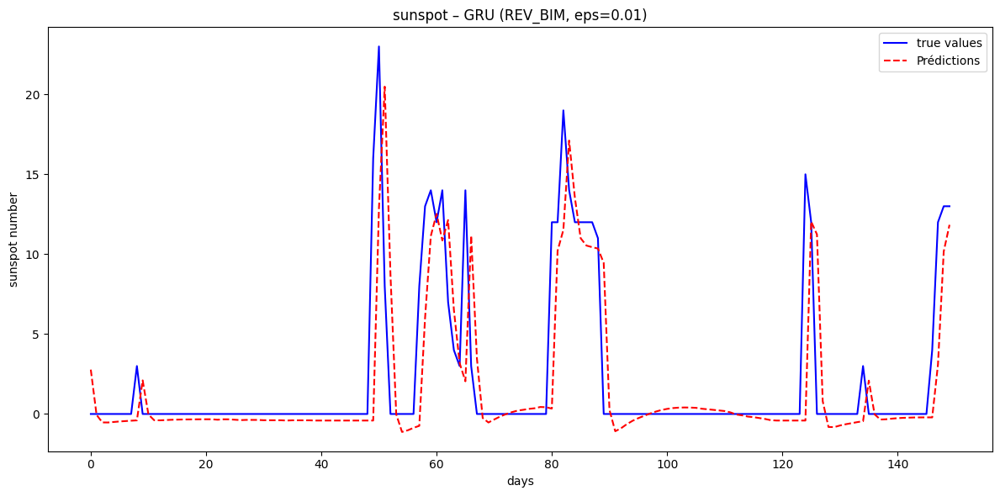

GRU | REV_BIM – Epsilon 0.02 – MAE: 5.3140 | SIM: 0.7014 | RMSE: 5.7802


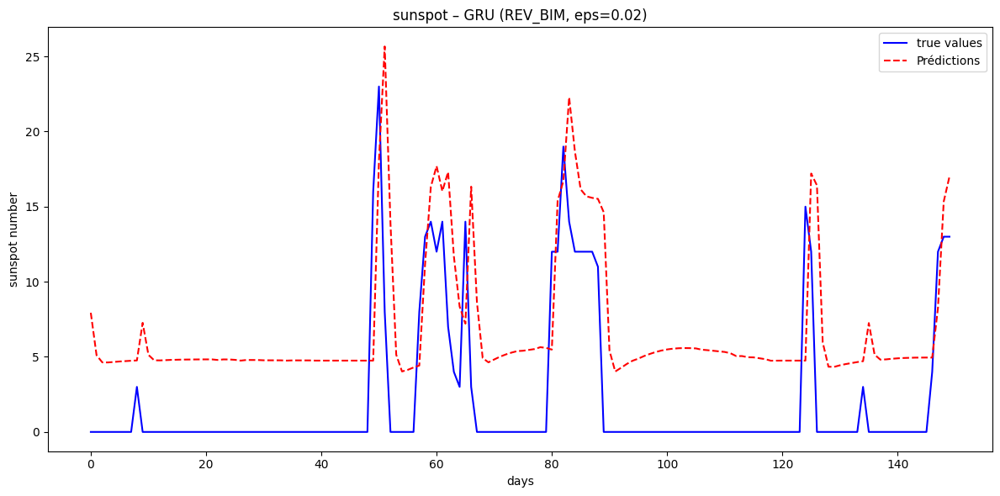

GRU | REV_BIM – Epsilon 0.03 – MAE: 9.9965 | SIM: 0.6110 | RMSE: 10.4009


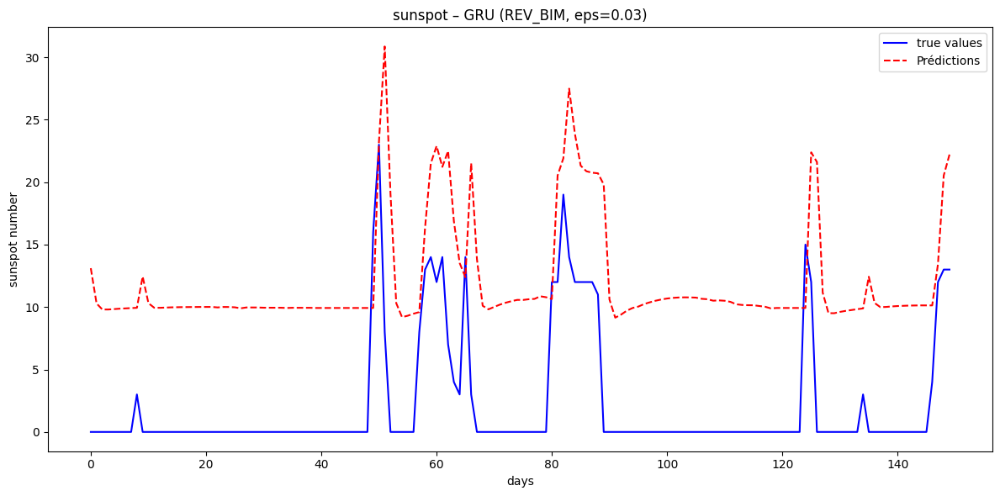

GRU | REV_BIM – Epsilon 0.04 – MAE: 15.0105 | SIM: 0.5598 | RMSE: 15.3932


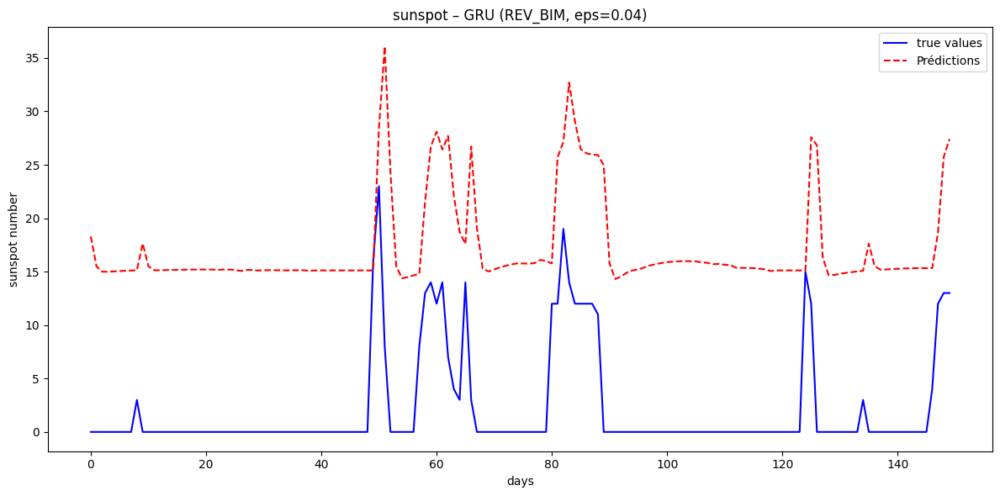

GRU | REV_BIM – Epsilon 0.05 – MAE: 20.1998 | SIM: 0.5288 | RMSE: 20.4948


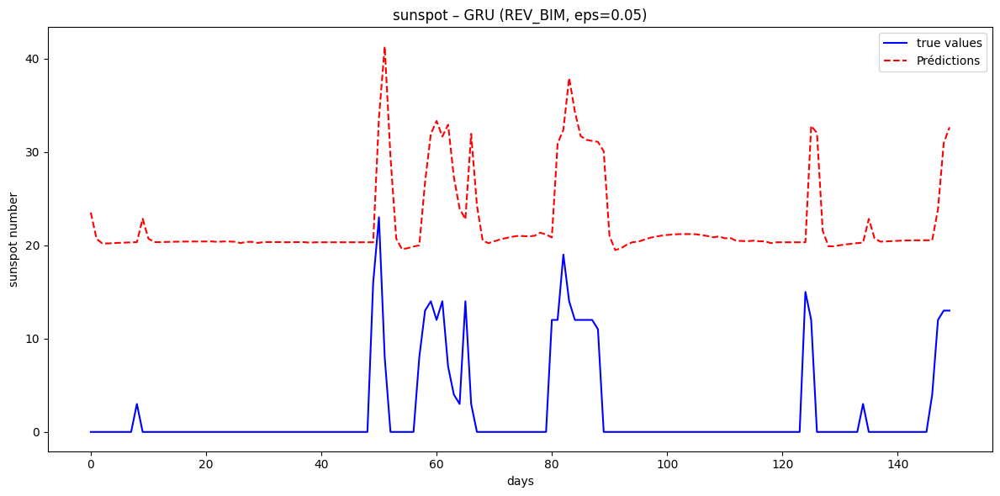

GRU | REV_BIM – Epsilon 0.07 – MAE: 30.5501 | SIM: 0.4936 | RMSE: 30.7467


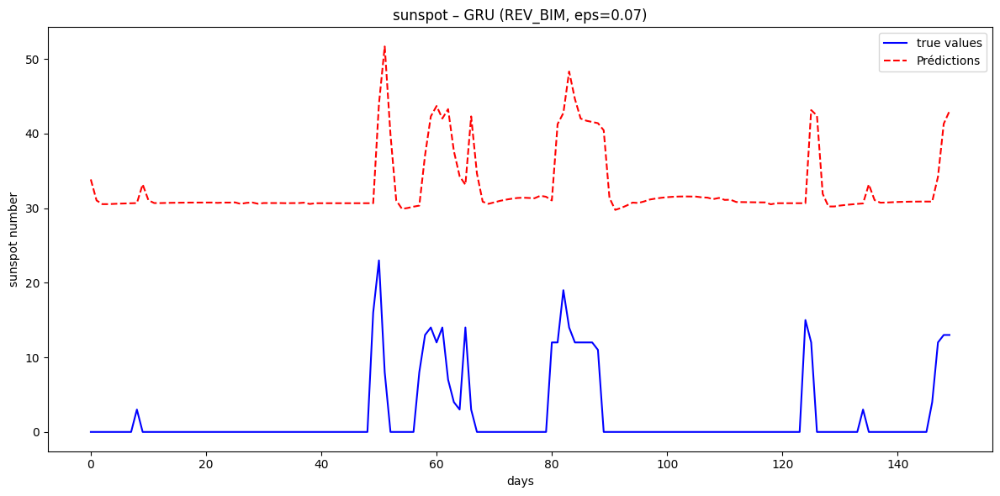

GRU | REV_BIM – Epsilon 0.10 – MAE: 46.1159 | SIM: 0.4677 | RMSE: 46.2472


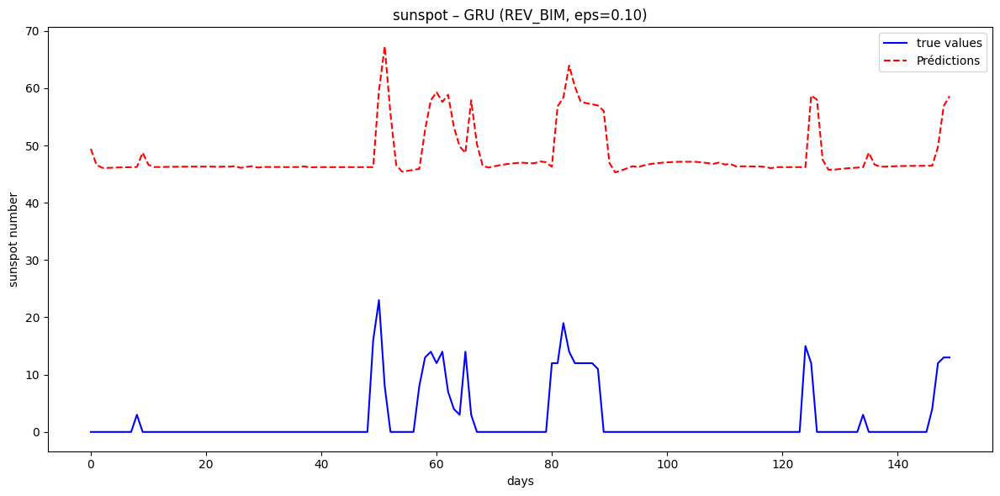

GRU | REV_BIM – Epsilon 0.20 – MAE: 98.0741 | SIM: 0.4384 | RMSE: 98.1419


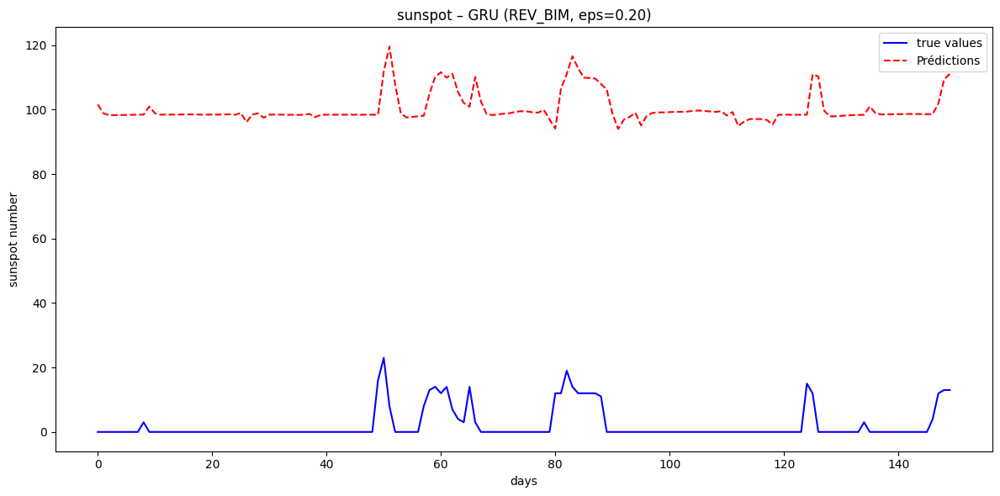

LSTM | REV_BIM – Epsilon 0.01 – MAE: 5.4230 | SIM: 0.6257 | RMSE: 6.2122


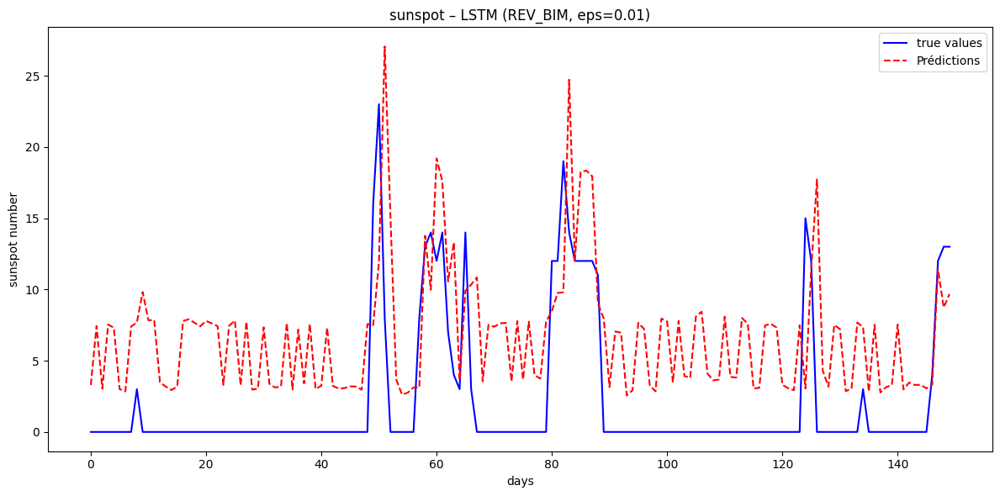

LSTM | REV_BIM – Epsilon 0.02 – MAE: 6.8734 | SIM: 0.6178 | RMSE: 7.9926


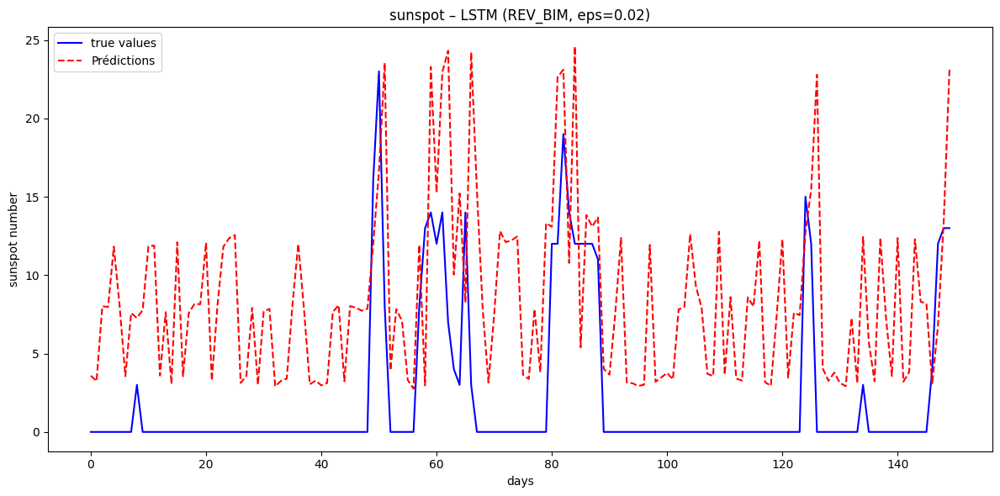

LSTM | REV_BIM – Epsilon 0.03 – MAE: 8.8287 | SIM: 0.4480 | RMSE: 10.0117


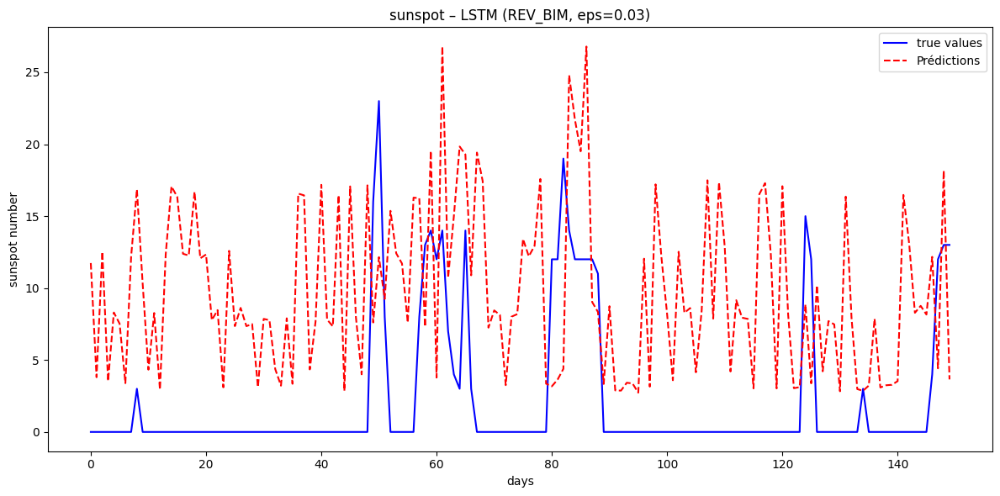

LSTM | REV_BIM – Epsilon 0.04 – MAE: 11.2459 | SIM: 0.4923 | RMSE: 13.0082


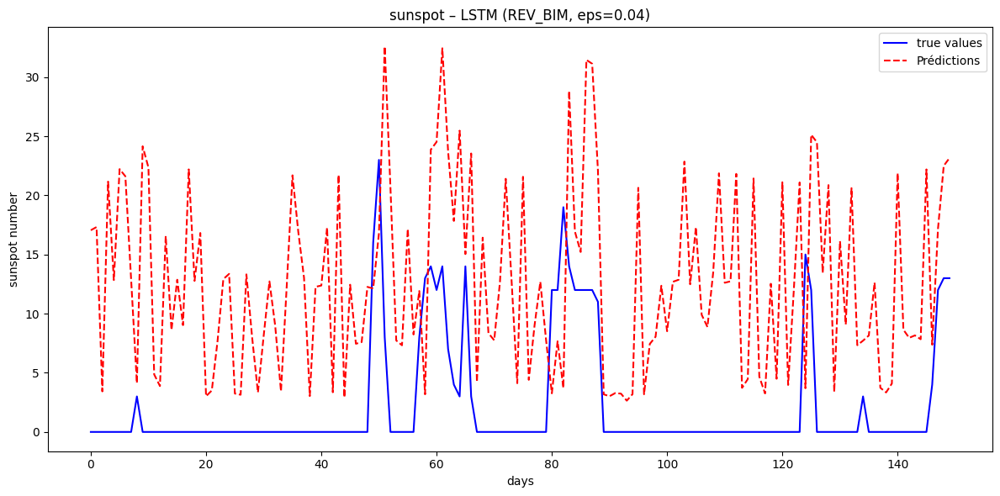

LSTM | REV_BIM – Epsilon 0.05 – MAE: 12.1895 | SIM: 0.4858 | RMSE: 14.2343


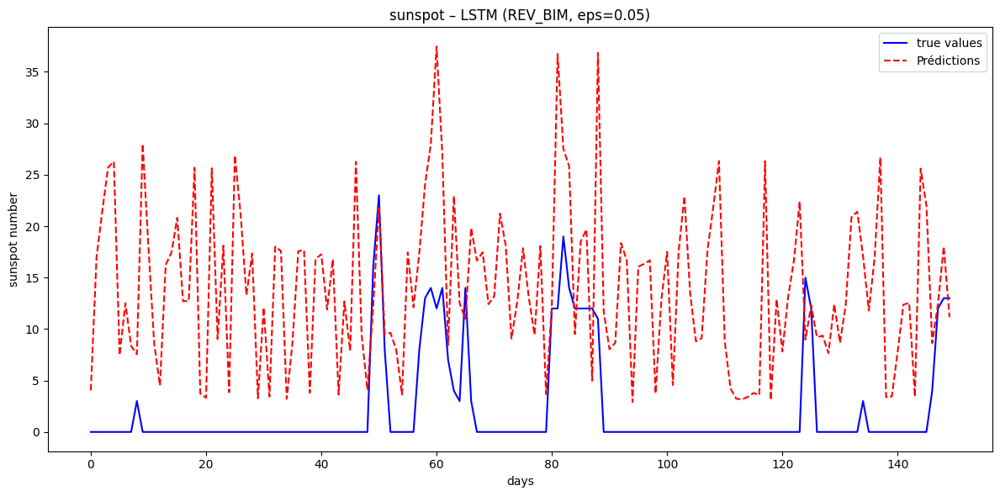

LSTM | REV_BIM – Epsilon 0.07 – MAE: 17.1125 | SIM: 0.3879 | RMSE: 19.7453


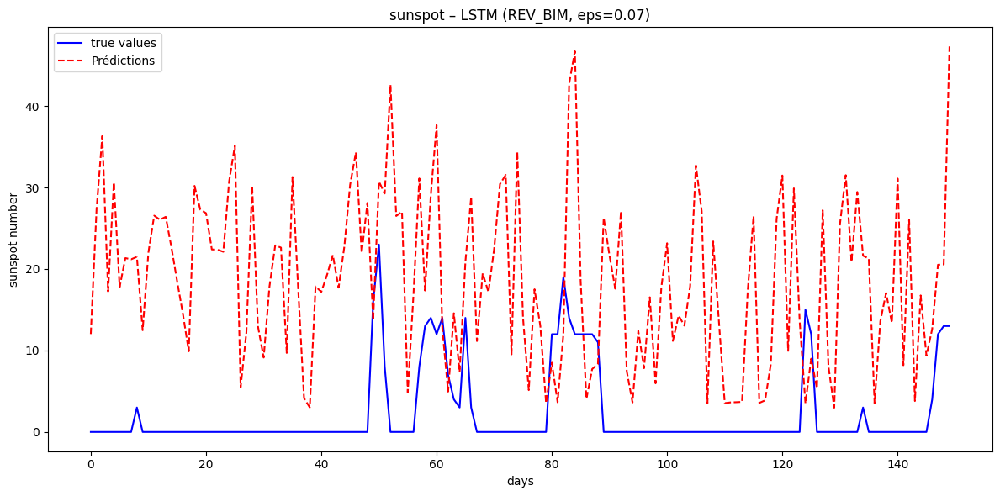

LSTM | REV_BIM – Epsilon 0.10 – MAE: 24.6017 | SIM: 0.4308 | RMSE: 27.5560


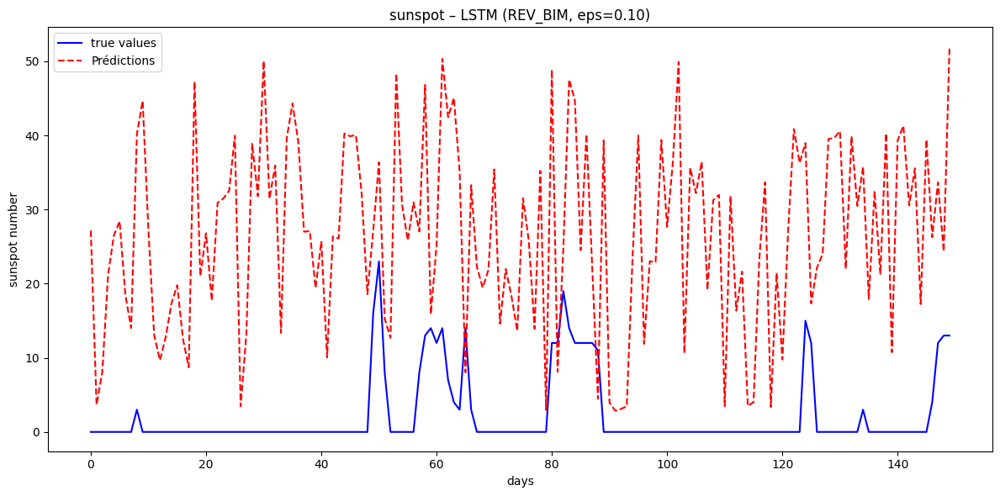

LSTM | REV_BIM – Epsilon 0.20 – MAE: 42.2809 | SIM: 0.4142 | RMSE: 46.8506


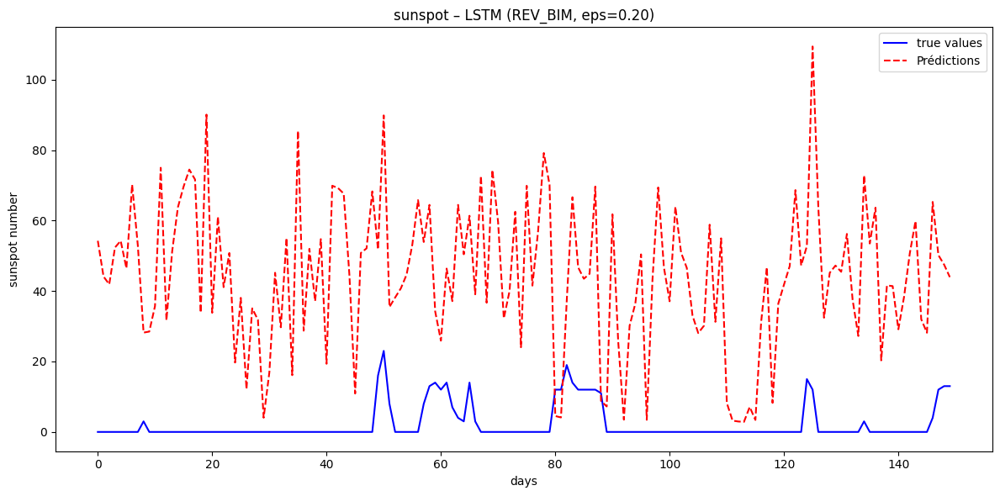

RNN | REV_BIM – Epsilon 0.01 – MAE: 4.5709 | SIM: 0.3386 | RMSE: 5.8334


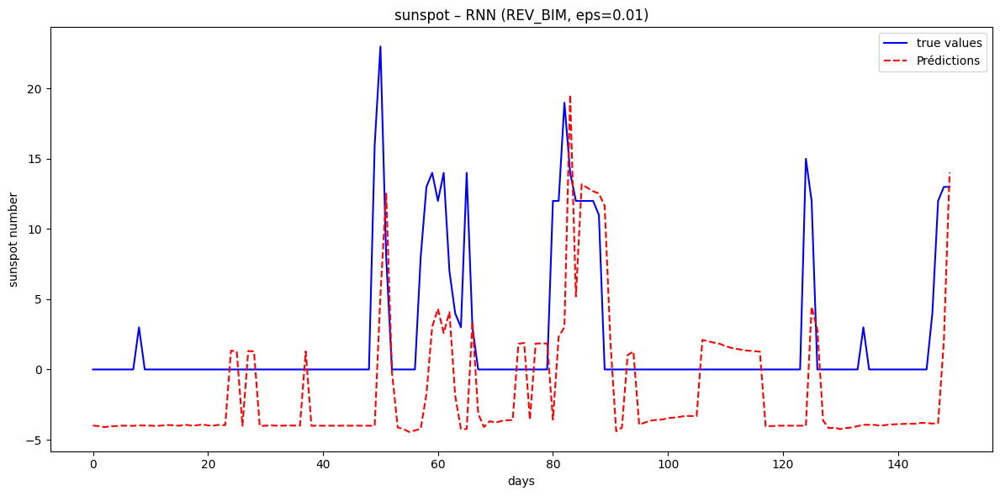

RNN | REV_BIM – Epsilon 0.02 – MAE: 6.0398 | SIM: 0.1909 | RMSE: 7.2871


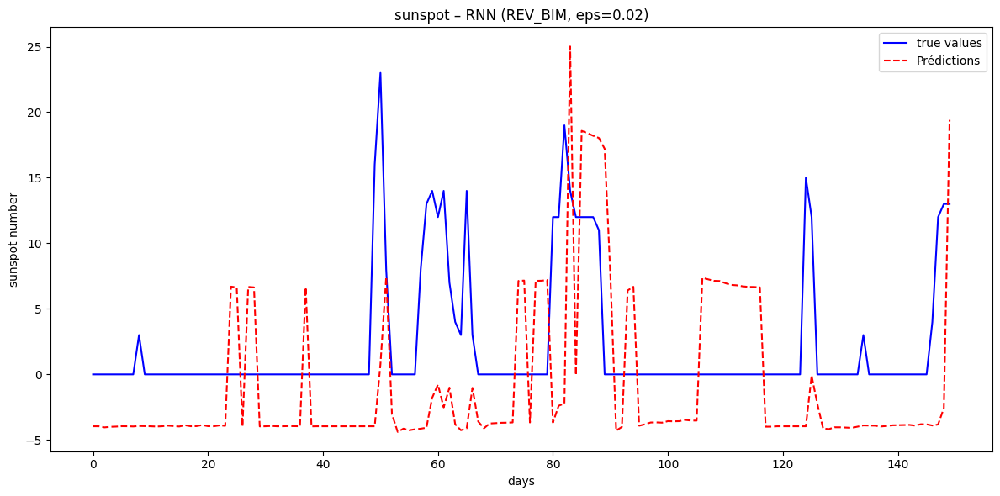

RNN | REV_BIM – Epsilon 0.03 – MAE: 7.3693 | SIM: 0.1428 | RMSE: 9.0186


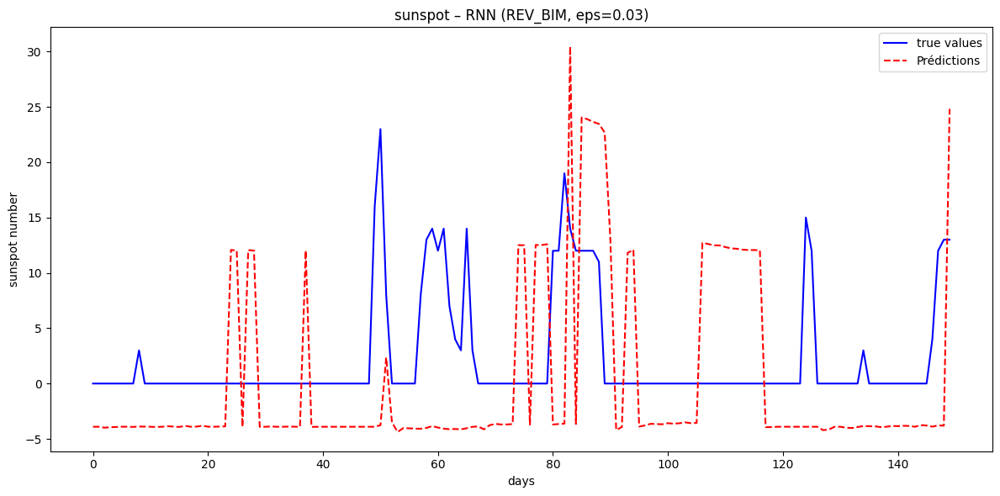

RNN | REV_BIM – Epsilon 0.04 – MAE: 8.4834 | SIM: 0.1580 | RMSE: 10.7722


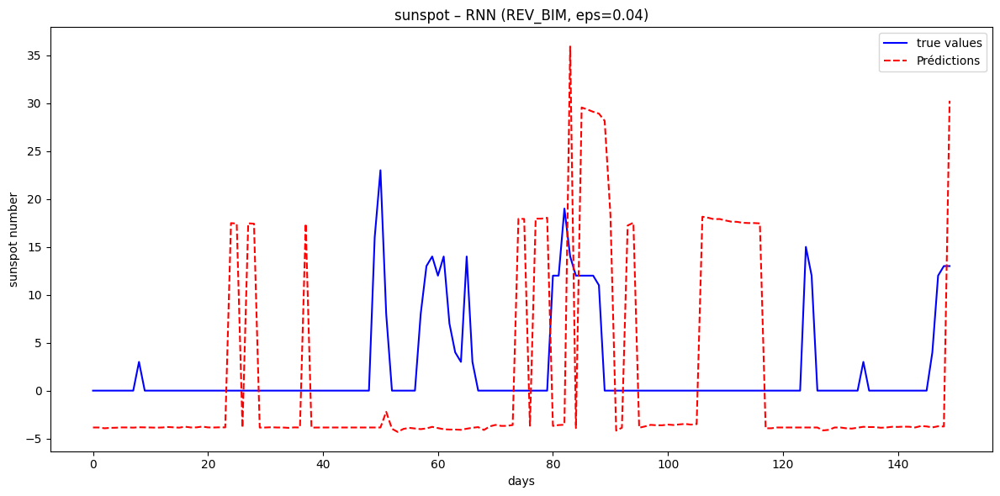

RNN | REV_BIM – Epsilon 0.05 – MAE: 9.6073 | SIM: 0.1683 | RMSE: 12.7735


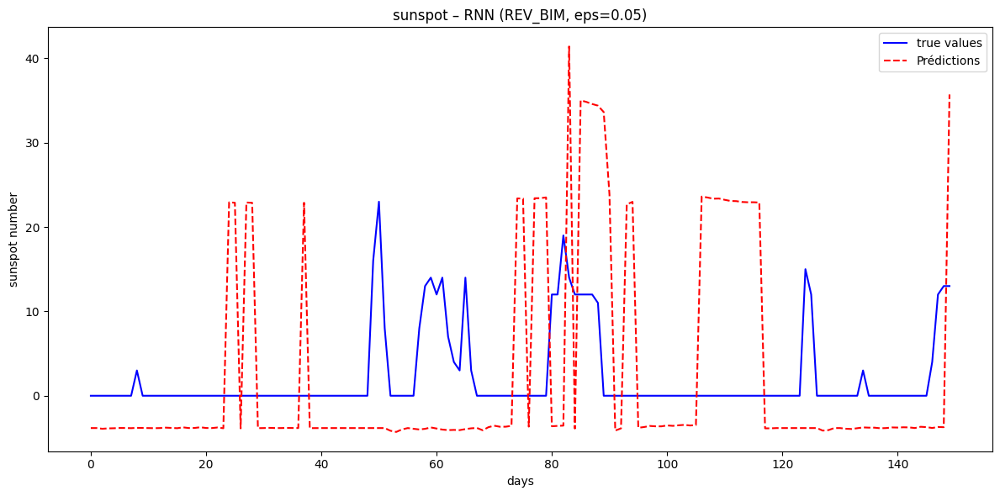

RNN | REV_BIM – Epsilon 0.07 – MAE: 11.8369 | SIM: 0.1815 | RMSE: 17.1711


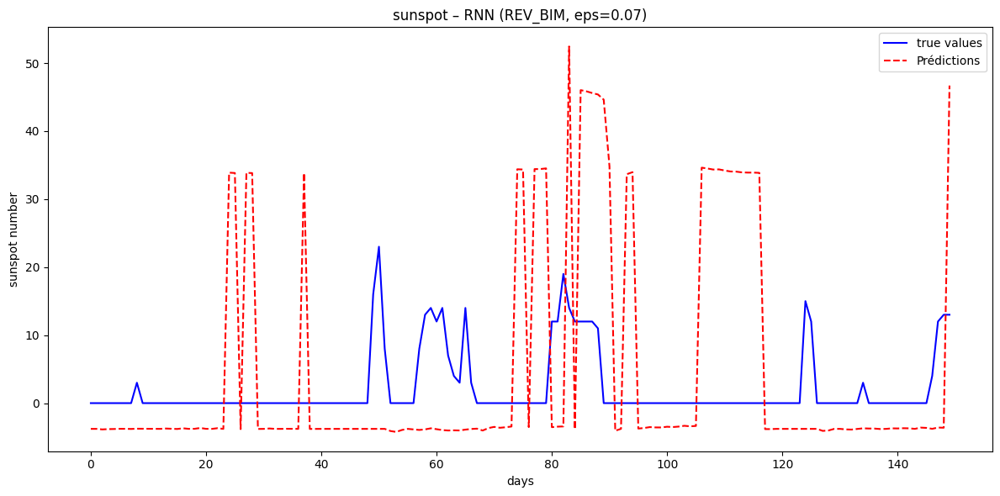

RNN | REV_BIM – Epsilon 0.10 – MAE: 15.1733 | SIM: 0.1911 | RMSE: 24.2876


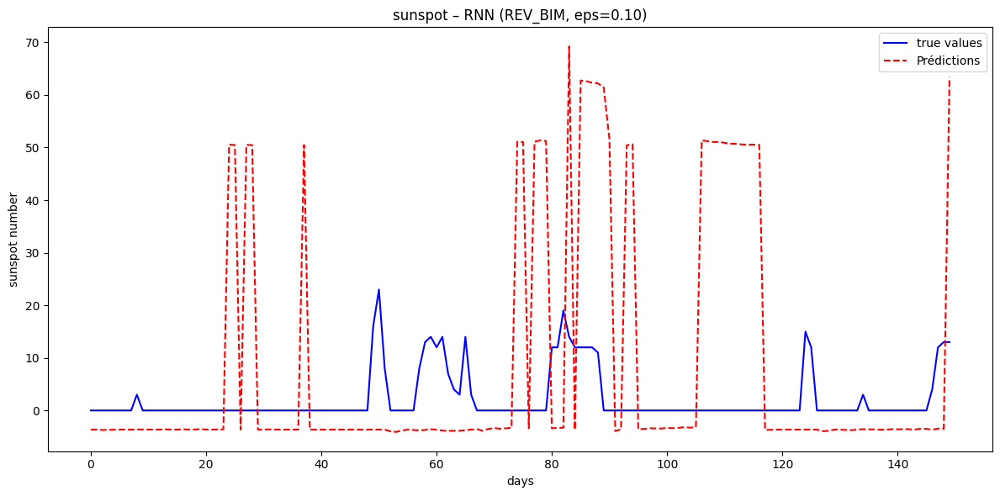

RNN | REV_BIM – Epsilon 0.20 – MAE: 26.3578 | SIM: 0.2039 | RMSE: 50.0258


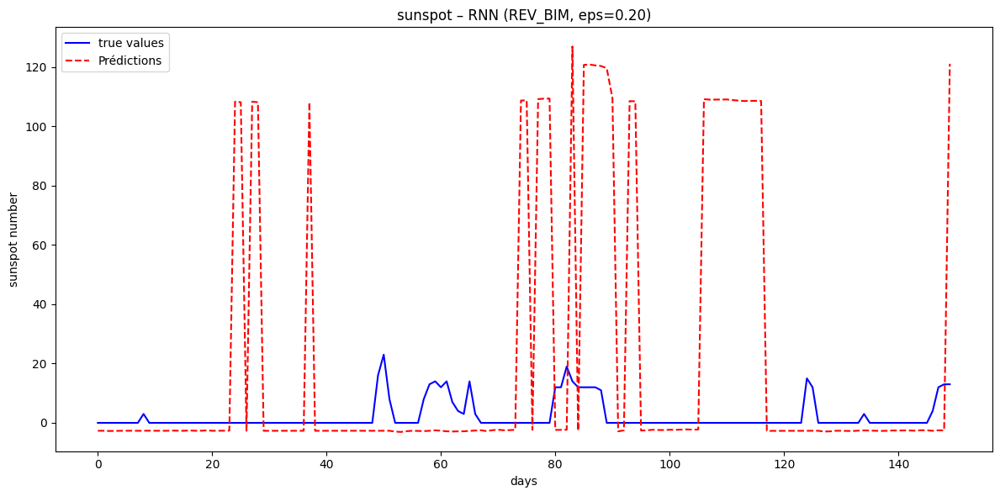

In [ ]:
alpha = 0.01
epsilons = [0.01, 0.02, 0.03, 0.04, 0.05, 0.075, 0.1, 0.2]

bim_attacks = [
    {
        "model_rev": model_gru_rev,
        "model_target": model_gru,
        "model_name": "GRU"
    },
    {
        "model_rev": model_rev,
        "model_target": model,
        "model_name": "LSTM"
    },
    {
        "model_rev": model_rnn_rev,
        "model_target": model_rnn,
        "model_name": "RNN"
    }
]

for attack in bim_attacks:
    for eps in epsilons:
        num_iter = int(eps / alpha)

        results_bim = reverse_forecast_attack_bim(
            model_rev=attack["model_rev"],
            model_normal=attack["model_target"],
            test_loader_rev=test_loader_rev,
            test_loader=test_loader,
            epsilons=[eps],
            price_min=serie_min_rev,
            price_max=serie_max_rev,
            alpha=alpha,
            num_iter=num_iter
        )

        for eps_val, (true_vals, preds) in results_bim.items():
            log_and_plot_solar(
              true_values=true_vals[-days_plot:],
              predictions=preds[-days_plot:],
              model_name=attack["model_name"],
              attack_name="REV_BIM",
              epsilon=eps_val,
              res_tab=res_tab_bim,
              similarity_fn=scalar_similarity,
              save_path=f"results/solar/SEED_{seed}/plots/REV_BIM/{eps_val}",
              save_png=True
            )


In [ ]:
display(res_tab_bim)

Attack         REV_BIM                                                        \
ε                 0.01      0.02       0.03       0.04       0.05       0.07   
Model Metric                                                                   
LSTM  MAE     5.423009  6.873418   8.828728  11.245909  12.189527  17.112474   
      RMSE    6.212211  7.992626  10.011724  13.008187  14.234338  19.745335   
      SIM     0.625728  0.617759   0.448003   0.492338   0.485758   0.387873   
RNN   MAE     4.570867  6.039794   7.369343   8.483415   9.607346  11.836908   
      RMSE    5.833380  7.287148   9.018573  10.772207  12.773477  17.171144   
      SIM     0.338617  0.190878   0.142789   0.158002   0.168315   0.181484   
GRU   MAE     1.607216  5.313994   9.996478  15.010465  20.199788  30.550104   
      RMSE    3.497538  5.780232  10.400905  15.393244  20.494832  30.746718   
      SIM     0.765470  0.701391   0.610951   0.559846   0.528776   0.493621   

Attack                              
ε                  0.10       0.20  
Model Metric                        
LSTM  MAE     24.601688  42.280899  
      RMSE    27.555956  46.850571  
      SIM      0.430795   0.414167  
RNN   MAE     15.173267  26.357818  
      RMSE    24.287592  50.025809  
      SIM      0.191093   0.203895  
GRU   MAE     46.115928  98.074064  
      RMSE    46.247226  98.141879  
      SIM      0.467719   0.438370

In [ ]:
display(res_tab)

Attack              NA      PAST       REV                                  \
ε                 0.00      0.00      0.01      0.02       0.03       0.04   
Model Metric                                                                 
LSTM  MAE     3.615005  0.763786  5.560682  6.774807  10.076182  11.039740   
      RMSE    4.303700  0.774650  6.401887  8.057109  12.157676  13.842708   
      SIM     0.747615  0.988682  0.569753  0.428765   0.494338   0.398318   
RNN   MAE     4.557478  0.020054  4.570867  6.039419   7.367487   8.478526   
      RMSE    5.359532  0.032018  5.833380  7.286775   9.016231  10.766578   
      SIM     0.458301  0.999978  0.338617  0.190838   0.142830   0.158117   
GRU   MAE     5.998473  0.647635  2.456927  7.122786  12.236771  17.647084   
      RMSE    6.644481  0.647856  3.713959  7.547613  12.638946  17.989903   
      SIM     0.261308  0.992886  0.777565  0.667910   0.592081   0.548637   

Attack                                                     
ε                  0.05       0.07       0.10        0.20  
Model Metric                                               
LSTM  MAE     15.068969  17.590271  21.174702   45.853580  
      RMSE    18.674997  23.926355  30.123519   63.513677  
      SIM      0.391148   0.383101   0.308120    0.261099  
RNN   MAE      9.561211  12.231944  14.895236   25.439305  
      RMSE    12.746113  18.255038  24.181568   49.425286  
      SIM      0.169842   0.187062   0.195473    0.209498  
GRU   MAE     23.192464  37.253569  51.592346  111.273579  
      RMSE    23.454976  37.418536  51.712313  111.330496  
      SIM      0.521373   0.484109   0.465228    0.436694

In [ ]:
model_surrogate = SimpleLSTM(input_size=1, hidden_size=64, output_size=1, num_layers=2)
optimizer_rev = torch.optim.Adam(model_surrogate.parameters(), lr=0.001)
model_surrogate.to(device)
train_models_elec(model_surrogate, loss_fn, optimizer_rev, num_epochs, train_loader,device)

Epoch [1/10], Train Loss: 0.0041
Epoch [2/10], Train Loss: 0.0021
Epoch [3/10], Train Loss: 0.0020
Epoch [4/10], Train Loss: 0.0020
Epoch [5/10], Train Loss: 0.0020
Epoch [6/10], Train Loss: 0.0020
Epoch [7/10], Train Loss: 0.0020
Epoch [8/10], Train Loss: 0.0020
Epoch [9/10], Train Loss: 0.0020
Epoch [10/10], Train Loss: 0.0020


In [ ]:
model_rnn_surrogate = SimpleRNN(input_size=1, hidden_size=64, output_size=1, num_layers=2)
optimizer_rev = torch.optim.Adam(model_rnn_surrogate.parameters(), lr=0.001)
model_rnn_surrogate.to(device)
train_models_elec(model_rnn_surrogate, loss_fn, optimizer_rev, num_epochs, train_loader,device)

Epoch [1/10], Train Loss: 0.0031
Epoch [2/10], Train Loss: 0.0021
Epoch [3/10], Train Loss: 0.0020
Epoch [4/10], Train Loss: 0.0020
Epoch [5/10], Train Loss: 0.0020
Epoch [6/10], Train Loss: 0.0020
Epoch [7/10], Train Loss: 0.0020
Epoch [8/10], Train Loss: 0.0020
Epoch [9/10], Train Loss: 0.0020
Epoch [10/10], Train Loss: 0.0020


In [ ]:
model_gru_surrogate = SimpleGRU(input_size=1, hidden_size=64, output_size=1, num_layers=2)
optimizer_rev = torch.optim.Adam(model_gru_surrogate.parameters(), lr=0.001)
model_gru_surrogate.to(device)
train_models_elec(model_gru_surrogate, loss_fn, optimizer_rev, num_epochs, train_loader,device)

Epoch [1/10], Train Loss: 0.0030
Epoch [2/10], Train Loss: 0.0020
Epoch [3/10], Train Loss: 0.0020
Epoch [4/10], Train Loss: 0.0019
Epoch [5/10], Train Loss: 0.0019
Epoch [6/10], Train Loss: 0.0020
Epoch [7/10], Train Loss: 0.0019
Epoch [8/10], Train Loss: 0.0019
Epoch [9/10], Train Loss: 0.0019
Epoch [10/10], Train Loss: 0.0019


In [ ]:
from attack.fgsm_surrogate import fgsm_surrogate_attack

GRU | FGSM_SURRO – Epsilon 0.01 – MAE: 1.9938 | SIM: 0.4965 | RMSE: 5.1139


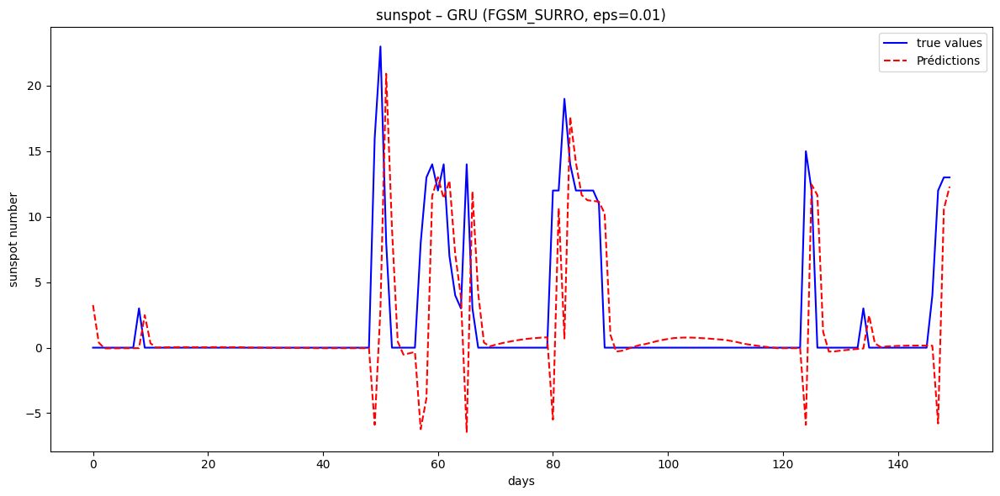

RNN | FGSM_SURRO – Epsilon 0.01 – MAE: 5.6716 | SIM: 0.1931 | RMSE: 6.7027


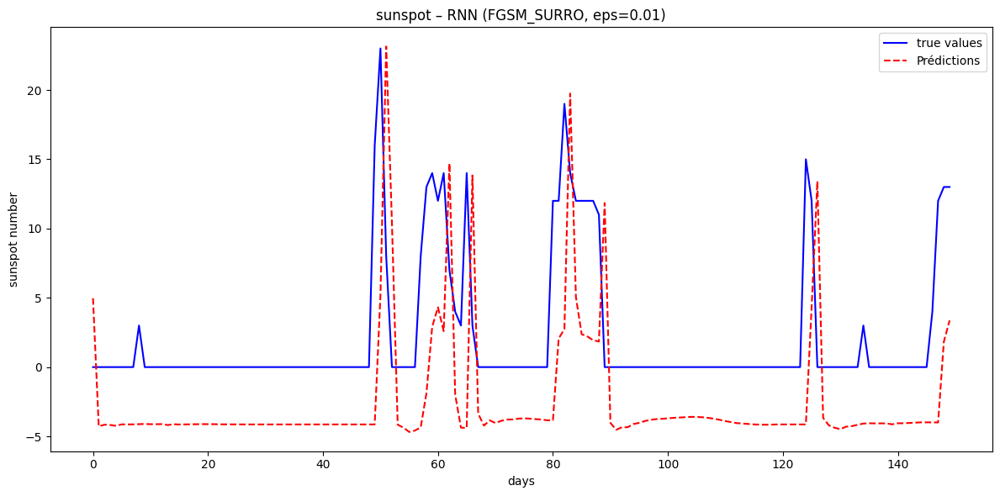

LSTM | FGSM_SURRO – Epsilon 0.01 – MAE: 5.8170 | SIM: 0.5395 | RMSE: 6.9649


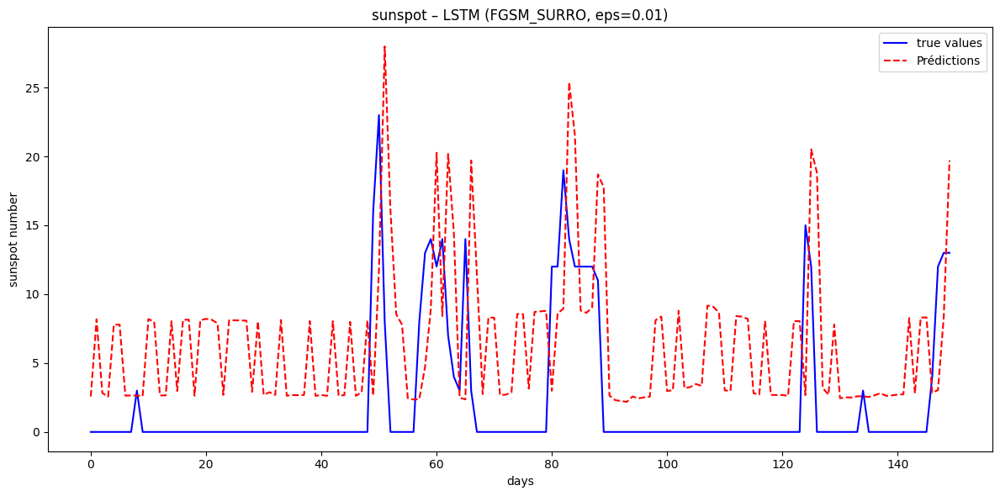

GRU | FGSM_SURRO – Epsilon 0.02 – MAE: 7.0207 | SIM: 0.3991 | RMSE: 8.1192


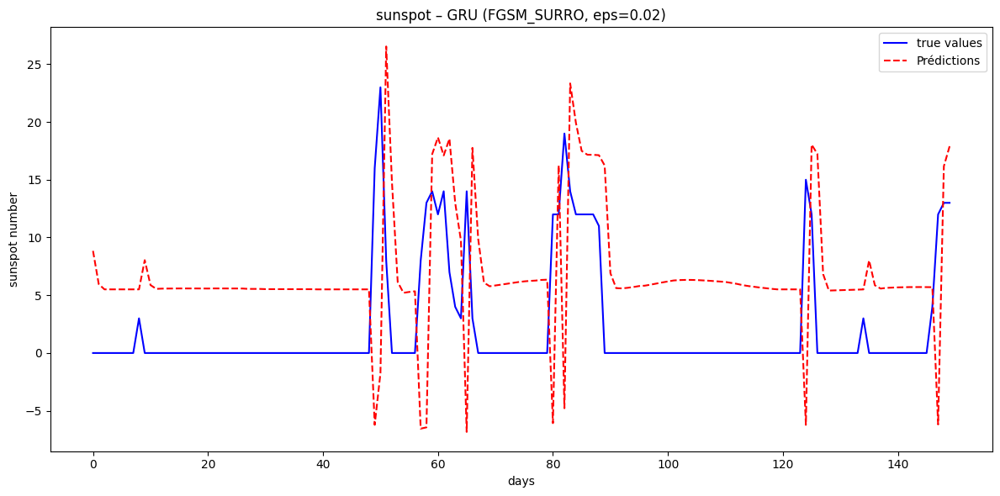

RNN | FGSM_SURRO – Epsilon 0.02 – MAE: 6.6010 | SIM: -0.0075 | RMSE: 8.1801


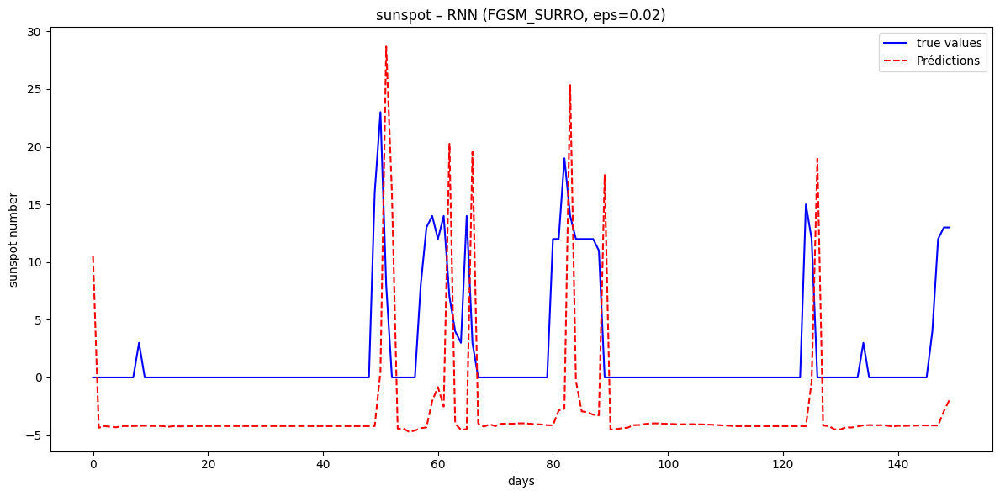

LSTM | FGSM_SURRO – Epsilon 0.02 – MAE: 8.6067 | SIM: 0.3859 | RMSE: 10.5126


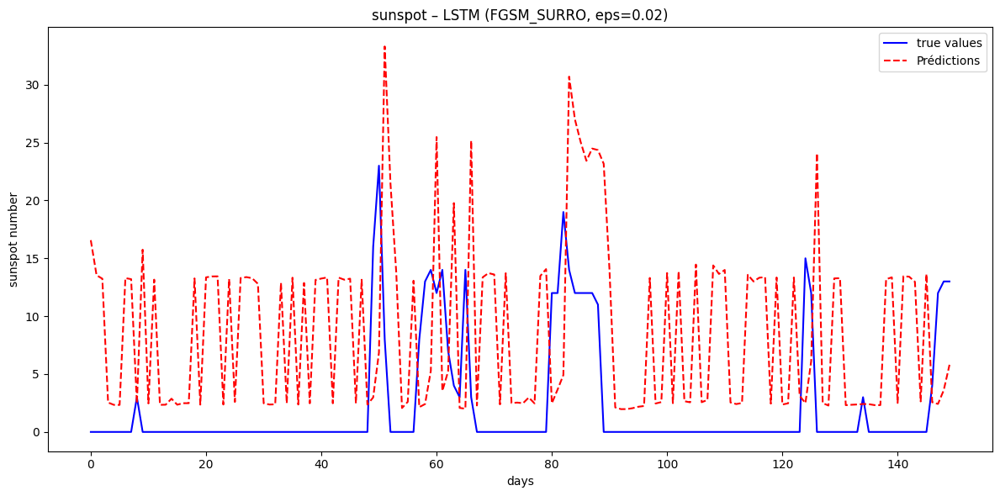

GRU | FGSM_SURRO – Epsilon 0.03 – MAE: 12.3484 | SIM: 0.3401 | RMSE: 12.7847


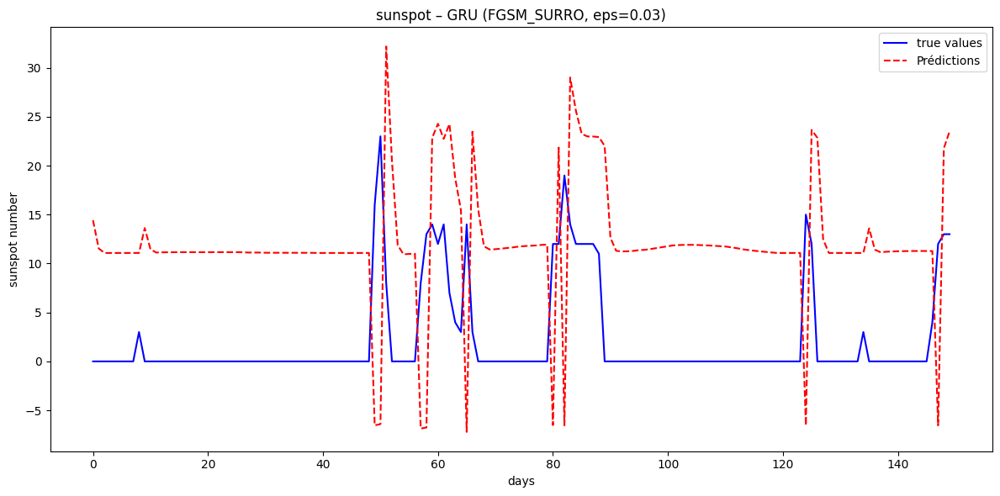

RNN | FGSM_SURRO – Epsilon 0.03 – MAE: 7.2051 | SIM: -0.0562 | RMSE: 9.2851


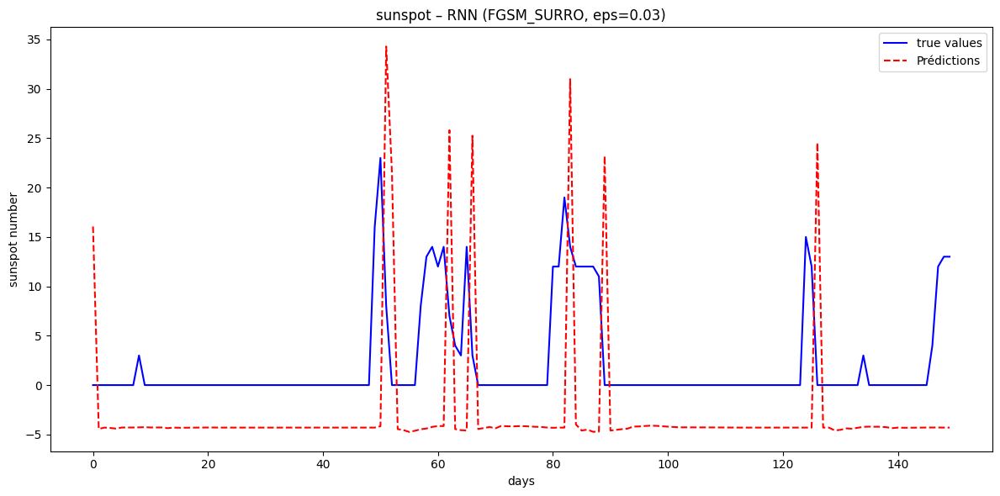

LSTM | FGSM_SURRO – Epsilon 0.03 – MAE: 10.8085 | SIM: 0.2846 | RMSE: 13.6957


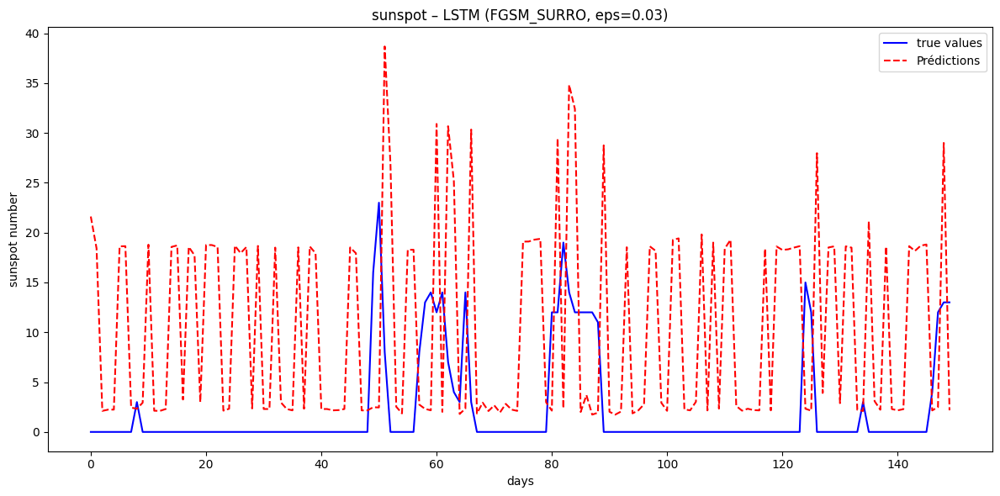

GRU | FGSM_SURRO – Epsilon 0.04 – MAE: 17.6441 | SIM: 0.3166 | RMSE: 17.8387


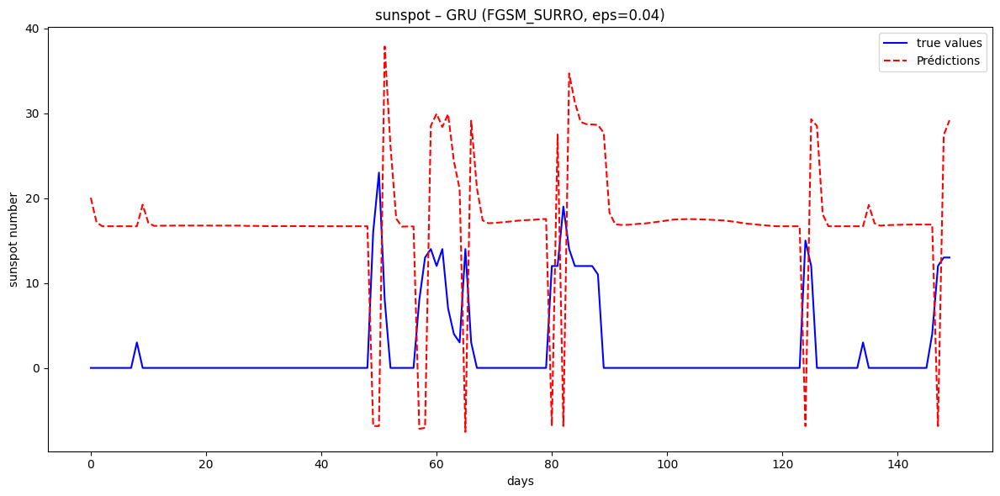

RNN | FGSM_SURRO – Epsilon 0.04 – MAE: 7.5773 | SIM: -0.0259 | RMSE: 10.0815


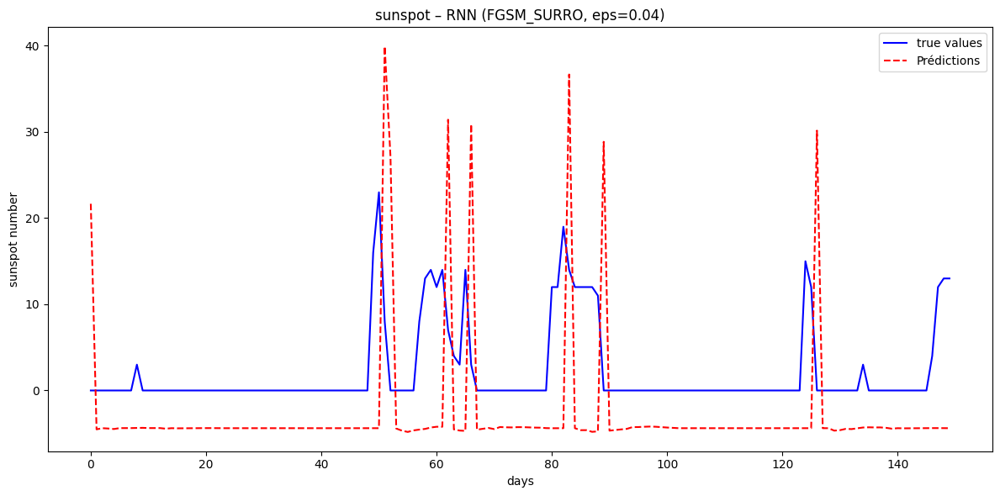

LSTM | FGSM_SURRO – Epsilon 0.04 – MAE: 13.2468 | SIM: 0.2491 | RMSE: 17.2317


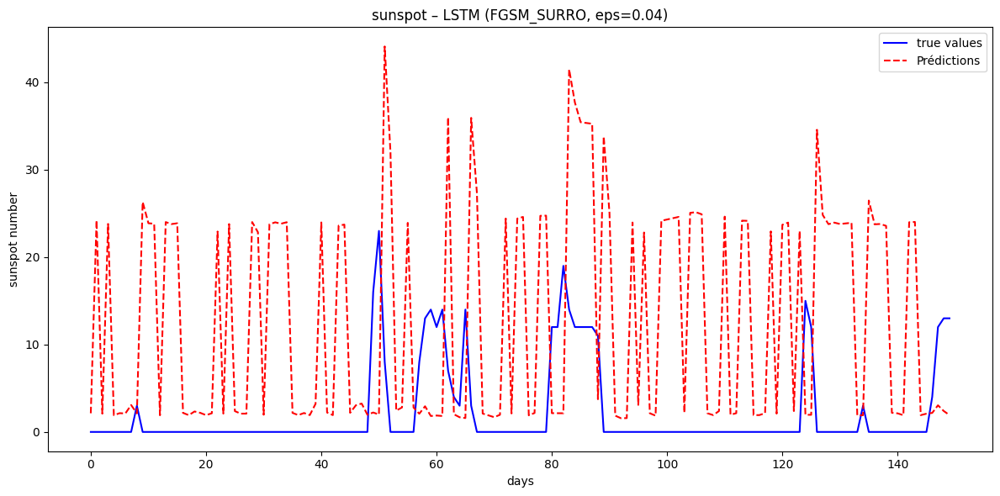

GRU | FGSM_SURRO – Epsilon 0.05 – MAE: 22.9594 | SIM: 0.3023 | RMSE: 23.0892


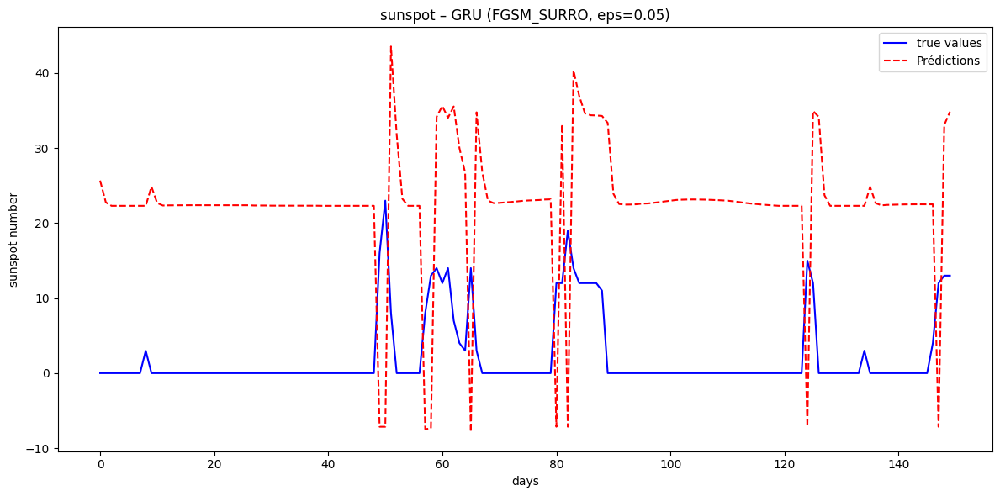

RNN | FGSM_SURRO – Epsilon 0.05 – MAE: 7.9391 | SIM: -0.0014 | RMSE: 10.9721


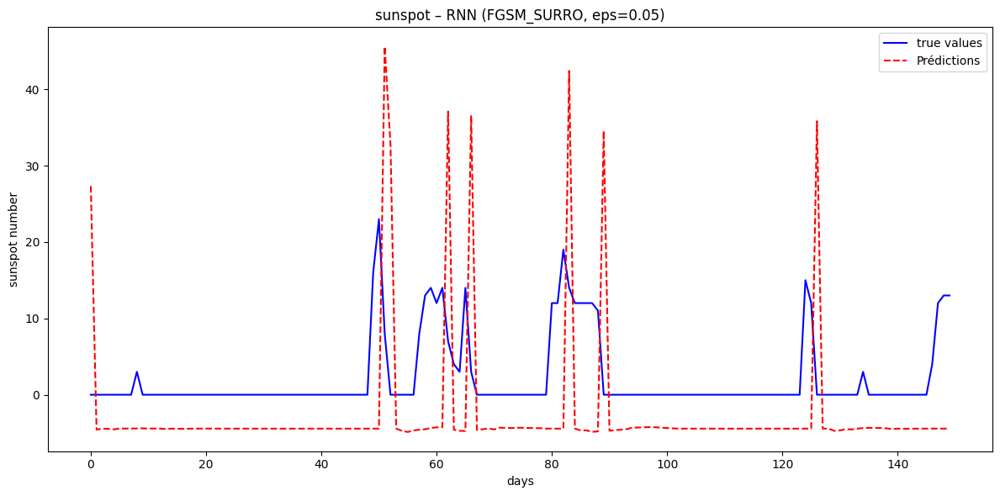

LSTM | FGSM_SURRO – Epsilon 0.05 – MAE: 17.1915 | SIM: 0.2574 | RMSE: 21.9168


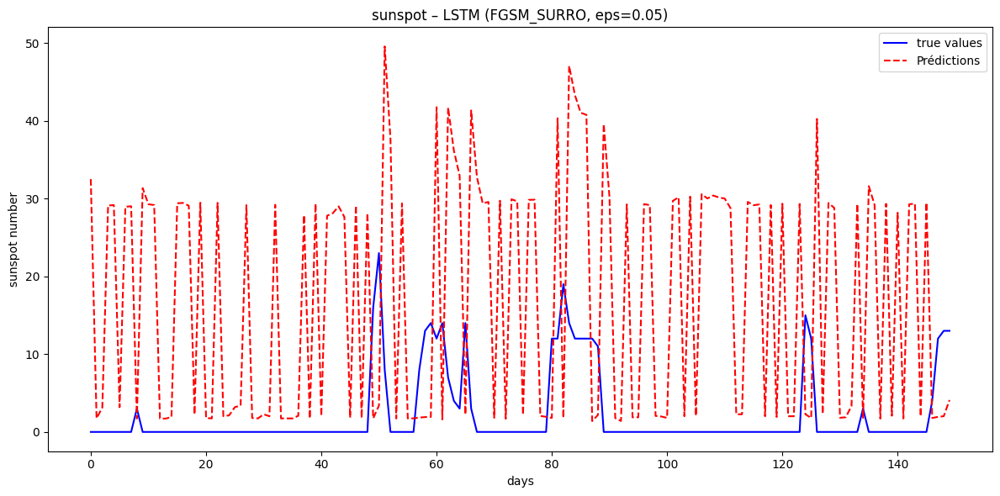

GRU | FGSM_SURRO – Epsilon 0.07 – MAE: 36.3435 | SIM: 0.2833 | RMSE: 36.5900


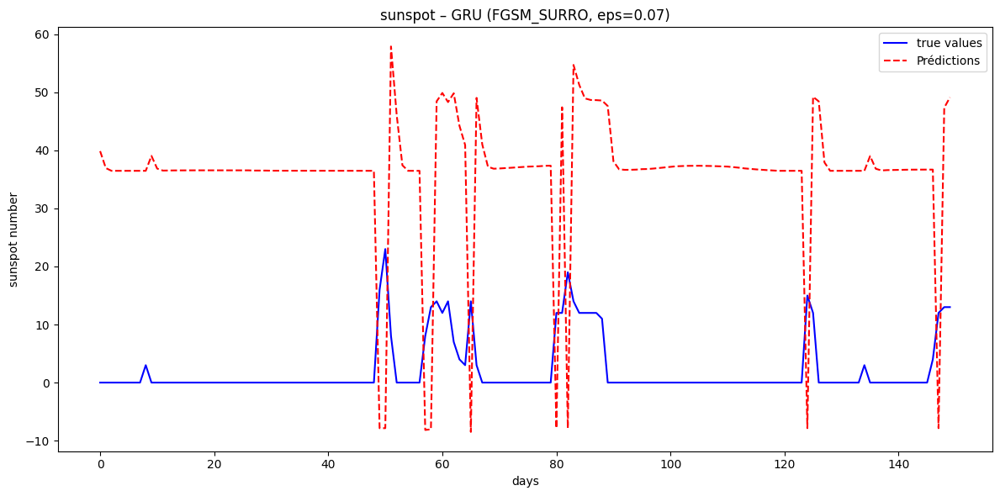

RNN | FGSM_SURRO – Epsilon 0.07 – MAE: 8.8216 | SIM: 0.0409 | RMSE: 13.5261


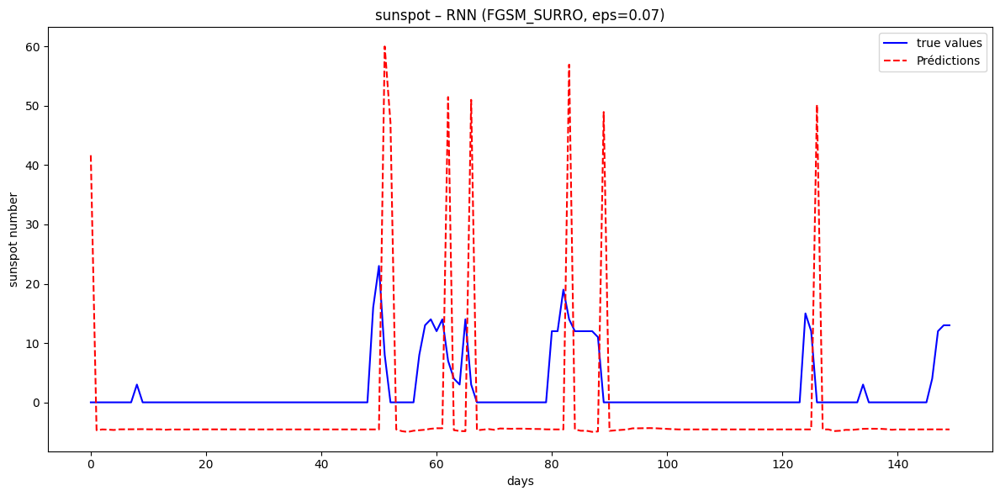

LSTM | FGSM_SURRO – Epsilon 0.07 – MAE: 20.9735 | SIM: 0.1386 | RMSE: 28.9778


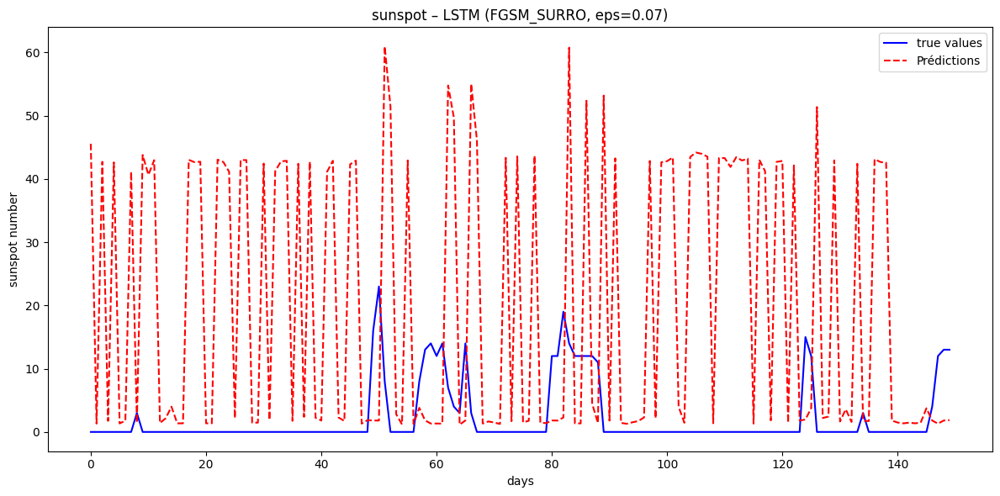

GRU | FGSM_SURRO – Epsilon 0.10 – MAE: 49.8583 | SIM: 0.2741 | RMSE: 50.3692


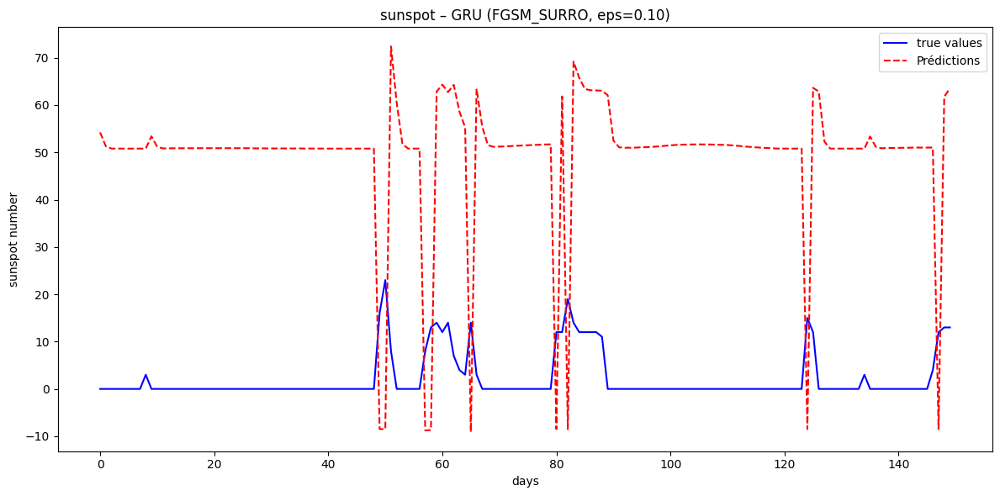

RNN | FGSM_SURRO – Epsilon 0.10 – MAE: 9.6763 | SIM: 0.0678 | RMSE: 16.4031


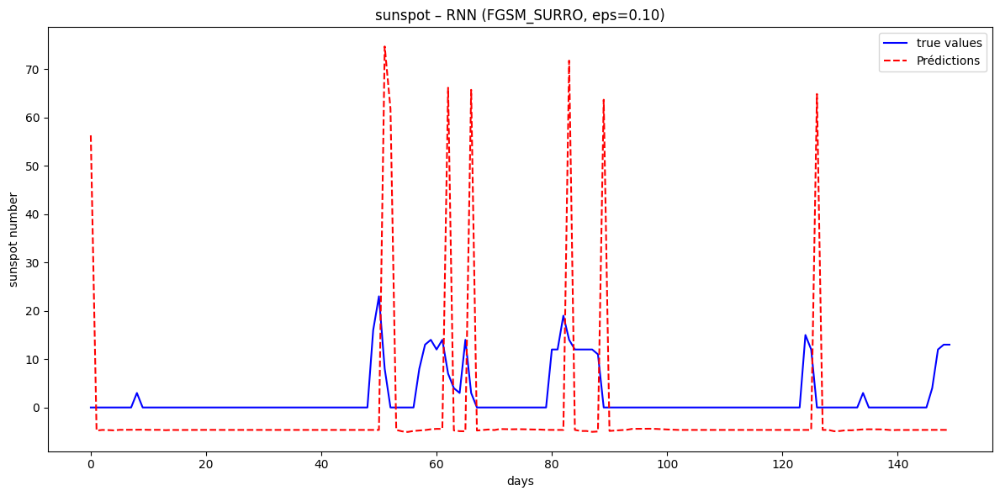

LSTM | FGSM_SURRO – Epsilon 0.10 – MAE: 30.8351 | SIM: 0.1979 | RMSE: 40.8789


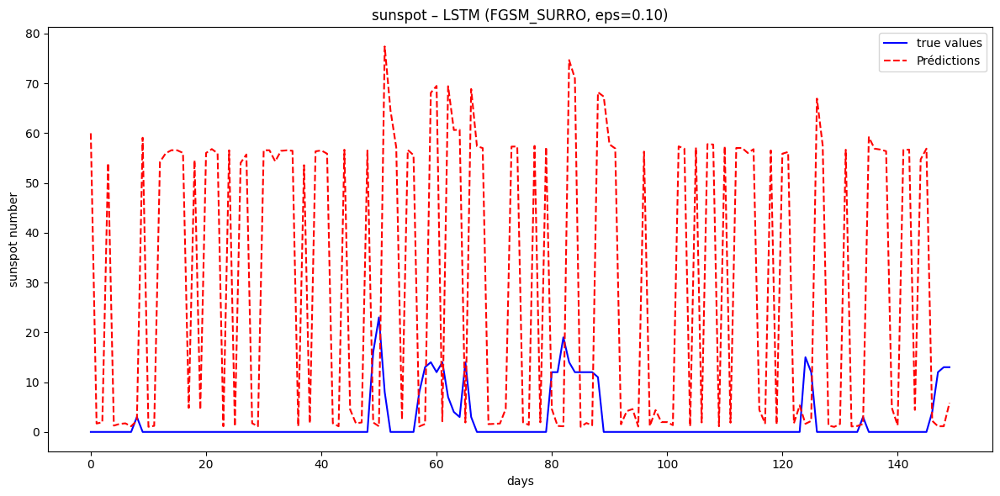

GRU | FGSM_SURRO – Epsilon 0.20 – MAE: 104.9540 | SIM: 0.2616 | RMSE: 106.9107


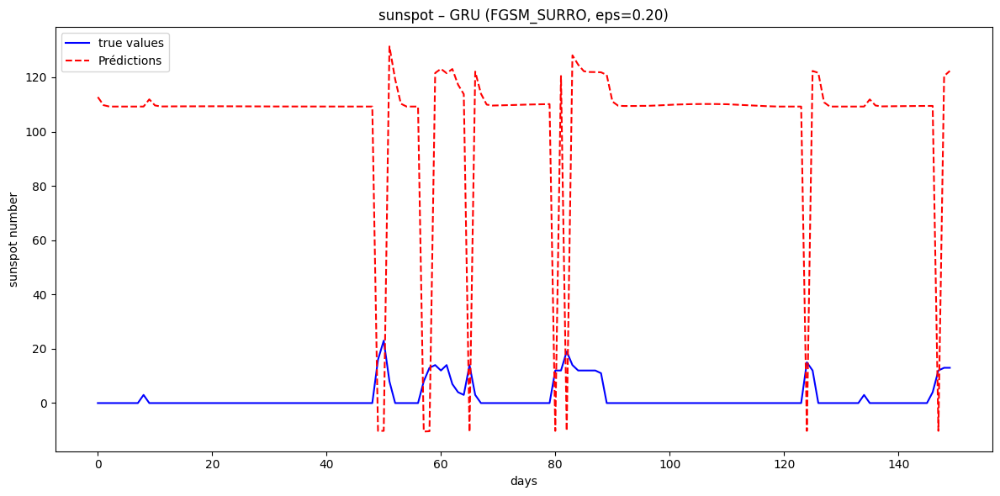

RNN | FGSM_SURRO – Epsilon 0.20 – MAE: 12.8095 | SIM: 0.1201 | RMSE: 29.4746


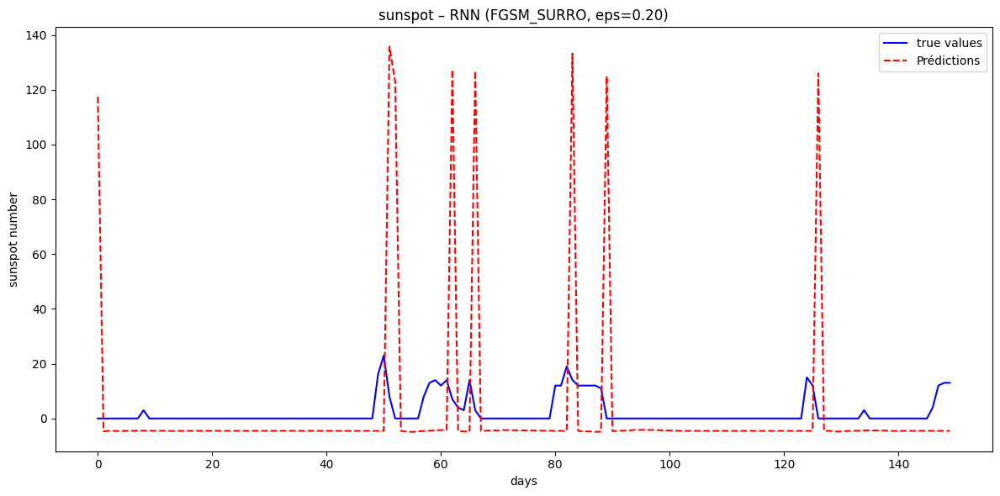

LSTM | FGSM_SURRO – Epsilon 0.20 – MAE: 58.8646 | SIM: 0.1781 | RMSE: 79.8680


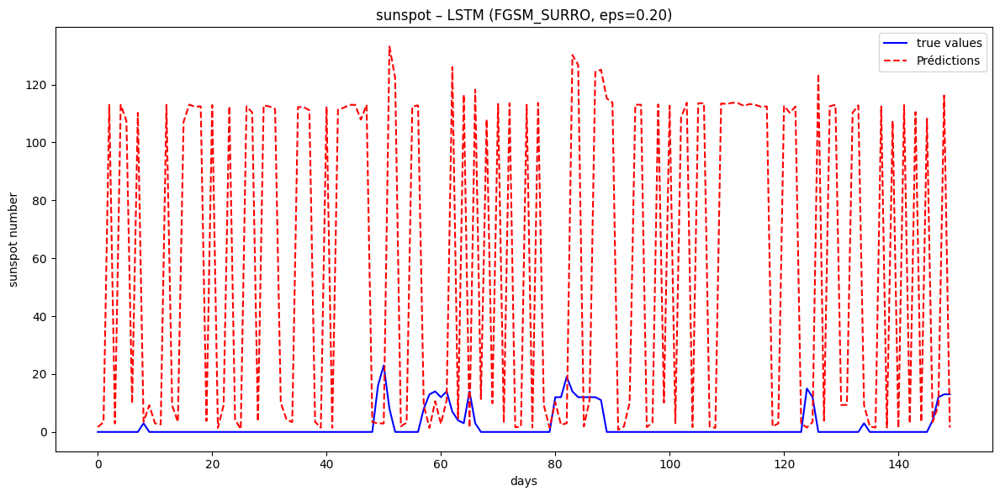

In [ ]:
for eps in epsilons:
    true_vals_surro, preds_surro = fgsm_surrogate_attack(
        model_gru_surrogate,
        model_gru,
        test_loader,
        eps,
        serie_min_rev, serie_max_rev
    )

    log_and_plot_solar(
        true_values=true_vals_surro[-days_plot:],
        predictions=preds_surro[-days_plot:],
        model_name='GRU',
        attack_name='FGSM_SURRO',
        epsilon=eps,
        res_tab=res_tab_bim,
        similarity_fn=scalar_similarity,
        save_path=f"results/solar/SEED_{seed}/plots/FGSM_SURRO/{eps}",
        save_png=True
    )

    true_vals_surro, preds_surro = fgsm_surrogate_attack(
        model_rnn_surrogate,
        model_rnn,
        test_loader,
        eps,
        serie_min_rev, serie_max_rev
    )

    log_and_plot_solar(
        true_values=true_vals_surro[-days_plot:],
        predictions=preds_surro[-days_plot:],
        model_name='RNN',
        attack_name='FGSM_SURRO',
        epsilon=eps,
        res_tab=res_tab_bim,
        similarity_fn=scalar_similarity,
        save_path=f"results/solar/SEED_{seed}/plots/FGSM_SURRO/{eps}",
        save_png=True
    )

    true_vals_surro, preds_surro = fgsm_surrogate_attack(
        model_surrogate,
        model,
        test_loader,
        eps,
        serie_min_rev, serie_max_rev
    )

    log_and_plot_solar(
        true_values=true_vals_surro[-days_plot:],
        predictions=preds_surro[-days_plot:],
        model_name='LSTM',
        attack_name='FGSM_SURRO',
        epsilon=eps,
        res_tab=res_tab_bim,
        similarity_fn=scalar_similarity,
        save_path=f"results/solar/SEED_{seed}/plots/FGSM_SURRO/{eps}",
        save_png=True
    )

In [ ]:
display(res_tab_bim)

Attack         REV_BIM                                                        \
ε                 0.01      0.02       0.03       0.04       0.05       0.07   
Model Metric                                                                   
LSTM  MAE     5.423009  6.873418   8.828728  11.245909  12.189527  17.112474   
      RMSE    6.212211  7.992626  10.011724  13.008187  14.234338  19.745335   
      SIM     0.625728  0.617759   0.448003   0.492338   0.485758   0.387873   
RNN   MAE     4.570867  6.039794   7.369343   8.483415   9.607346  11.836908   
      RMSE    5.833380  7.287148   9.018573  10.772207  12.773477  17.171144   
      SIM     0.338617  0.190878   0.142789   0.158002   0.168315   0.181484   
GRU   MAE     1.607216  5.313994   9.996478  15.010465  20.199788  30.550104   
      RMSE    3.497538  5.780232  10.400905  15.393244  20.494832  30.746718   
      SIM     0.765470  0.701391   0.610951   0.559846   0.528776   0.493621   

Attack                             FGSM_SURRO                        \
ε                  0.10       0.20       0.01       0.02       0.03   
Model Metric                                                          
LSTM  MAE     24.601688  42.280899   5.816965   8.606698  10.808479   
      RMSE    27.555956  46.850571   6.964888  10.512606  13.695669   
      SIM      0.430795   0.414167   0.539549   0.385899   0.284646   
RNN   MAE     15.173267  26.357818   5.671602   6.601032   7.205078   
      RMSE    24.287592  50.025809   6.702695   8.180050   9.285055   
      SIM      0.191093   0.203895   0.193078  -0.007519  -0.056180   
GRU   MAE     46.115928  98.074064   1.993775   7.020740  12.348378   
      RMSE    46.247226  98.141879   5.113904   8.119229  12.784742   
      SIM      0.467719   0.438370   0.496477   0.399147   0.340081   

Attack                                                                
ε                  0.04       0.05       0.07       0.10        0.20  
Model Metric                                                          
LSTM  MAE     13.246829  17.191495  20.973489  30.835090   58.864587  
      RMSE    17.231675  21.916831  28.977801  40.878900   79.867962  
      SIM      0.249052   0.257387   0.138582   0.197882    0.178079  
RNN   MAE      7.577330   7.939061   8.821610   9.676325   12.809486  
      RMSE    10.081464  10.972053  13.526139  16.403057   29.474625  
      SIM     -0.025928  -0.001443   0.040876   0.067784    0.120098  
GRU   MAE     17.644131  22.959372  36.343451  49.858308  104.954037  
      RMSE    17.838654  23.089218  36.589980  50.369200  106.910730  
      SIM      0.316633   0.302297   0.283308   0.274101    0.261648

In [ ]:
# Creation of the tab result for plotting adversial attack result
models = ['LSTM','RNN','GRU']
metrics = ['MAE', "RMSE", 'SIM']

row_index = pd.MultiIndex.from_product([models, metrics], names=['Model', 'Metric'])

attacks = ['BOUNDARY']
epsilons_attack = {
    'BOUNDARY':[0.01,0.02,0.03,0.04, 0.05, 0.075, 0.1, 0.2],
}

col_tuples = []
for atk, eps_list in epsilons_attack.items():
    for eps in eps_list:
        col_tuples.append((atk, f"{eps:.2f}"))

col_index = pd.MultiIndex.from_tuples(col_tuples, names=['Attack', 'ε'])

res_tab_boundary = pd.DataFrame(index=row_index, columns=col_index, dtype=float)

print(res_tab_boundary)

Attack       BOUNDARY                                   
ε                0.01 0.02 0.03 0.04 0.05 0.07 0.10 0.20
Model Metric                                            
LSTM  MAE         NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN
      RMSE        NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN
      SIM         NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN
RNN   MAE         NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN
      RMSE        NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN
      SIM         NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN
GRU   MAE         NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN
      RMSE        NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN
      SIM         NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN


In [ ]:
from attack.boundary import boundary_attack

In [ ]:
for eps in epsilons:
  delta = eps * 0.5
  eta = eps * 0.25
  num_iter = int(20 + 200 * eps)
  true_vals_bondary, preds_bondary = boundary_attack(
      model_gru,
      test_loader,
      eps,
      serie_min_rev, serie_max_rev,
      num_iter,delta,eta
  )

  log_and_plot_solar(
      true_values=true_vals_bondary[-days_plot:],
      predictions=preds_bondary[-days_plot:],
      model_name='GRU',
      attack_name='BOUNDARY',
      epsilon=eps,
      res_tab=res_tab_boundary,
      similarity_fn=scalar_similarity,
      save_path=f"results/solar/SEED_{seed}/plots/BOUNDARY/{eps}",
      save_png=True
  )

  true_vals_bondary, preds_bondary = boundary_attack(
      model,
      test_loader,
      eps,
      serie_min_rev, serie_max_rev,
      num_iter,delta,eta
  )

  log_and_plot_solar(
      true_values=true_vals_bondary[-days_plot:],
      predictions=preds_bondary[-days_plot:],
      model_name='LSTM',
      attack_name='BOUNDARY',
      epsilon=eps,
      res_tab=res_tab_boundary,
      similarity_fn=scalar_similarity,
      save_path=f"results/solar/SEED_{seed}/plots/BOUNDARY/{eps}",
      save_png=True
  )

  true_vals_bondary, preds_bondary = boundary_attack(
      model_rnn,
      test_loader,
      eps,
      serie_min_rev, serie_max_rev,
      num_iter,delta,eta
  )

  log_and_plot_solar(
      true_values=true_vals_bondary[-days_plot:],
      predictions=preds_bondary[-days_plot:],
      model_name='RNN',
      attack_name='BOUNDARY',
      epsilon=eps,
      res_tab=res_tab_boundary,
      similarity_fn=scalar_similarity,
      save_path=f"results/solar/SEED_{seed}/plots/BOUNDARY/{eps}",
      save_png=True
  )

In [ ]:
display(res_tab_boundary)

In [ ]:
result = pd.concat([res_tab, res_tab_bim,res_tab_fgsm,res_tab_boundary], axis=1)

# Affichage du résultat
display(result)
result.to_excel(f"results/solar/SEED_{seed}/result.xlsx")

In [ ]:
from getpass import getpass

token = getpass("GitHub Token: ")

username = "Samy-Annasri"
repo = "ReverseForecastAttack"
branch = "main"  # ou 'master' selon ton repo
folder_path = f"results/solar/SEED_{seed}/"
!git add {folder_path}

!git config --global user.email "samyannasri.pro@gmail.com"
!git config --global user.name "Samy Annasri"

!git add {folder_path}
!git commit -m "add res for SEED 888"
!git remote set-url origin https://{token}@github.com/{username}/{repo}.git
!git push origin {branch}